In [1]:
# imports
import os, sys

# third party imports
import numpy as np
import tqdm
import tensorflow as tf
import voxelmorph as vxm
import neurite as ne
import matplotlib.pyplot as plt

2022-10-08 23:52:24.256458: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-08 23:52:24.496058: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-08 23:52:25.085115: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-10.0/lib64:/home/saumya/Enter/envs/tf/lib/
2022-10-08 23:52:25.085226: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.

In [2]:
# Conform test data.
def conform(x, in_shape = (256,) * 2):
    '''Resize and normalize image.'''
    x = np.float32(x)
    x = ne.utils.minmax_norm(x)
    x = ne.utils.zoom(x, zoom_factor=[o / i for o, i in zip(in_shape, x.shape)])
    return np.expand_dims(x, axis=(0, -1))


In [3]:
def plot_history(hist, loss_name='loss'):
    # Simple function to plot training history.
    plt.figure()
    plt.plot(hist.epoch, hist.history[loss_name], '.-')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

In [4]:
def vxm_data_generator_hybrid(real_generator, synth_generator, alpha_real=0.9, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """    
    while True:
        if np.random.rand()<alpha_real:
          yield next(synth_generator)
        else:          
          yield next(real_generator)

In [5]:
def vxm_data_generator_real(x_data, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """

    # preliminary sizing
    vol_shape = x_data.shape[1:] # extract data shape
    ndims = len(vol_shape)
    
    # prepare a zero array the size of the deformation
    # we'll explain this below
    zero_phi = np.zeros([batch_size, *vol_shape, ndims])
    
    while True:
        # prepare inputs:
        # images need to be of the size [batch_size, H, W, 1]
        idx1 = np.random.randint(0, x_data.shape[0], size=batch_size)
        moving_images = x_data[idx1, ..., np.newaxis]
        idx2 = np.random.randint(0, x_data.shape[0], size=batch_size)
        fixed_images = x_data[idx2, ..., np.newaxis]
        inputs = [moving_images, fixed_images]
        
        # prepare outputs (the 'true' moved image):
        # of course, we don't have this, but we know we want to compare 
        # the resulting moved image with the fixed image. 
        # we also wish to penalize the deformation field. 
        outputs = [fixed_images, zero_phi]
        
        yield (inputs, outputs)

def vxm_data_generator_synth(x_data, label_to_image, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """

    # preliminary sizing
    vol_shape = x_data.shape[1:] # extract data shape
    ndims = len(vol_shape)
    
    # prepare a zero array the size of the deformation
    # we'll explain this below
    zero_phi = np.zeros([batch_size, *vol_shape, ndims])
    
    while True:
        # prepare inputs:
        # images need to be of the size [batch_size, H, W, 1]
        idx1 = np.random.randint(0, x_data.shape[0], size=batch_size)
        moving_images = x_data[idx1, ..., np.newaxis]
        idx2 = np.random.randint(0, x_data.shape[0], size=batch_size)
        fixed_images = x_data[idx2, ..., np.newaxis]
        inputs = [label_to_image(moving_images), label_to_image(fixed_images)]
        
        # prepare outputs (the 'true' moved image):
        # of course, we don't have this, but we know we want to compare 
        # the resulting moved image with the fixed image. 
        # we also wish to penalize the deformation field. 
        outputs = [fixed_images, zero_phi]
        
        yield (inputs, outputs)

In [6]:
class SynthLabels():
    def __init__(self, num_label=16, num_maps=250):
        # Input shapes.
        self.in_shape = (256,) * 2
        self.num_dim = len(self.in_shape)
        self.num_label = num_label
        self.num_maps = num_maps
        gen_arg = dict(
            in_shape=self.in_shape,
            in_label_list=np.arange(16),
            warp_std=3,
            warp_res=(8, 16, 32),
        )
        self.gen_model = ne.models.labels_to_image(**gen_arg, id=1)

    def label_maps(self):
        # Shape generation.
        self.label_maps = []
        self.label_maps = np.zeros((self.num_maps, 256, 256))
        for i in tqdm.tqdm(range(self.num_maps)):
            # Draw image and warp.
            im = ne.utils.augment.draw_perlin(
                out_shape=(*self.in_shape, self.num_label),
                scales=(32, 64), max_std=1,
            )
            warp = ne.utils.augment.draw_perlin(
                out_shape=(*self.in_shape, self.num_label, self.num_dim),
                scales=(16, 32, 64), max_std=16,
            )
            # Transform and create label map.
            im = vxm.utils.transform(im, warp)
            lab = tf.argmax(im, axis=-1)
            self.label_maps[i] = np.uint8(lab)
        return self.label_maps
    
    def visualize_labels(self, num_row = 2, per_row = 10):
        # Visualize shapes.
        for i in range(0, num_row * per_row, per_row):
            ne.plot.slices(self.label_maps[i:i + per_row], cmaps=['tab20c']) 
    
    def label_to_image(self, sample):
      return self.gen_model.predict(sample)[0]

2022-10-08 23:52:27.155635: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-08 23:52:28.663600: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15787 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:3b:00.0, compute capability: 7.0
2022-10-08 23:52:28.664555: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 14322 MB memory:  -> device: 1, name: Tesla V100-PCIE-16GB, pci bus id: 0000:af:00.0, compute capability: 7.0


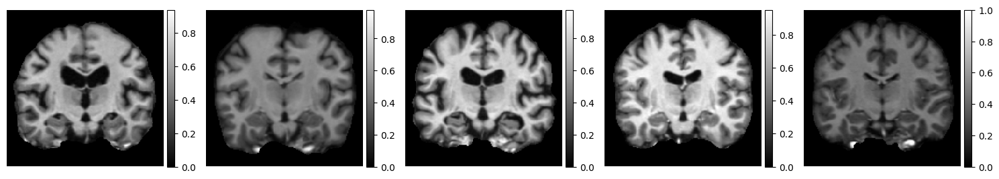

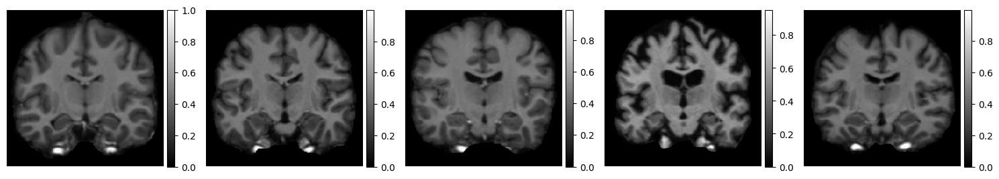

In [7]:
#Loading the dataset
images = ne.py.data.load_dataset('2D-OASIS-TUTORIAL')
conformed_images = [conform(img) for img in images]
#label_maps_real = [(img*15).astype('int').reshape(256, 256) for img in conformed_images]
label_maps_real = [img.reshape(256, 256) for img in conformed_images]


# Visualizing the dataset.
num_row = 2
per_row = 5
for i in range(0, num_row * per_row, per_row):
    ne.plot.slices(label_maps_real[i:i + per_row], cmaps=['gray'], do_colorbars=True)

In [8]:
class VxmTest():
    def __init__(self, ndim = 2, unet_input_features = 2):
        self.ndim = ndim
        self.unet_input_features = unet_input_features
    #CNN model
        # configure unet input shape (concatenation of moving and fixed images)
        self.vol_shape = real_train.shape[1:]
        # configure unet features 
        self.nb_features = [
            [32, 32, 32, 32],         # encoder features
            [32, 32, 32, 32, 32, 16]  # decoder features
        ]
        
        
    def CNNvxm(self, real_gen=None, synth_gen=None, val_generator=None, alpha_real=0.9):
        self.vxm_model = vxm.networks.VxmDense(self.vol_shape, nb_unet_features=None, int_steps=0)
        self.losses = ['mse', vxm.losses.Grad('l2').loss]
        self.loss_weights = [1, 0.01]
        self.vxm_model.compile(optimizer=tf.keras.optimizers.Adam(lr=1e-4), loss=self.losses, loss_weights=self.loss_weights)
        
        if synth_gen is None:
          self.train_generator = real_gen
        elif real_gen is None:
          self.train_generator = synth_gen
        else:
          self.train_generator = vxm_data_generator_hybrid(real_gen, synth_gen, alpha_real=alpha_real)
        self.val_generator = val_generator

        self.in_sample, self.out_sample = next(self.train_generator)
        def Visual():
            # visualize
            images = [img[0, :, :, 0] for img in self.in_sample + self.out_sample]
            titles = ['moving', 'fixed', 'moved ground-truth (fixed)', 'zeros']
            ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);
        Visual()
        
    def train(self, total_epo):
        self.hist = self.vxm_model.fit(self.train_generator, epochs=total_epo,
                                       steps_per_epoch=10, verbose=2,
                                       validation_data=self.val_generator,
                                       validation_steps = 100);
        plot_history(self.hist)
        
    def RegPred(self, val_input):
        self.val_pred = self.vxm_model.predict(val_input)
        #visualise
        def Visual():
            images = [img[0, :, :, 0] for img in val_input + self.val_pred] 
            titles = ['moving', 'fixed', 'moved', 'flow']
            ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);
        Visual()
        return self.val_pred

In [9]:
SynthIm = SynthLabels()
label_maps_synth = SynthIm.label_maps()
#SynthIm.visualize_labels()

100%|█████████████████████████████████████████| 250/250 [01:26<00:00,  2.89it/s]


In [10]:
#Fixing data + spliting

#conversion of labels in range of [0,1]
label_maps_real = np.array(label_maps_real)
label_maps_synth = np.array(label_maps_synth)
#label_maps_real = label_maps_real.astype('float')/15
#label_maps_synth = label_maps_synth.astype('float')/15
#label_maps_hy = np.zeros((250, 256, 256))
#label_maps_hy[::2] = [i for i in label_maps_real[:125, ...]]
#label_maps_hy[1::2] = [i for i in label_maps_synth[:125, ...]]
#label_maps_hy = np.array(label_maps_hy)

#data split 
Data_split_train = 250
real_train = label_maps_real[:250, ...]
test_val_no = 82
real_val = label_maps_real[250:332, ...]
real_test = label_maps_real[-82:, ...]

In [11]:
# create the training data generator
train_generator = vxm_data_generator_real(real_train, batch_size = 8)
train_input, _ = next(train_generator)

# create the validation data generator
val_generator = vxm_data_generator_real(real_val, batch_size = 8)
val_input, _ = next(val_generator)

# create synthetic data generator
synth_generator = vxm_data_generator_synth(label_maps_synth, SynthIm.label_to_image, batch_size=8)
synth_input, _ = next(synth_generator)

2022-10-08 23:54:12.313823: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


1/1 [==============================] - 0s 119ms/step


In [12]:
for i in range(50, 250, 50):
    exec(f'few_shot_train_{i} = label_maps_real[:i, ...]')
# create the few shot data generator
    exec(f'few_generator_{i} = vxm_data_generator_real(few_shot_train_{i}, batch_size = 8)')
    exec(f'few_input_{i}, _ = next(few_generator_{i})')

1/1 [==============================] - 0s 122ms/step


/home/saumya/Enter/envs/tf/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1/1 [==============================] - 0s 119ms/step


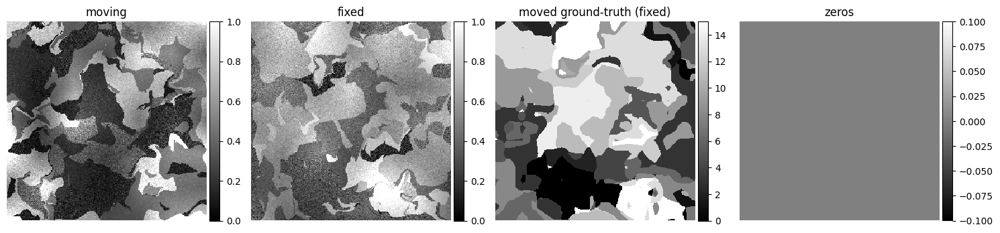

1/1 [==============================] - 0s 116ms/step
Epoch 1/2000
1/1 [==============================] - 0s 123ms/step
10/10 - 11s - loss: 70.8633 - vxm_dense_transformer_loss: 70.8633 - vxm_dense_flow_loss: 2.3394e-06 - val_loss: 0.0305 - val_vxm_dense_transformer_loss: 0.0305 - val_vxm_dense_flow_loss: 2.2338e-06 - 11s/epoch - 1s/step
Epoch 2/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 72.8254 - vxm_dense_transformer_loss: 72.8254 - vxm_dense_flow_loss: 5.9085e-05 - val_loss: 0.0304 - val_vxm_dense_transformer_loss: 0.0304 - val_vxm_dense_flow_loss: 3.6205e-05 - 7s/epoch - 699ms/step
Epoch 3/2000
1/1 [==============================] - 0s 202ms/step
10/10 - 7s - loss: 73.3417 - vxm_dense_transformer_loss: 73.3417 - vxm_dense_flow_loss: 4.0024e-04 - val_loss: 0.0309 - val_vxm_dense_transformer_loss: 0.0309 - val_vxm_dense_flow_loss: 2.6552e-04 - 7s/epoch - 694ms/step
Epoch 4/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 70

1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 67.7542 - vxm_dense_transformer_loss: 67.7477 - vxm_dense_flow_loss: 0.6478 - val_loss: 0.0608 - val_vxm_dense_transformer_loss: 0.0576 - val_vxm_dense_flow_loss: 0.3164 - 7s/epoch - 700ms/step
Epoch 14/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 70.9123 - vxm_dense_transformer_loss: 70.9035 - vxm_dense_flow_loss: 0.8839 - val_loss: 0.0647 - val_vxm_dense_transformer_loss: 0.0605 - val_vxm_dense_flow_loss: 0.4178 - 7s/epoch - 685ms/step
Epoch 15/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 66.8534 - vxm_dense_transformer_loss: 66.8436 - vxm_dense_flow_loss: 0.9839 - val_loss: 0.0681 - val_vxm_dense_transformer_loss: 0.0638 - val_vxm_dense_flow_loss: 0.4339 - 7s/epoch - 693ms/step
Epoch 16/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 71.5904 - vxm_dense_transformer_loss: 71.5808 - vxm_dense_flow_loss: 0.9562 - val_loss: 

Epoch 20/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 68.9979 - vxm_dense_transformer_loss: 68.9874 - vxm_dense_flow_loss: 1.0560 - val_loss: 0.0738 - val_vxm_dense_transformer_loss: 0.0692 - val_vxm_dense_flow_loss: 0.4594 - 7s/epoch - 700ms/step
Epoch 21/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 69.9895 - vxm_dense_transformer_loss: 69.9792 - vxm_dense_flow_loss: 1.0222 - val_loss: 0.0779 - val_vxm_dense_transformer_loss: 0.0735 - val_vxm_dense_flow_loss: 0.4486 - 7s/epoch - 691ms/step
Epoch 22/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 72.3015 - vxm_dense_transformer_loss: 72.2905 - vxm_dense_flow_loss: 1.1069 - val_loss: 0.0790 - val_vxm_dense_transformer_loss: 0.0737 - val_vxm_dense_flow_loss: 0.5362 - 7s/epoch - 689ms/step
Epoch 23/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 69.2860 - vxm_dense_transformer_loss: 69.2741 - vxm_dense_flow_loss: 1.191

1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 68.3436 - vxm_dense_transformer_loss: 68.3283 - vxm_dense_flow_loss: 1.5350 - val_loss: 0.0875 - val_vxm_dense_transformer_loss: 0.0811 - val_vxm_dense_flow_loss: 0.6428 - 7s/epoch - 686ms/step
Epoch 33/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 70.1624 - vxm_dense_transformer_loss: 70.1475 - vxm_dense_flow_loss: 1.4924 - val_loss: 0.0896 - val_vxm_dense_transformer_loss: 0.0829 - val_vxm_dense_flow_loss: 0.6702 - 7s/epoch - 694ms/step
Epoch 34/2000
1/1 [==============================] - 0s 199ms/step
10/10 - 7s - loss: 70.0354 - vxm_dense_transformer_loss: 70.0198 - vxm_dense_flow_loss: 1.5649 - val_loss: 0.0887 - val_vxm_dense_transformer_loss: 0.0827 - val_vxm_dense_flow_loss: 0.6063 - 7s/epoch - 693ms/step
Epoch 35/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 67.4615 - vxm_dense_transformer_loss: 67.4453 - vxm_dense_flow_loss: 1.6180 - val_loss: 

1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 66.6112 - vxm_dense_transformer_loss: 66.5916 - vxm_dense_flow_loss: 1.9578 - val_loss: 0.0861 - val_vxm_dense_transformer_loss: 0.0814 - val_vxm_dense_flow_loss: 0.4692 - 7s/epoch - 684ms/step
Epoch 46/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 68.2213 - vxm_dense_transformer_loss: 68.2030 - vxm_dense_flow_loss: 1.8272 - val_loss: 0.0911 - val_vxm_dense_transformer_loss: 0.0856 - val_vxm_dense_flow_loss: 0.5496 - 7s/epoch - 679ms/step
Epoch 47/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 70.2284 - vxm_dense_transformer_loss: 70.2093 - vxm_dense_flow_loss: 1.9072 - val_loss: 0.1009 - val_vxm_dense_transformer_loss: 0.0935 - val_vxm_dense_flow_loss: 0.7415 - 7s/epoch - 672ms/step
Epoch 48/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 68.6918 - vxm_dense_transformer_loss: 68.6715 - vxm_dense_flow_loss: 2.0326 - val_loss: 

1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 71.3507 - vxm_dense_transformer_loss: 71.3311 - vxm_dense_flow_loss: 1.9552 - val_loss: 0.0956 - val_vxm_dense_transformer_loss: 0.0903 - val_vxm_dense_flow_loss: 0.5249 - 7s/epoch - 669ms/step
Epoch 52/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 68.7125 - vxm_dense_transformer_loss: 68.6929 - vxm_dense_flow_loss: 1.9626 - val_loss: 0.0922 - val_vxm_dense_transformer_loss: 0.0876 - val_vxm_dense_flow_loss: 0.4567 - 7s/epoch - 665ms/step
Epoch 53/2000
1/1 [==============================] - 0s 173ms/step
10/10 - 7s - loss: 70.1339 - vxm_dense_transformer_loss: 70.1135 - vxm_dense_flow_loss: 2.0387 - val_loss: 0.0944 - val_vxm_dense_transformer_loss: 0.0887 - val_vxm_dense_flow_loss: 0.5659 - 7s/epoch - 660ms/step
Epoch 54/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 68.7867 - vxm_dense_transformer_loss: 68.7668 - vxm_dense_flow_loss: 1.9866 - val_loss: 

1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 69.4854 - vxm_dense_transformer_loss: 69.4627 - vxm_dense_flow_loss: 2.2695 - val_loss: 0.0960 - val_vxm_dense_transformer_loss: 0.0908 - val_vxm_dense_flow_loss: 0.5195 - 7s/epoch - 666ms/step
Epoch 65/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 69.5193 - vxm_dense_transformer_loss: 69.4960 - vxm_dense_flow_loss: 2.3314 - val_loss: 0.0921 - val_vxm_dense_transformer_loss: 0.0873 - val_vxm_dense_flow_loss: 0.4848 - 7s/epoch - 664ms/step
Epoch 66/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 6s - loss: 69.6965 - vxm_dense_transformer_loss: 69.6743 - vxm_dense_flow_loss: 2.2247 - val_loss: 0.0938 - val_vxm_dense_transformer_loss: 0.0882 - val_vxm_dense_flow_loss: 0.5611 - 6s/epoch - 646ms/step
Epoch 67/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 7s - loss: 67.4958 - vxm_dense_transformer_loss: 67.4744 - vxm_dense_flow_loss: 2.1439 - val_loss: 

Epoch 71/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 64.6197 - vxm_dense_transformer_loss: 64.5943 - vxm_dense_flow_loss: 2.5405 - val_loss: 0.1000 - val_vxm_dense_transformer_loss: 0.0948 - val_vxm_dense_flow_loss: 0.5182 - 7s/epoch - 675ms/step
Epoch 72/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 70.1291 - vxm_dense_transformer_loss: 70.1048 - vxm_dense_flow_loss: 2.4337 - val_loss: 0.0956 - val_vxm_dense_transformer_loss: 0.0905 - val_vxm_dense_flow_loss: 0.5052 - 7s/epoch - 677ms/step
Epoch 73/2000
1/1 [==============================] - 0s 206ms/step
10/10 - 7s - loss: 68.0593 - vxm_dense_transformer_loss: 68.0356 - vxm_dense_flow_loss: 2.3687 - val_loss: 0.0977 - val_vxm_dense_transformer_loss: 0.0920 - val_vxm_dense_flow_loss: 0.5711 - 7s/epoch - 737ms/step
Epoch 74/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 71.2848 - vxm_dense_transformer_loss: 71.2610 - vxm_dense_flow_loss: 2.374

1/1 [==============================] - 0s 207ms/step
10/10 - 7s - loss: 69.9018 - vxm_dense_transformer_loss: 69.8760 - vxm_dense_flow_loss: 2.5845 - val_loss: 0.1006 - val_vxm_dense_transformer_loss: 0.0947 - val_vxm_dense_flow_loss: 0.5898 - 7s/epoch - 672ms/step
Epoch 84/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 69.8054 - vxm_dense_transformer_loss: 69.7786 - vxm_dense_flow_loss: 2.6797 - val_loss: 0.0993 - val_vxm_dense_transformer_loss: 0.0939 - val_vxm_dense_flow_loss: 0.5478 - 7s/epoch - 666ms/step
Epoch 85/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 69.2834 - vxm_dense_transformer_loss: 69.2554 - vxm_dense_flow_loss: 2.8009 - val_loss: 0.0957 - val_vxm_dense_transformer_loss: 0.0900 - val_vxm_dense_flow_loss: 0.5723 - 7s/epoch - 663ms/step
Epoch 86/2000
1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 68.5057 - vxm_dense_transformer_loss: 68.4792 - vxm_dense_flow_loss: 2.6532 - val_loss: 

1/1 [==============================] - 0s 201ms/step
10/10 - 7s - loss: 70.3354 - vxm_dense_transformer_loss: 70.3074 - vxm_dense_flow_loss: 2.8035 - val_loss: 0.0939 - val_vxm_dense_transformer_loss: 0.0880 - val_vxm_dense_flow_loss: 0.5892 - 7s/epoch - 675ms/step
Epoch 97/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 67.0726 - vxm_dense_transformer_loss: 67.0457 - vxm_dense_flow_loss: 2.6855 - val_loss: 0.0932 - val_vxm_dense_transformer_loss: 0.0876 - val_vxm_dense_flow_loss: 0.5542 - 7s/epoch - 658ms/step
Epoch 98/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 66.6528 - vxm_dense_transformer_loss: 66.6261 - vxm_dense_flow_loss: 2.6676 - val_loss: 0.0986 - val_vxm_dense_transformer_loss: 0.0929 - val_vxm_dense_flow_loss: 0.5762 - 7s/epoch - 666ms/step
Epoch 99/2000
1/1 [==============================] - 0s 199ms/step
10/10 - 7s - loss: 68.9744 - vxm_dense_transformer_loss: 68.9454 - vxm_dense_flow_loss: 2.9073 - val_loss: 

1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 67.4962 - vxm_dense_transformer_loss: 67.4682 - vxm_dense_flow_loss: 2.8020 - val_loss: 0.1017 - val_vxm_dense_transformer_loss: 0.0948 - val_vxm_dense_flow_loss: 0.6910 - 7s/epoch - 690ms/step
Epoch 110/2000
1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 66.2912 - vxm_dense_transformer_loss: 66.2601 - vxm_dense_flow_loss: 3.1052 - val_loss: 0.0997 - val_vxm_dense_transformer_loss: 0.0933 - val_vxm_dense_flow_loss: 0.6390 - 7s/epoch - 666ms/step
Epoch 111/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 67.3613 - vxm_dense_transformer_loss: 67.3332 - vxm_dense_flow_loss: 2.8098 - val_loss: 0.0965 - val_vxm_dense_transformer_loss: 0.0908 - val_vxm_dense_flow_loss: 0.5651 - 7s/epoch - 668ms/step
Epoch 112/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 66.9667 - vxm_dense_transformer_loss: 66.9374 - vxm_dense_flow_loss: 2.9254 - val_los

1/1 [==============================] - 0s 203ms/step
10/10 - 7s - loss: 67.6829 - vxm_dense_transformer_loss: 67.6524 - vxm_dense_flow_loss: 3.0534 - val_loss: 0.0958 - val_vxm_dense_transformer_loss: 0.0903 - val_vxm_dense_flow_loss: 0.5529 - 7s/epoch - 651ms/step
Epoch 122/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 6s - loss: 67.9787 - vxm_dense_transformer_loss: 67.9502 - vxm_dense_flow_loss: 2.8579 - val_loss: 0.0990 - val_vxm_dense_transformer_loss: 0.0932 - val_vxm_dense_flow_loss: 0.5735 - 6s/epoch - 624ms/step
Epoch 123/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 70.5595 - vxm_dense_transformer_loss: 70.5288 - vxm_dense_flow_loss: 3.0762 - val_loss: 0.0953 - val_vxm_dense_transformer_loss: 0.0889 - val_vxm_dense_flow_loss: 0.6384 - 7s/epoch - 669ms/step
Epoch 124/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 6s - loss: 67.5573 - vxm_dense_transformer_loss: 67.5291 - vxm_dense_flow_loss: 2.8259 - val_los

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 67.1414 - vxm_dense_transformer_loss: 67.1104 - vxm_dense_flow_loss: 3.1020 - val_loss: 0.1085 - val_vxm_dense_transformer_loss: 0.1013 - val_vxm_dense_flow_loss: 0.7173 - 7s/epoch - 666ms/step
Epoch 135/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 69.4536 - vxm_dense_transformer_loss: 69.4239 - vxm_dense_flow_loss: 2.9715 - val_loss: 0.1110 - val_vxm_dense_transformer_loss: 0.1030 - val_vxm_dense_flow_loss: 0.8037 - 7s/epoch - 664ms/step
Epoch 136/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 70.9135 - vxm_dense_transformer_loss: 70.8827 - vxm_dense_flow_loss: 3.0764 - val_loss: 0.1151 - val_vxm_dense_transformer_loss: 0.1071 - val_vxm_dense_flow_loss: 0.7991 - 7s/epoch - 671ms/step
Epoch 137/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 69.2304 - vxm_dense_transformer_loss: 69.1992 - vxm_dense_flow_loss: 3.1206 - val_los

1/1 [==============================] - 0s 199ms/step
10/10 - 6s - loss: 67.4185 - vxm_dense_transformer_loss: 67.3870 - vxm_dense_flow_loss: 3.1571 - val_loss: 0.1017 - val_vxm_dense_transformer_loss: 0.0945 - val_vxm_dense_flow_loss: 0.7250 - 6s/epoch - 646ms/step
Epoch 148/2000
1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 71.0021 - vxm_dense_transformer_loss: 70.9710 - vxm_dense_flow_loss: 3.1058 - val_loss: 0.1013 - val_vxm_dense_transformer_loss: 0.0939 - val_vxm_dense_flow_loss: 0.7385 - 7s/epoch - 652ms/step
Epoch 149/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 65.8251 - vxm_dense_transformer_loss: 65.7939 - vxm_dense_flow_loss: 3.1208 - val_loss: 0.1049 - val_vxm_dense_transformer_loss: 0.0978 - val_vxm_dense_flow_loss: 0.7160 - 7s/epoch - 654ms/step
Epoch 150/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 68.6811 - vxm_dense_transformer_loss: 68.6498 - vxm_dense_flow_loss: 3.1299 - val_los

1/1 [==============================] - 0s 182ms/step
10/10 - 6s - loss: 69.2009 - vxm_dense_transformer_loss: 69.1692 - vxm_dense_flow_loss: 3.1686 - val_loss: 0.0989 - val_vxm_dense_transformer_loss: 0.0924 - val_vxm_dense_flow_loss: 0.6468 - 6s/epoch - 641ms/step
Epoch 160/2000
1/1 [==============================] - 0s 167ms/step
10/10 - 6s - loss: 70.9494 - vxm_dense_transformer_loss: 70.9167 - vxm_dense_flow_loss: 3.2714 - val_loss: 0.1010 - val_vxm_dense_transformer_loss: 0.0941 - val_vxm_dense_flow_loss: 0.6896 - 6s/epoch - 642ms/step
Epoch 161/2000
1/1 [==============================] - 0s 167ms/step
10/10 - 6s - loss: 69.2763 - vxm_dense_transformer_loss: 69.2426 - vxm_dense_flow_loss: 3.3696 - val_loss: 0.1045 - val_vxm_dense_transformer_loss: 0.0969 - val_vxm_dense_flow_loss: 0.7598 - 6s/epoch - 631ms/step
Epoch 162/2000
1/1 [==============================] - 0s 165ms/step
10/10 - 6s - loss: 69.8112 - vxm_dense_transformer_loss: 69.7788 - vxm_dense_flow_loss: 3.2366 - val_los

1/1 [==============================] - 0s 196ms/step
10/10 - 6s - loss: 70.1695 - vxm_dense_transformer_loss: 70.1356 - vxm_dense_flow_loss: 3.3916 - val_loss: 0.1101 - val_vxm_dense_transformer_loss: 0.1011 - val_vxm_dense_flow_loss: 0.9021 - 6s/epoch - 644ms/step
Epoch 173/2000
1/1 [==============================] - 0s 211ms/step
10/10 - 7s - loss: 68.7150 - vxm_dense_transformer_loss: 68.6814 - vxm_dense_flow_loss: 3.3535 - val_loss: 0.1066 - val_vxm_dense_transformer_loss: 0.0984 - val_vxm_dense_flow_loss: 0.8169 - 7s/epoch - 661ms/step
Epoch 174/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 65.4807 - vxm_dense_transformer_loss: 65.4472 - vxm_dense_flow_loss: 3.3466 - val_loss: 0.1116 - val_vxm_dense_transformer_loss: 0.1030 - val_vxm_dense_flow_loss: 0.8684 - 7s/epoch - 653ms/step
Epoch 175/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 69.3982 - vxm_dense_transformer_loss: 69.3655 - vxm_dense_flow_loss: 3.2660 - val_los

1/1 [==============================] - 0s 180ms/step
10/10 - 6s - loss: 68.7478 - vxm_dense_transformer_loss: 68.7137 - vxm_dense_flow_loss: 3.4116 - val_loss: 0.1104 - val_vxm_dense_transformer_loss: 0.1022 - val_vxm_dense_flow_loss: 0.8268 - 6s/epoch - 639ms/step
Epoch 186/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 6s - loss: 68.5138 - vxm_dense_transformer_loss: 68.4795 - vxm_dense_flow_loss: 3.4340 - val_loss: 0.1081 - val_vxm_dense_transformer_loss: 0.1003 - val_vxm_dense_flow_loss: 0.7840 - 6s/epoch - 640ms/step
Epoch 187/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 70.4543 - vxm_dense_transformer_loss: 70.4186 - vxm_dense_flow_loss: 3.5659 - val_loss: 0.1055 - val_vxm_dense_transformer_loss: 0.0975 - val_vxm_dense_flow_loss: 0.7959 - 7s/epoch - 665ms/step
Epoch 188/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 70.9031 - vxm_dense_transformer_loss: 70.8685 - vxm_dense_flow_loss: 3.4572 - val_los

1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 67.0585 - vxm_dense_transformer_loss: 67.0235 - vxm_dense_flow_loss: 3.4978 - val_loss: 0.1061 - val_vxm_dense_transformer_loss: 0.0981 - val_vxm_dense_flow_loss: 0.8062 - 7s/epoch - 678ms/step
Epoch 198/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 67.1785 - vxm_dense_transformer_loss: 67.1446 - vxm_dense_flow_loss: 3.3884 - val_loss: 0.1104 - val_vxm_dense_transformer_loss: 0.1019 - val_vxm_dense_flow_loss: 0.8504 - 7s/epoch - 676ms/step
Epoch 199/2000
1/1 [==============================] - 0s 201ms/step
10/10 - 7s - loss: 66.6696 - vxm_dense_transformer_loss: 66.6336 - vxm_dense_flow_loss: 3.6022 - val_loss: 0.1027 - val_vxm_dense_transformer_loss: 0.0944 - val_vxm_dense_flow_loss: 0.8322 - 7s/epoch - 676ms/step
Epoch 200/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 71.6026 - vxm_dense_transformer_loss: 71.5667 - vxm_dense_flow_loss: 3.5950 - val_los

1/1 [==============================] - 0s 199ms/step
10/10 - 7s - loss: 65.7390 - vxm_dense_transformer_loss: 65.7026 - vxm_dense_flow_loss: 3.6386 - val_loss: 0.1091 - val_vxm_dense_transformer_loss: 0.0999 - val_vxm_dense_flow_loss: 0.9201 - 7s/epoch - 674ms/step
Epoch 211/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 66.4080 - vxm_dense_transformer_loss: 66.3721 - vxm_dense_flow_loss: 3.5906 - val_loss: 0.1100 - val_vxm_dense_transformer_loss: 0.1010 - val_vxm_dense_flow_loss: 0.8941 - 7s/epoch - 673ms/step
Epoch 212/2000
1/1 [==============================] - 0s 203ms/step
10/10 - 7s - loss: 69.2018 - vxm_dense_transformer_loss: 69.1650 - vxm_dense_flow_loss: 3.6788 - val_loss: 0.1157 - val_vxm_dense_transformer_loss: 0.1070 - val_vxm_dense_flow_loss: 0.8723 - 7s/epoch - 666ms/step
Epoch 213/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 70.7180 - vxm_dense_transformer_loss: 70.6823 - vxm_dense_flow_loss: 3.5764 - val_los

1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 70.5266 - vxm_dense_transformer_loss: 70.4891 - vxm_dense_flow_loss: 3.7479 - val_loss: 0.1064 - val_vxm_dense_transformer_loss: 0.0979 - val_vxm_dense_flow_loss: 0.8510 - 7s/epoch - 680ms/step
Epoch 224/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 68.4697 - vxm_dense_transformer_loss: 68.4324 - vxm_dense_flow_loss: 3.7297 - val_loss: 0.1135 - val_vxm_dense_transformer_loss: 0.1047 - val_vxm_dense_flow_loss: 0.8763 - 7s/epoch - 671ms/step
Epoch 225/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 67.9115 - vxm_dense_transformer_loss: 67.8748 - vxm_dense_flow_loss: 3.6669 - val_loss: 0.1108 - val_vxm_dense_transformer_loss: 0.1022 - val_vxm_dense_flow_loss: 0.8575 - 7s/epoch - 665ms/step
Epoch 226/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 66.5661 - vxm_dense_transformer_loss: 66.5293 - vxm_dense_flow_loss: 3.6814 - val_los

1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 69.7113 - vxm_dense_transformer_loss: 69.6726 - vxm_dense_flow_loss: 3.8739 - val_loss: 0.1092 - val_vxm_dense_transformer_loss: 0.0997 - val_vxm_dense_flow_loss: 0.9536 - 7s/epoch - 675ms/step
Epoch 236/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 69.5664 - vxm_dense_transformer_loss: 69.5289 - vxm_dense_flow_loss: 3.7504 - val_loss: 0.1109 - val_vxm_dense_transformer_loss: 0.1011 - val_vxm_dense_flow_loss: 0.9872 - 7s/epoch - 657ms/step
Epoch 237/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 70.1756 - vxm_dense_transformer_loss: 70.1365 - vxm_dense_flow_loss: 3.9122 - val_loss: 0.1167 - val_vxm_dense_transformer_loss: 0.1075 - val_vxm_dense_flow_loss: 0.9247 - 7s/epoch - 660ms/step
Epoch 238/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 70.1628 - vxm_dense_transformer_loss: 70.1245 - vxm_dense_flow_loss: 3.8321 - val_los

1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 69.5442 - vxm_dense_transformer_loss: 69.5043 - vxm_dense_flow_loss: 3.9965 - val_loss: 0.1173 - val_vxm_dense_transformer_loss: 0.1069 - val_vxm_dense_flow_loss: 1.0400 - 7s/epoch - 657ms/step
Epoch 249/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 67.2574 - vxm_dense_transformer_loss: 67.2179 - vxm_dense_flow_loss: 3.9466 - val_loss: 0.1124 - val_vxm_dense_transformer_loss: 0.1026 - val_vxm_dense_flow_loss: 0.9862 - 7s/epoch - 673ms/step
Epoch 250/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 70.2507 - vxm_dense_transformer_loss: 70.2106 - vxm_dense_flow_loss: 4.0129 - val_loss: 0.1137 - val_vxm_dense_transformer_loss: 0.1034 - val_vxm_dense_flow_loss: 1.0283 - 7s/epoch - 682ms/step
Epoch 251/2000
1/1 [==============================] - 0s 204ms/step
10/10 - 7s - loss: 68.2759 - vxm_dense_transformer_loss: 68.2353 - vxm_dense_flow_loss: 4.0656 - val_los

1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 68.3991 - vxm_dense_transformer_loss: 68.3587 - vxm_dense_flow_loss: 4.0406 - val_loss: 0.1226 - val_vxm_dense_transformer_loss: 0.1106 - val_vxm_dense_flow_loss: 1.1940 - 7s/epoch - 709ms/step
Epoch 262/2000
1/1 [==============================] - 0s 203ms/step
10/10 - 7s - loss: 67.1812 - vxm_dense_transformer_loss: 67.1404 - vxm_dense_flow_loss: 4.0869 - val_loss: 0.1230 - val_vxm_dense_transformer_loss: 0.1117 - val_vxm_dense_flow_loss: 1.1303 - 7s/epoch - 684ms/step
Epoch 263/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 67.4403 - vxm_dense_transformer_loss: 67.4006 - vxm_dense_flow_loss: 3.9698 - val_loss: 0.1203 - val_vxm_dense_transformer_loss: 0.1088 - val_vxm_dense_flow_loss: 1.1539 - 7s/epoch - 666ms/step
Epoch 264/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 69.7977 - vxm_dense_transformer_loss: 69.7569 - vxm_dense_flow_loss: 4.0753 - val_los

1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 67.9580 - vxm_dense_transformer_loss: 67.9181 - vxm_dense_flow_loss: 3.9911 - val_loss: 0.1162 - val_vxm_dense_transformer_loss: 0.1056 - val_vxm_dense_flow_loss: 1.0569 - 7s/epoch - 678ms/step
Epoch 274/2000
1/1 [==============================] - 0s 207ms/step
10/10 - 7s - loss: 70.5354 - vxm_dense_transformer_loss: 70.4947 - vxm_dense_flow_loss: 4.0767 - val_loss: 0.1208 - val_vxm_dense_transformer_loss: 0.1097 - val_vxm_dense_flow_loss: 1.1124 - 7s/epoch - 671ms/step
Epoch 275/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 68.3989 - vxm_dense_transformer_loss: 68.3558 - vxm_dense_flow_loss: 4.3161 - val_loss: 0.1200 - val_vxm_dense_transformer_loss: 0.1084 - val_vxm_dense_flow_loss: 1.1636 - 7s/epoch - 669ms/step
Epoch 276/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 67.4222 - vxm_dense_transformer_loss: 67.3810 - vxm_dense_flow_loss: 4.1261 - val_los

1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 67.6072 - vxm_dense_transformer_loss: 67.5663 - vxm_dense_flow_loss: 4.0893 - val_loss: 0.1193 - val_vxm_dense_transformer_loss: 0.1078 - val_vxm_dense_flow_loss: 1.1527 - 7s/epoch - 673ms/step
Epoch 287/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 70.2877 - vxm_dense_transformer_loss: 70.2471 - vxm_dense_flow_loss: 4.0571 - val_loss: 0.1244 - val_vxm_dense_transformer_loss: 0.1131 - val_vxm_dense_flow_loss: 1.1363 - 7s/epoch - 661ms/step
Epoch 288/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 68.8911 - vxm_dense_transformer_loss: 68.8501 - vxm_dense_flow_loss: 4.1028 - val_loss: 0.1221 - val_vxm_dense_transformer_loss: 0.1105 - val_vxm_dense_flow_loss: 1.1640 - 7s/epoch - 671ms/step
Epoch 289/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 69.2428 - vxm_dense_transformer_loss: 69.2018 - vxm_dense_flow_loss: 4.1061 - val_los

1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 67.8167 - vxm_dense_transformer_loss: 67.7765 - vxm_dense_flow_loss: 4.0205 - val_loss: 0.1253 - val_vxm_dense_transformer_loss: 0.1134 - val_vxm_dense_flow_loss: 1.1860 - 7s/epoch - 660ms/step
Epoch 300/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 71.4775 - vxm_dense_transformer_loss: 71.4352 - vxm_dense_flow_loss: 4.2299 - val_loss: 0.1270 - val_vxm_dense_transformer_loss: 0.1144 - val_vxm_dense_flow_loss: 1.2597 - 7s/epoch - 665ms/step
Epoch 301/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 67.5882 - vxm_dense_transformer_loss: 67.5487 - vxm_dense_flow_loss: 3.9512 - val_loss: 0.1339 - val_vxm_dense_transformer_loss: 0.1208 - val_vxm_dense_flow_loss: 1.3079 - 7s/epoch - 666ms/step
Epoch 302/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 66.9118 - vxm_dense_transformer_loss: 66.8713 - vxm_dense_flow_loss: 4.0442 - val_los

1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 69.8911 - vxm_dense_transformer_loss: 69.8513 - vxm_dense_flow_loss: 3.9832 - val_loss: 0.1311 - val_vxm_dense_transformer_loss: 0.1181 - val_vxm_dense_flow_loss: 1.3003 - 7s/epoch - 664ms/step
Epoch 312/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 67.2770 - vxm_dense_transformer_loss: 67.2341 - vxm_dense_flow_loss: 4.2911 - val_loss: 0.1295 - val_vxm_dense_transformer_loss: 0.1167 - val_vxm_dense_flow_loss: 1.2790 - 7s/epoch - 675ms/step
Epoch 313/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 66.6551 - vxm_dense_transformer_loss: 66.6129 - vxm_dense_flow_loss: 4.2254 - val_loss: 0.1318 - val_vxm_dense_transformer_loss: 0.1183 - val_vxm_dense_flow_loss: 1.3459 - 7s/epoch - 668ms/step
Epoch 314/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 66.8972 - vxm_dense_transformer_loss: 66.8537 - vxm_dense_flow_loss: 4.3494 - val_los

1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 69.6296 - vxm_dense_transformer_loss: 69.5881 - vxm_dense_flow_loss: 4.1559 - val_loss: 0.1321 - val_vxm_dense_transformer_loss: 0.1186 - val_vxm_dense_flow_loss: 1.3497 - 7s/epoch - 660ms/step
Epoch 325/2000
1/1 [==============================] - 0s 205ms/step
10/10 - 6s - loss: 69.1245 - vxm_dense_transformer_loss: 69.0800 - vxm_dense_flow_loss: 4.4501 - val_loss: 0.1325 - val_vxm_dense_transformer_loss: 0.1182 - val_vxm_dense_flow_loss: 1.4234 - 6s/epoch - 641ms/step
Epoch 326/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 68.6142 - vxm_dense_transformer_loss: 68.5705 - vxm_dense_flow_loss: 4.3663 - val_loss: 0.1361 - val_vxm_dense_transformer_loss: 0.1217 - val_vxm_dense_flow_loss: 1.4386 - 7s/epoch - 651ms/step
Epoch 327/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 6s - loss: 66.3135 - vxm_dense_transformer_loss: 66.2689 - vxm_dense_flow_loss: 4.4535 - val_los

1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 68.9530 - vxm_dense_transformer_loss: 68.9080 - vxm_dense_flow_loss: 4.5057 - val_loss: 0.1323 - val_vxm_dense_transformer_loss: 0.1184 - val_vxm_dense_flow_loss: 1.3882 - 7s/epoch - 656ms/step
Epoch 338/2000
1/1 [==============================] - 0s 201ms/step
10/10 - 7s - loss: 67.4369 - vxm_dense_transformer_loss: 67.3943 - vxm_dense_flow_loss: 4.2572 - val_loss: 0.1317 - val_vxm_dense_transformer_loss: 0.1180 - val_vxm_dense_flow_loss: 1.3700 - 7s/epoch - 658ms/step
Epoch 339/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 69.7794 - vxm_dense_transformer_loss: 69.7377 - vxm_dense_flow_loss: 4.1682 - val_loss: 0.1393 - val_vxm_dense_transformer_loss: 0.1250 - val_vxm_dense_flow_loss: 1.4373 - 7s/epoch - 661ms/step
Epoch 340/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 6s - loss: 65.4773 - vxm_dense_transformer_loss: 65.4344 - vxm_dense_flow_loss: 4.2899 - val_los

1/1 [==============================] - 0s 166ms/step
10/10 - 6s - loss: 68.9719 - vxm_dense_transformer_loss: 68.9280 - vxm_dense_flow_loss: 4.3930 - val_loss: 0.1420 - val_vxm_dense_transformer_loss: 0.1272 - val_vxm_dense_flow_loss: 1.4780 - 6s/epoch - 638ms/step
Epoch 350/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 6s - loss: 68.5705 - vxm_dense_transformer_loss: 68.5262 - vxm_dense_flow_loss: 4.4260 - val_loss: 0.1413 - val_vxm_dense_transformer_loss: 0.1268 - val_vxm_dense_flow_loss: 1.4504 - 6s/epoch - 643ms/step
Epoch 351/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 7s - loss: 68.8082 - vxm_dense_transformer_loss: 68.7641 - vxm_dense_flow_loss: 4.4075 - val_loss: 0.1362 - val_vxm_dense_transformer_loss: 0.1221 - val_vxm_dense_flow_loss: 1.4175 - 7s/epoch - 657ms/step
Epoch 352/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 6s - loss: 68.7262 - vxm_dense_transformer_loss: 68.6820 - vxm_dense_flow_loss: 4.4182 - val_los

1/1 [==============================] - 0s 203ms/step
10/10 - 6s - loss: 70.1061 - vxm_dense_transformer_loss: 70.0615 - vxm_dense_flow_loss: 4.4593 - val_loss: 0.1422 - val_vxm_dense_transformer_loss: 0.1273 - val_vxm_dense_flow_loss: 1.4860 - 6s/epoch - 634ms/step
Epoch 363/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 6s - loss: 67.4528 - vxm_dense_transformer_loss: 67.4095 - vxm_dense_flow_loss: 4.3320 - val_loss: 0.1384 - val_vxm_dense_transformer_loss: 0.1235 - val_vxm_dense_flow_loss: 1.4894 - 6s/epoch - 645ms/step
Epoch 364/2000
1/1 [==============================] - 0s 167ms/step
10/10 - 6s - loss: 66.2566 - vxm_dense_transformer_loss: 66.2108 - vxm_dense_flow_loss: 4.5818 - val_loss: 0.1376 - val_vxm_dense_transformer_loss: 0.1230 - val_vxm_dense_flow_loss: 1.4575 - 6s/epoch - 641ms/step
Epoch 365/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 66.8965 - vxm_dense_transformer_loss: 66.8529 - vxm_dense_flow_loss: 4.3638 - val_los

1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 68.3858 - vxm_dense_transformer_loss: 68.3405 - vxm_dense_flow_loss: 4.5302 - val_loss: 0.1376 - val_vxm_dense_transformer_loss: 0.1223 - val_vxm_dense_flow_loss: 1.5262 - 7s/epoch - 653ms/step
Epoch 376/2000
1/1 [==============================] - 0s 173ms/step
10/10 - 7s - loss: 67.8241 - vxm_dense_transformer_loss: 67.7794 - vxm_dense_flow_loss: 4.4752 - val_loss: 0.1500 - val_vxm_dense_transformer_loss: 0.1350 - val_vxm_dense_flow_loss: 1.4903 - 7s/epoch - 658ms/step
Epoch 377/2000
1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 68.8654 - vxm_dense_transformer_loss: 68.8185 - vxm_dense_flow_loss: 4.6870 - val_loss: 0.1427 - val_vxm_dense_transformer_loss: 0.1271 - val_vxm_dense_flow_loss: 1.5555 - 7s/epoch - 656ms/step
Epoch 378/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 6s - loss: 65.5425 - vxm_dense_transformer_loss: 65.4963 - vxm_dense_flow_loss: 4.6208 - val_los

1/1 [==============================] - 0s 176ms/step
10/10 - 6s - loss: 69.8457 - vxm_dense_transformer_loss: 69.7994 - vxm_dense_flow_loss: 4.6298 - val_loss: 0.1465 - val_vxm_dense_transformer_loss: 0.1302 - val_vxm_dense_flow_loss: 1.6320 - 6s/epoch - 638ms/step
Epoch 388/2000
1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 67.8145 - vxm_dense_transformer_loss: 67.7692 - vxm_dense_flow_loss: 4.5269 - val_loss: 0.1397 - val_vxm_dense_transformer_loss: 0.1242 - val_vxm_dense_flow_loss: 1.5517 - 7s/epoch - 653ms/step
Epoch 389/2000
1/1 [==============================] - 0s 171ms/step
10/10 - 6s - loss: 66.4710 - vxm_dense_transformer_loss: 66.4254 - vxm_dense_flow_loss: 4.5599 - val_loss: 0.1444 - val_vxm_dense_transformer_loss: 0.1286 - val_vxm_dense_flow_loss: 1.5802 - 6s/epoch - 645ms/step
Epoch 390/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 6s - loss: 67.4939 - vxm_dense_transformer_loss: 67.4486 - vxm_dense_flow_loss: 4.5260 - val_los

1/1 [==============================] - 0s 179ms/step
10/10 - 6s - loss: 67.8109 - vxm_dense_transformer_loss: 67.7659 - vxm_dense_flow_loss: 4.4994 - val_loss: 0.1509 - val_vxm_dense_transformer_loss: 0.1347 - val_vxm_dense_flow_loss: 1.6112 - 6s/epoch - 645ms/step
Epoch 401/2000
1/1 [==============================] - 0s 173ms/step
10/10 - 6s - loss: 67.8810 - vxm_dense_transformer_loss: 67.8357 - vxm_dense_flow_loss: 4.5339 - val_loss: 0.1510 - val_vxm_dense_transformer_loss: 0.1349 - val_vxm_dense_flow_loss: 1.6089 - 6s/epoch - 635ms/step
Epoch 402/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 6s - loss: 70.7126 - vxm_dense_transformer_loss: 70.6658 - vxm_dense_flow_loss: 4.6739 - val_loss: 0.1521 - val_vxm_dense_transformer_loss: 0.1358 - val_vxm_dense_flow_loss: 1.6279 - 6s/epoch - 649ms/step
Epoch 403/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 67.9936 - vxm_dense_transformer_loss: 67.9471 - vxm_dense_flow_loss: 4.6484 - val_los

1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 70.3484 - vxm_dense_transformer_loss: 70.3030 - vxm_dense_flow_loss: 4.5411 - val_loss: 0.1562 - val_vxm_dense_transformer_loss: 0.1394 - val_vxm_dense_flow_loss: 1.6771 - 7s/epoch - 659ms/step
Epoch 414/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 66.9726 - vxm_dense_transformer_loss: 66.9254 - vxm_dense_flow_loss: 4.7204 - val_loss: 0.1467 - val_vxm_dense_transformer_loss: 0.1305 - val_vxm_dense_flow_loss: 1.6202 - 7s/epoch - 653ms/step
Epoch 415/2000
1/1 [==============================] - 0s 153ms/step
10/10 - 6s - loss: 70.2850 - vxm_dense_transformer_loss: 70.2369 - vxm_dense_flow_loss: 4.8095 - val_loss: 0.1530 - val_vxm_dense_transformer_loss: 0.1367 - val_vxm_dense_flow_loss: 1.6336 - 6s/epoch - 642ms/step
Epoch 416/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 6s - loss: 65.6417 - vxm_dense_transformer_loss: 65.5938 - vxm_dense_flow_loss: 4.7828 - val_los

1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 68.5906 - vxm_dense_transformer_loss: 68.5426 - vxm_dense_flow_loss: 4.7931 - val_loss: 0.1536 - val_vxm_dense_transformer_loss: 0.1379 - val_vxm_dense_flow_loss: 1.5746 - 7s/epoch - 652ms/step
Epoch 426/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 69.8688 - vxm_dense_transformer_loss: 69.8231 - vxm_dense_flow_loss: 4.5750 - val_loss: 0.1561 - val_vxm_dense_transformer_loss: 0.1393 - val_vxm_dense_flow_loss: 1.6812 - 7s/epoch - 677ms/step
Epoch 427/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 68.7776 - vxm_dense_transformer_loss: 68.7309 - vxm_dense_flow_loss: 4.6754 - val_loss: 0.1477 - val_vxm_dense_transformer_loss: 0.1312 - val_vxm_dense_flow_loss: 1.6537 - 7s/epoch - 675ms/step
Epoch 428/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 68.6932 - vxm_dense_transformer_loss: 68.6466 - vxm_dense_flow_loss: 4.6650 - val_los

1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 69.7235 - vxm_dense_transformer_loss: 69.6763 - vxm_dense_flow_loss: 4.7210 - val_loss: 0.1552 - val_vxm_dense_transformer_loss: 0.1394 - val_vxm_dense_flow_loss: 1.5839 - 7s/epoch - 667ms/step
Epoch 439/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 68.7767 - vxm_dense_transformer_loss: 68.7283 - vxm_dense_flow_loss: 4.8423 - val_loss: 0.1593 - val_vxm_dense_transformer_loss: 0.1427 - val_vxm_dense_flow_loss: 1.6598 - 7s/epoch - 674ms/step
Epoch 440/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 66.4961 - vxm_dense_transformer_loss: 66.4493 - vxm_dense_flow_loss: 4.6830 - val_loss: 0.1662 - val_vxm_dense_transformer_loss: 0.1484 - val_vxm_dense_flow_loss: 1.7847 - 7s/epoch - 665ms/step
Epoch 441/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 67.0720 - vxm_dense_transformer_loss: 67.0247 - vxm_dense_flow_loss: 4.7283 - val_los

1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 68.1755 - vxm_dense_transformer_loss: 68.1279 - vxm_dense_flow_loss: 4.7636 - val_loss: 0.1570 - val_vxm_dense_transformer_loss: 0.1396 - val_vxm_dense_flow_loss: 1.7371 - 7s/epoch - 712ms/step
Epoch 452/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 69.5587 - vxm_dense_transformer_loss: 69.5093 - vxm_dense_flow_loss: 4.9405 - val_loss: 0.1574 - val_vxm_dense_transformer_loss: 0.1400 - val_vxm_dense_flow_loss: 1.7474 - 7s/epoch - 676ms/step
Epoch 453/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 68.8226 - vxm_dense_transformer_loss: 68.7745 - vxm_dense_flow_loss: 4.8128 - val_loss: 0.1610 - val_vxm_dense_transformer_loss: 0.1436 - val_vxm_dense_flow_loss: 1.7411 - 7s/epoch - 673ms/step
Epoch 454/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 6s - loss: 71.1285 - vxm_dense_transformer_loss: 71.0809 - vxm_dense_flow_loss: 4.7575 - val_los

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 68.4776 - vxm_dense_transformer_loss: 68.4299 - vxm_dense_flow_loss: 4.7656 - val_loss: 0.1631 - val_vxm_dense_transformer_loss: 0.1440 - val_vxm_dense_flow_loss: 1.9019 - 7s/epoch - 666ms/step
Epoch 464/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 68.0882 - vxm_dense_transformer_loss: 68.0401 - vxm_dense_flow_loss: 4.8174 - val_loss: 0.1723 - val_vxm_dense_transformer_loss: 0.1542 - val_vxm_dense_flow_loss: 1.8093 - 7s/epoch - 669ms/step
Epoch 465/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 65.8147 - vxm_dense_transformer_loss: 65.7674 - vxm_dense_flow_loss: 4.7344 - val_loss: 0.1673 - val_vxm_dense_transformer_loss: 0.1493 - val_vxm_dense_flow_loss: 1.8096 - 7s/epoch - 671ms/step
Epoch 466/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 69.1916 - vxm_dense_transformer_loss: 69.1406 - vxm_dense_flow_loss: 5.1002 - val_los

1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 68.1285 - vxm_dense_transformer_loss: 68.0798 - vxm_dense_flow_loss: 4.8789 - val_loss: 0.1610 - val_vxm_dense_transformer_loss: 0.1430 - val_vxm_dense_flow_loss: 1.7979 - 7s/epoch - 663ms/step
Epoch 477/2000
1/1 [==============================] - 0s 200ms/step
10/10 - 7s - loss: 63.1318 - vxm_dense_transformer_loss: 63.0814 - vxm_dense_flow_loss: 5.0459 - val_loss: 0.1649 - val_vxm_dense_transformer_loss: 0.1470 - val_vxm_dense_flow_loss: 1.7917 - 7s/epoch - 666ms/step
Epoch 478/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 68.7512 - vxm_dense_transformer_loss: 68.7011 - vxm_dense_flow_loss: 5.0107 - val_loss: 0.1666 - val_vxm_dense_transformer_loss: 0.1488 - val_vxm_dense_flow_loss: 1.7836 - 7s/epoch - 668ms/step
Epoch 479/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 64.3717 - vxm_dense_transformer_loss: 64.3233 - vxm_dense_flow_loss: 4.8479 - val_los

1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 67.1631 - vxm_dense_transformer_loss: 67.1150 - vxm_dense_flow_loss: 4.8076 - val_loss: 0.1712 - val_vxm_dense_transformer_loss: 0.1538 - val_vxm_dense_flow_loss: 1.7363 - 7s/epoch - 670ms/step
Epoch 490/2000
1/1 [==============================] - 0s 203ms/step
10/10 - 7s - loss: 63.9718 - vxm_dense_transformer_loss: 63.9220 - vxm_dense_flow_loss: 4.9836 - val_loss: 0.1671 - val_vxm_dense_transformer_loss: 0.1494 - val_vxm_dense_flow_loss: 1.7736 - 7s/epoch - 670ms/step
Epoch 491/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 67.6818 - vxm_dense_transformer_loss: 67.6317 - vxm_dense_flow_loss: 5.0133 - val_loss: 0.1585 - val_vxm_dense_transformer_loss: 0.1418 - val_vxm_dense_flow_loss: 1.6627 - 7s/epoch - 665ms/step
Epoch 492/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 65.9124 - vxm_dense_transformer_loss: 65.8644 - vxm_dense_flow_loss: 4.8048 - val_los

1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 67.8926 - vxm_dense_transformer_loss: 67.8437 - vxm_dense_flow_loss: 4.8932 - val_loss: 0.1582 - val_vxm_dense_transformer_loss: 0.1413 - val_vxm_dense_flow_loss: 1.6915 - 7s/epoch - 656ms/step
Epoch 502/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 6s - loss: 65.4118 - vxm_dense_transformer_loss: 65.3641 - vxm_dense_flow_loss: 4.7690 - val_loss: 0.1592 - val_vxm_dense_transformer_loss: 0.1420 - val_vxm_dense_flow_loss: 1.7170 - 6s/epoch - 650ms/step
Epoch 503/2000
1/1 [==============================] - 0s 171ms/step
10/10 - 6s - loss: 69.0908 - vxm_dense_transformer_loss: 69.0401 - vxm_dense_flow_loss: 5.0762 - val_loss: 0.1654 - val_vxm_dense_transformer_loss: 0.1460 - val_vxm_dense_flow_loss: 1.9341 - 6s/epoch - 648ms/step
Epoch 504/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 71.4941 - vxm_dense_transformer_loss: 71.4452 - vxm_dense_flow_loss: 4.8914 - val_los

1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 68.0163 - vxm_dense_transformer_loss: 67.9672 - vxm_dense_flow_loss: 4.9105 - val_loss: 0.1652 - val_vxm_dense_transformer_loss: 0.1470 - val_vxm_dense_flow_loss: 1.8241 - 7s/epoch - 660ms/step
Epoch 515/2000
1/1 [==============================] - 0s 201ms/step
10/10 - 7s - loss: 70.5028 - vxm_dense_transformer_loss: 70.4511 - vxm_dense_flow_loss: 5.1703 - val_loss: 0.1736 - val_vxm_dense_transformer_loss: 0.1541 - val_vxm_dense_flow_loss: 1.9493 - 7s/epoch - 678ms/step
Epoch 516/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 68.8837 - vxm_dense_transformer_loss: 68.8343 - vxm_dense_flow_loss: 4.9315 - val_loss: 0.1827 - val_vxm_dense_transformer_loss: 0.1631 - val_vxm_dense_flow_loss: 1.9630 - 7s/epoch - 665ms/step
Epoch 517/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 66.3737 - vxm_dense_transformer_loss: 66.3218 - vxm_dense_flow_loss: 5.1936 - val_los

1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 69.2408 - vxm_dense_transformer_loss: 69.1877 - vxm_dense_flow_loss: 5.3104 - val_loss: 0.1728 - val_vxm_dense_transformer_loss: 0.1538 - val_vxm_dense_flow_loss: 1.8972 - 7s/epoch - 681ms/step
Epoch 528/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 66.7796 - vxm_dense_transformer_loss: 66.7286 - vxm_dense_flow_loss: 5.0998 - val_loss: 0.1702 - val_vxm_dense_transformer_loss: 0.1522 - val_vxm_dense_flow_loss: 1.8078 - 7s/epoch - 681ms/step
Epoch 529/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 69.4233 - vxm_dense_transformer_loss: 69.3703 - vxm_dense_flow_loss: 5.2973 - val_loss: 0.1654 - val_vxm_dense_transformer_loss: 0.1478 - val_vxm_dense_flow_loss: 1.7665 - 7s/epoch - 665ms/step
Epoch 530/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 66.5340 - vxm_dense_transformer_loss: 66.4839 - vxm_dense_flow_loss: 5.0140 - val_los

1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 65.8417 - vxm_dense_transformer_loss: 65.7905 - vxm_dense_flow_loss: 5.1148 - val_loss: 0.1709 - val_vxm_dense_transformer_loss: 0.1521 - val_vxm_dense_flow_loss: 1.8775 - 7s/epoch - 672ms/step
Epoch 540/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 70.5066 - vxm_dense_transformer_loss: 70.4547 - vxm_dense_flow_loss: 5.1922 - val_loss: 0.1726 - val_vxm_dense_transformer_loss: 0.1542 - val_vxm_dense_flow_loss: 1.8431 - 7s/epoch - 668ms/step
Epoch 541/2000
1/1 [==============================] - 0s 202ms/step
10/10 - 7s - loss: 67.5879 - vxm_dense_transformer_loss: 67.5372 - vxm_dense_flow_loss: 5.0661 - val_loss: 0.1747 - val_vxm_dense_transformer_loss: 0.1565 - val_vxm_dense_flow_loss: 1.8259 - 7s/epoch - 662ms/step
Epoch 542/2000
1/1 [==============================] - 0s 207ms/step
10/10 - 7s - loss: 69.3312 - vxm_dense_transformer_loss: 69.2798 - vxm_dense_flow_loss: 5.1393 - val_los

1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 67.4871 - vxm_dense_transformer_loss: 67.4358 - vxm_dense_flow_loss: 5.1369 - val_loss: 0.1872 - val_vxm_dense_transformer_loss: 0.1673 - val_vxm_dense_flow_loss: 1.9978 - 7s/epoch - 667ms/step
Epoch 553/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 7s - loss: 66.1214 - vxm_dense_transformer_loss: 66.0704 - vxm_dense_flow_loss: 5.0943 - val_loss: 0.1779 - val_vxm_dense_transformer_loss: 0.1586 - val_vxm_dense_flow_loss: 1.9277 - 7s/epoch - 665ms/step
Epoch 554/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 70.2185 - vxm_dense_transformer_loss: 70.1685 - vxm_dense_flow_loss: 4.9979 - val_loss: 0.1796 - val_vxm_dense_transformer_loss: 0.1605 - val_vxm_dense_flow_loss: 1.9031 - 7s/epoch - 666ms/step
Epoch 555/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 68.8362 - vxm_dense_transformer_loss: 68.7843 - vxm_dense_flow_loss: 5.1899 - val_los

1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 70.2016 - vxm_dense_transformer_loss: 70.1501 - vxm_dense_flow_loss: 5.1450 - val_loss: 0.1856 - val_vxm_dense_transformer_loss: 0.1658 - val_vxm_dense_flow_loss: 1.9760 - 7s/epoch - 661ms/step
Epoch 566/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 67.8334 - vxm_dense_transformer_loss: 67.7812 - vxm_dense_flow_loss: 5.2197 - val_loss: 0.1821 - val_vxm_dense_transformer_loss: 0.1633 - val_vxm_dense_flow_loss: 1.8812 - 7s/epoch - 650ms/step
Epoch 567/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 6s - loss: 69.7880 - vxm_dense_transformer_loss: 69.7388 - vxm_dense_flow_loss: 4.9123 - val_loss: 0.1772 - val_vxm_dense_transformer_loss: 0.1585 - val_vxm_dense_flow_loss: 1.8679 - 6s/epoch - 637ms/step
Epoch 568/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 6s - loss: 70.7583 - vxm_dense_transformer_loss: 70.7069 - vxm_dense_flow_loss: 5.1412 - val_los

1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 68.8007 - vxm_dense_transformer_loss: 68.7488 - vxm_dense_flow_loss: 5.1896 - val_loss: 0.1863 - val_vxm_dense_transformer_loss: 0.1663 - val_vxm_dense_flow_loss: 1.9963 - 7s/epoch - 665ms/step
Epoch 578/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 6s - loss: 67.9603 - vxm_dense_transformer_loss: 67.9094 - vxm_dense_flow_loss: 5.0874 - val_loss: 0.1746 - val_vxm_dense_transformer_loss: 0.1562 - val_vxm_dense_flow_loss: 1.8436 - 6s/epoch - 650ms/step
Epoch 579/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 6s - loss: 67.2405 - vxm_dense_transformer_loss: 67.1877 - vxm_dense_flow_loss: 5.2801 - val_loss: 0.1746 - val_vxm_dense_transformer_loss: 0.1564 - val_vxm_dense_flow_loss: 1.8145 - 6s/epoch - 650ms/step
Epoch 580/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 66.5040 - vxm_dense_transformer_loss: 66.4519 - vxm_dense_flow_loss: 5.2160 - val_los

1/1 [==============================] - 0s 164ms/step
10/10 - 6s - loss: 69.3464 - vxm_dense_transformer_loss: 69.2945 - vxm_dense_flow_loss: 5.1916 - val_loss: 0.1831 - val_vxm_dense_transformer_loss: 0.1635 - val_vxm_dense_flow_loss: 1.9526 - 6s/epoch - 643ms/step
Epoch 591/2000
1/1 [==============================] - 0s 166ms/step
10/10 - 6s - loss: 64.0164 - vxm_dense_transformer_loss: 63.9633 - vxm_dense_flow_loss: 5.3013 - val_loss: 0.1860 - val_vxm_dense_transformer_loss: 0.1666 - val_vxm_dense_flow_loss: 1.9471 - 6s/epoch - 650ms/step
Epoch 592/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 67.8235 - vxm_dense_transformer_loss: 67.7714 - vxm_dense_flow_loss: 5.2109 - val_loss: 0.1826 - val_vxm_dense_transformer_loss: 0.1626 - val_vxm_dense_flow_loss: 2.0020 - 7s/epoch - 700ms/step
Epoch 593/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 68.2266 - vxm_dense_transformer_loss: 68.1749 - vxm_dense_flow_loss: 5.1774 - val_los

1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 68.3450 - vxm_dense_transformer_loss: 68.2925 - vxm_dense_flow_loss: 5.2442 - val_loss: 0.1846 - val_vxm_dense_transformer_loss: 0.1641 - val_vxm_dense_flow_loss: 2.0507 - 7s/epoch - 659ms/step
Epoch 604/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 67.7047 - vxm_dense_transformer_loss: 67.6524 - vxm_dense_flow_loss: 5.2392 - val_loss: 0.1894 - val_vxm_dense_transformer_loss: 0.1700 - val_vxm_dense_flow_loss: 1.9468 - 7s/epoch - 658ms/step
Epoch 605/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 66.2828 - vxm_dense_transformer_loss: 66.2292 - vxm_dense_flow_loss: 5.3632 - val_loss: 0.1889 - val_vxm_dense_transformer_loss: 0.1694 - val_vxm_dense_flow_loss: 1.9489 - 7s/epoch - 654ms/step
Epoch 606/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 6s - loss: 69.5817 - vxm_dense_transformer_loss: 69.5295 - vxm_dense_flow_loss: 5.2151 - val_los

1/1 [==============================] - 0s 168ms/step
10/10 - 6s - loss: 68.5177 - vxm_dense_transformer_loss: 68.4655 - vxm_dense_flow_loss: 5.2146 - val_loss: 0.1935 - val_vxm_dense_transformer_loss: 0.1741 - val_vxm_dense_flow_loss: 1.9369 - 6s/epoch - 645ms/step
Epoch 616/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 6s - loss: 70.2949 - vxm_dense_transformer_loss: 70.2406 - vxm_dense_flow_loss: 5.4271 - val_loss: 0.1838 - val_vxm_dense_transformer_loss: 0.1656 - val_vxm_dense_flow_loss: 1.8201 - 6s/epoch - 632ms/step
Epoch 617/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 6s - loss: 68.4542 - vxm_dense_transformer_loss: 68.4027 - vxm_dense_flow_loss: 5.1466 - val_loss: 0.1829 - val_vxm_dense_transformer_loss: 0.1630 - val_vxm_dense_flow_loss: 1.9867 - 6s/epoch - 650ms/step
Epoch 618/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 6s - loss: 68.8956 - vxm_dense_transformer_loss: 68.8420 - vxm_dense_flow_loss: 5.3569 - val_los

1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 66.9940 - vxm_dense_transformer_loss: 66.9410 - vxm_dense_flow_loss: 5.2988 - val_loss: 0.1879 - val_vxm_dense_transformer_loss: 0.1676 - val_vxm_dense_flow_loss: 2.0234 - 7s/epoch - 658ms/step
Epoch 629/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 6s - loss: 69.6360 - vxm_dense_transformer_loss: 69.5816 - vxm_dense_flow_loss: 5.4423 - val_loss: 0.1878 - val_vxm_dense_transformer_loss: 0.1667 - val_vxm_dense_flow_loss: 2.1095 - 6s/epoch - 647ms/step
Epoch 630/2000
1/1 [==============================] - 0s 167ms/step
10/10 - 6s - loss: 68.1610 - vxm_dense_transformer_loss: 68.1083 - vxm_dense_flow_loss: 5.2681 - val_loss: 0.1930 - val_vxm_dense_transformer_loss: 0.1720 - val_vxm_dense_flow_loss: 2.1076 - 6s/epoch - 643ms/step
Epoch 631/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 67.0417 - vxm_dense_transformer_loss: 66.9871 - vxm_dense_flow_loss: 5.4587 - val_los

1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 70.4559 - vxm_dense_transformer_loss: 70.4016 - vxm_dense_flow_loss: 5.4297 - val_loss: 0.1881 - val_vxm_dense_transformer_loss: 0.1670 - val_vxm_dense_flow_loss: 2.1031 - 7s/epoch - 689ms/step
Epoch 642/2000
1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 69.1849 - vxm_dense_transformer_loss: 69.1304 - vxm_dense_flow_loss: 5.4417 - val_loss: 0.1877 - val_vxm_dense_transformer_loss: 0.1678 - val_vxm_dense_flow_loss: 1.9950 - 7s/epoch - 678ms/step
Epoch 643/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 68.6272 - vxm_dense_transformer_loss: 68.5760 - vxm_dense_flow_loss: 5.1149 - val_loss: 0.1870 - val_vxm_dense_transformer_loss: 0.1678 - val_vxm_dense_flow_loss: 1.9153 - 7s/epoch - 654ms/step
Epoch 644/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 65.5062 - vxm_dense_transformer_loss: 65.4506 - vxm_dense_flow_loss: 5.5586 - val_los

1/1 [==============================] - 0s 173ms/step
10/10 - 6s - loss: 67.6277 - vxm_dense_transformer_loss: 67.5743 - vxm_dense_flow_loss: 5.3398 - val_loss: 0.1925 - val_vxm_dense_transformer_loss: 0.1720 - val_vxm_dense_flow_loss: 2.0528 - 6s/epoch - 649ms/step
Epoch 654/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 68.8335 - vxm_dense_transformer_loss: 68.7796 - vxm_dense_flow_loss: 5.3989 - val_loss: 0.1903 - val_vxm_dense_transformer_loss: 0.1698 - val_vxm_dense_flow_loss: 2.0512 - 7s/epoch - 652ms/step
Epoch 655/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 68.0882 - vxm_dense_transformer_loss: 68.0340 - vxm_dense_flow_loss: 5.4140 - val_loss: 0.1932 - val_vxm_dense_transformer_loss: 0.1733 - val_vxm_dense_flow_loss: 1.9844 - 7s/epoch - 662ms/step
Epoch 656/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 68.1213 - vxm_dense_transformer_loss: 68.0676 - vxm_dense_flow_loss: 5.3723 - val_los

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 68.0158 - vxm_dense_transformer_loss: 67.9624 - vxm_dense_flow_loss: 5.3424 - val_loss: 0.1956 - val_vxm_dense_transformer_loss: 0.1751 - val_vxm_dense_flow_loss: 2.0502 - 7s/epoch - 657ms/step
Epoch 667/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 65.6627 - vxm_dense_transformer_loss: 65.6065 - vxm_dense_flow_loss: 5.6186 - val_loss: 0.2032 - val_vxm_dense_transformer_loss: 0.1817 - val_vxm_dense_flow_loss: 2.1444 - 7s/epoch - 672ms/step
Epoch 668/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 69.1975 - vxm_dense_transformer_loss: 69.1411 - vxm_dense_flow_loss: 5.6422 - val_loss: 0.1977 - val_vxm_dense_transformer_loss: 0.1770 - val_vxm_dense_flow_loss: 2.0697 - 7s/epoch - 677ms/step
Epoch 669/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 66.1863 - vxm_dense_transformer_loss: 66.1291 - vxm_dense_flow_loss: 5.7162 - val_los

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 67.9818 - vxm_dense_transformer_loss: 67.9250 - vxm_dense_flow_loss: 5.6785 - val_loss: 0.1940 - val_vxm_dense_transformer_loss: 0.1736 - val_vxm_dense_flow_loss: 2.0380 - 7s/epoch - 685ms/step
Epoch 680/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 69.3225 - vxm_dense_transformer_loss: 69.2648 - vxm_dense_flow_loss: 5.7717 - val_loss: 0.1919 - val_vxm_dense_transformer_loss: 0.1716 - val_vxm_dense_flow_loss: 2.0204 - 7s/epoch - 673ms/step
Epoch 681/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 68.9224 - vxm_dense_transformer_loss: 68.8680 - vxm_dense_flow_loss: 5.4433 - val_loss: 0.1970 - val_vxm_dense_transformer_loss: 0.1765 - val_vxm_dense_flow_loss: 2.0592 - 7s/epoch - 678ms/step
Epoch 682/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 68.3501 - vxm_dense_transformer_loss: 68.2950 - vxm_dense_flow_loss: 5.5154 - val_los

1/1 [==============================] - 0s 178ms/step
10/10 - 6s - loss: 67.1643 - vxm_dense_transformer_loss: 67.1093 - vxm_dense_flow_loss: 5.5031 - val_loss: 0.1947 - val_vxm_dense_transformer_loss: 0.1742 - val_vxm_dense_flow_loss: 2.0412 - 6s/epoch - 647ms/step
Epoch 692/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 68.0119 - vxm_dense_transformer_loss: 67.9573 - vxm_dense_flow_loss: 5.4648 - val_loss: 0.1996 - val_vxm_dense_transformer_loss: 0.1783 - val_vxm_dense_flow_loss: 2.1303 - 7s/epoch - 668ms/step
Epoch 693/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 67.0714 - vxm_dense_transformer_loss: 67.0178 - vxm_dense_flow_loss: 5.3599 - val_loss: 0.2017 - val_vxm_dense_transformer_loss: 0.1800 - val_vxm_dense_flow_loss: 2.1674 - 7s/epoch - 659ms/step
Epoch 694/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 66.0663 - vxm_dense_transformer_loss: 66.0087 - vxm_dense_flow_loss: 5.7647 - val_los

1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 68.3950 - vxm_dense_transformer_loss: 68.3403 - vxm_dense_flow_loss: 5.4769 - val_loss: 0.1936 - val_vxm_dense_transformer_loss: 0.1733 - val_vxm_dense_flow_loss: 2.0320 - 7s/epoch - 670ms/step
Epoch 705/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 68.4813 - vxm_dense_transformer_loss: 68.4242 - vxm_dense_flow_loss: 5.7112 - val_loss: 0.2036 - val_vxm_dense_transformer_loss: 0.1834 - val_vxm_dense_flow_loss: 2.0188 - 7s/epoch - 667ms/step
Epoch 706/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 68.7263 - vxm_dense_transformer_loss: 68.6716 - vxm_dense_flow_loss: 5.4702 - val_loss: 0.1917 - val_vxm_dense_transformer_loss: 0.1715 - val_vxm_dense_flow_loss: 2.0158 - 7s/epoch - 671ms/step
Epoch 707/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 65.6040 - vxm_dense_transformer_loss: 65.5478 - vxm_dense_flow_loss: 5.6238 - val_los

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 68.6824 - vxm_dense_transformer_loss: 68.6273 - vxm_dense_flow_loss: 5.5092 - val_loss: 0.1993 - val_vxm_dense_transformer_loss: 0.1782 - val_vxm_dense_flow_loss: 2.1113 - 7s/epoch - 665ms/step
Epoch 718/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 68.6180 - vxm_dense_transformer_loss: 68.5622 - vxm_dense_flow_loss: 5.5751 - val_loss: 0.1987 - val_vxm_dense_transformer_loss: 0.1781 - val_vxm_dense_flow_loss: 2.0655 - 7s/epoch - 668ms/step
Epoch 719/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 67.4267 - vxm_dense_transformer_loss: 67.3715 - vxm_dense_flow_loss: 5.5160 - val_loss: 0.1957 - val_vxm_dense_transformer_loss: 0.1752 - val_vxm_dense_flow_loss: 2.0519 - 7s/epoch - 662ms/step
Epoch 720/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 64.9353 - vxm_dense_transformer_loss: 64.8799 - vxm_dense_flow_loss: 5.5328 - val_los

1/1 [==============================] - 0s 171ms/step
10/10 - 7s - loss: 65.8751 - vxm_dense_transformer_loss: 65.8178 - vxm_dense_flow_loss: 5.7366 - val_loss: 0.2075 - val_vxm_dense_transformer_loss: 0.1859 - val_vxm_dense_flow_loss: 2.1623 - 7s/epoch - 663ms/step
Epoch 730/2000
1/1 [==============================] - 0s 200ms/step
10/10 - 7s - loss: 66.7634 - vxm_dense_transformer_loss: 66.7063 - vxm_dense_flow_loss: 5.7019 - val_loss: 0.2018 - val_vxm_dense_transformer_loss: 0.1804 - val_vxm_dense_flow_loss: 2.1390 - 7s/epoch - 673ms/step
Epoch 731/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 71.2290 - vxm_dense_transformer_loss: 71.1725 - vxm_dense_flow_loss: 5.6552 - val_loss: 0.2041 - val_vxm_dense_transformer_loss: 0.1832 - val_vxm_dense_flow_loss: 2.0906 - 7s/epoch - 677ms/step
Epoch 732/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 67.3459 - vxm_dense_transformer_loss: 67.2890 - vxm_dense_flow_loss: 5.6945 - val_los

1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 68.1888 - vxm_dense_transformer_loss: 68.1326 - vxm_dense_flow_loss: 5.6138 - val_loss: 0.1992 - val_vxm_dense_transformer_loss: 0.1783 - val_vxm_dense_flow_loss: 2.0932 - 7s/epoch - 666ms/step
Epoch 743/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 67.4539 - vxm_dense_transformer_loss: 67.3991 - vxm_dense_flow_loss: 5.4770 - val_loss: 0.1965 - val_vxm_dense_transformer_loss: 0.1757 - val_vxm_dense_flow_loss: 2.0888 - 7s/epoch - 661ms/step
Epoch 744/2000
1/1 [==============================] - 0s 218ms/step
10/10 - 7s - loss: 68.5253 - vxm_dense_transformer_loss: 68.4676 - vxm_dense_flow_loss: 5.7645 - val_loss: 0.2038 - val_vxm_dense_transformer_loss: 0.1825 - val_vxm_dense_flow_loss: 2.1235 - 7s/epoch - 669ms/step
Epoch 745/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 68.0839 - vxm_dense_transformer_loss: 68.0275 - vxm_dense_flow_loss: 5.6457 - val_los

1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 66.6796 - vxm_dense_transformer_loss: 66.6248 - vxm_dense_flow_loss: 5.4840 - val_loss: 0.2061 - val_vxm_dense_transformer_loss: 0.1846 - val_vxm_dense_flow_loss: 2.1486 - 7s/epoch - 661ms/step
Epoch 756/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 67.2740 - vxm_dense_transformer_loss: 67.2163 - vxm_dense_flow_loss: 5.7697 - val_loss: 0.1997 - val_vxm_dense_transformer_loss: 0.1777 - val_vxm_dense_flow_loss: 2.1983 - 7s/epoch - 663ms/step
Epoch 757/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 68.1957 - vxm_dense_transformer_loss: 68.1400 - vxm_dense_flow_loss: 5.5747 - val_loss: 0.2023 - val_vxm_dense_transformer_loss: 0.1805 - val_vxm_dense_flow_loss: 2.1836 - 7s/epoch - 665ms/step
Epoch 758/2000
1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 66.6324 - vxm_dense_transformer_loss: 66.5764 - vxm_dense_flow_loss: 5.5993 - val_los

1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 68.7146 - vxm_dense_transformer_loss: 68.6572 - vxm_dense_flow_loss: 5.7438 - val_loss: 0.2008 - val_vxm_dense_transformer_loss: 0.1796 - val_vxm_dense_flow_loss: 2.1198 - 7s/epoch - 653ms/step
Epoch 768/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 70.0871 - vxm_dense_transformer_loss: 70.0287 - vxm_dense_flow_loss: 5.8403 - val_loss: 0.1969 - val_vxm_dense_transformer_loss: 0.1746 - val_vxm_dense_flow_loss: 2.2320 - 7s/epoch - 664ms/step
Epoch 769/2000
1/1 [==============================] - 0s 203ms/step
10/10 - 7s - loss: 67.6488 - vxm_dense_transformer_loss: 67.5904 - vxm_dense_flow_loss: 5.8429 - val_loss: 0.2011 - val_vxm_dense_transformer_loss: 0.1798 - val_vxm_dense_flow_loss: 2.1351 - 7s/epoch - 674ms/step
Epoch 770/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 65.8448 - vxm_dense_transformer_loss: 65.7893 - vxm_dense_flow_loss: 5.5511 - val_los

1/1 [==============================] - 0s 166ms/step
10/10 - 6s - loss: 68.3406 - vxm_dense_transformer_loss: 68.2842 - vxm_dense_flow_loss: 5.6343 - val_loss: 0.2077 - val_vxm_dense_transformer_loss: 0.1842 - val_vxm_dense_flow_loss: 2.3577 - 6s/epoch - 649ms/step
Epoch 781/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 68.0411 - vxm_dense_transformer_loss: 67.9842 - vxm_dense_flow_loss: 5.6868 - val_loss: 0.2041 - val_vxm_dense_transformer_loss: 0.1813 - val_vxm_dense_flow_loss: 2.2846 - 7s/epoch - 670ms/step
Epoch 782/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 67.8858 - vxm_dense_transformer_loss: 67.8267 - vxm_dense_flow_loss: 5.9095 - val_loss: 0.2011 - val_vxm_dense_transformer_loss: 0.1789 - val_vxm_dense_flow_loss: 2.2152 - 7s/epoch - 709ms/step
Epoch 783/2000
1/1 [==============================] - 0s 204ms/step
10/10 - 7s - loss: 69.4383 - vxm_dense_transformer_loss: 69.3818 - vxm_dense_flow_loss: 5.6512 - val_los

1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 70.0250 - vxm_dense_transformer_loss: 69.9672 - vxm_dense_flow_loss: 5.7831 - val_loss: 0.2011 - val_vxm_dense_transformer_loss: 0.1797 - val_vxm_dense_flow_loss: 2.1410 - 7s/epoch - 682ms/step
Epoch 794/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 68.1581 - vxm_dense_transformer_loss: 68.1004 - vxm_dense_flow_loss: 5.7693 - val_loss: 0.2118 - val_vxm_dense_transformer_loss: 0.1901 - val_vxm_dense_flow_loss: 2.1768 - 7s/epoch - 687ms/step
Epoch 795/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 68.3643 - vxm_dense_transformer_loss: 68.3069 - vxm_dense_flow_loss: 5.7348 - val_loss: 0.2125 - val_vxm_dense_transformer_loss: 0.1892 - val_vxm_dense_flow_loss: 2.3282 - 7s/epoch - 662ms/step
Epoch 796/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 65.2405 - vxm_dense_transformer_loss: 65.1820 - vxm_dense_flow_loss: 5.8507 - val_los

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 70.7934 - vxm_dense_transformer_loss: 70.7359 - vxm_dense_flow_loss: 5.7422 - val_loss: 0.2129 - val_vxm_dense_transformer_loss: 0.1895 - val_vxm_dense_flow_loss: 2.3395 - 7s/epoch - 662ms/step
Epoch 806/2000
1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 66.6197 - vxm_dense_transformer_loss: 66.5615 - vxm_dense_flow_loss: 5.8220 - val_loss: 0.2133 - val_vxm_dense_transformer_loss: 0.1919 - val_vxm_dense_flow_loss: 2.1347 - 7s/epoch - 656ms/step
Epoch 807/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 65.3521 - vxm_dense_transformer_loss: 65.2941 - vxm_dense_flow_loss: 5.7965 - val_loss: 0.2012 - val_vxm_dense_transformer_loss: 0.1799 - val_vxm_dense_flow_loss: 2.1303 - 7s/epoch - 672ms/step
Epoch 808/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 68.4553 - vxm_dense_transformer_loss: 68.3974 - vxm_dense_flow_loss: 5.7837 - val_los

1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 67.7087 - vxm_dense_transformer_loss: 67.6494 - vxm_dense_flow_loss: 5.9294 - val_loss: 0.2067 - val_vxm_dense_transformer_loss: 0.1853 - val_vxm_dense_flow_loss: 2.1441 - 7s/epoch - 669ms/step
Epoch 819/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 67.7454 - vxm_dense_transformer_loss: 67.6870 - vxm_dense_flow_loss: 5.8376 - val_loss: 0.2136 - val_vxm_dense_transformer_loss: 0.1910 - val_vxm_dense_flow_loss: 2.2570 - 7s/epoch - 674ms/step
Epoch 820/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 65.0821 - vxm_dense_transformer_loss: 65.0250 - vxm_dense_flow_loss: 5.7077 - val_loss: 0.2063 - val_vxm_dense_transformer_loss: 0.1851 - val_vxm_dense_flow_loss: 2.1172 - 7s/epoch - 683ms/step
Epoch 821/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 68.7572 - vxm_dense_transformer_loss: 68.7007 - vxm_dense_flow_loss: 5.6466 - val_los

1/1 [==============================] - 0s 199ms/step
10/10 - 7s - loss: 68.2074 - vxm_dense_transformer_loss: 68.1501 - vxm_dense_flow_loss: 5.7321 - val_loss: 0.2047 - val_vxm_dense_transformer_loss: 0.1842 - val_vxm_dense_flow_loss: 2.0468 - 7s/epoch - 677ms/step
Epoch 832/2000
1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 67.6084 - vxm_dense_transformer_loss: 67.5499 - vxm_dense_flow_loss: 5.8477 - val_loss: 0.2003 - val_vxm_dense_transformer_loss: 0.1795 - val_vxm_dense_flow_loss: 2.0879 - 7s/epoch - 678ms/step
Epoch 833/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 65.2868 - vxm_dense_transformer_loss: 65.2281 - vxm_dense_flow_loss: 5.8785 - val_loss: 0.1978 - val_vxm_dense_transformer_loss: 0.1767 - val_vxm_dense_flow_loss: 2.1043 - 7s/epoch - 673ms/step
Epoch 834/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 67.1067 - vxm_dense_transformer_loss: 67.0486 - vxm_dense_flow_loss: 5.8090 - val_los

1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 67.4721 - vxm_dense_transformer_loss: 67.4111 - vxm_dense_flow_loss: 6.0994 - val_loss: 0.2081 - val_vxm_dense_transformer_loss: 0.1859 - val_vxm_dense_flow_loss: 2.2161 - 7s/epoch - 682ms/step
Epoch 844/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 66.5904 - vxm_dense_transformer_loss: 66.5340 - vxm_dense_flow_loss: 5.6385 - val_loss: 0.2118 - val_vxm_dense_transformer_loss: 0.1890 - val_vxm_dense_flow_loss: 2.2773 - 7s/epoch - 667ms/step
Epoch 845/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 66.8707 - vxm_dense_transformer_loss: 66.8124 - vxm_dense_flow_loss: 5.8259 - val_loss: 0.2064 - val_vxm_dense_transformer_loss: 0.1858 - val_vxm_dense_flow_loss: 2.0563 - 7s/epoch - 670ms/step
Epoch 846/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 66.9255 - vxm_dense_transformer_loss: 66.8698 - vxm_dense_flow_loss: 5.5730 - val_los

1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 65.2760 - vxm_dense_transformer_loss: 65.2176 - vxm_dense_flow_loss: 5.8486 - val_loss: 0.2208 - val_vxm_dense_transformer_loss: 0.1978 - val_vxm_dense_flow_loss: 2.3008 - 7s/epoch - 663ms/step
Epoch 857/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 67.1154 - vxm_dense_transformer_loss: 67.0552 - vxm_dense_flow_loss: 6.0147 - val_loss: 0.2105 - val_vxm_dense_transformer_loss: 0.1887 - val_vxm_dense_flow_loss: 2.1823 - 7s/epoch - 677ms/step
Epoch 858/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 69.7226 - vxm_dense_transformer_loss: 69.6651 - vxm_dense_flow_loss: 5.7497 - val_loss: 0.2069 - val_vxm_dense_transformer_loss: 0.1859 - val_vxm_dense_flow_loss: 2.1040 - 7s/epoch - 662ms/step
Epoch 859/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 65.4448 - vxm_dense_transformer_loss: 65.3867 - vxm_dense_flow_loss: 5.8050 - val_los

1/1 [==============================] - 0s 208ms/step
10/10 - 7s - loss: 66.9533 - vxm_dense_transformer_loss: 66.8934 - vxm_dense_flow_loss: 5.9899 - val_loss: 0.2183 - val_vxm_dense_transformer_loss: 0.1958 - val_vxm_dense_flow_loss: 2.2467 - 7s/epoch - 660ms/step
Epoch 870/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 65.4527 - vxm_dense_transformer_loss: 65.3951 - vxm_dense_flow_loss: 5.7550 - val_loss: 0.2222 - val_vxm_dense_transformer_loss: 0.1996 - val_vxm_dense_flow_loss: 2.2532 - 7s/epoch - 666ms/step
Epoch 871/2000
1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 67.4119 - vxm_dense_transformer_loss: 67.3547 - vxm_dense_flow_loss: 5.7291 - val_loss: 0.2075 - val_vxm_dense_transformer_loss: 0.1853 - val_vxm_dense_flow_loss: 2.2151 - 7s/epoch - 663ms/step
Epoch 872/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 67.5807 - vxm_dense_transformer_loss: 67.5221 - vxm_dense_flow_loss: 5.8648 - val_los

1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 68.8373 - vxm_dense_transformer_loss: 68.7781 - vxm_dense_flow_loss: 5.9150 - val_loss: 0.2124 - val_vxm_dense_transformer_loss: 0.1904 - val_vxm_dense_flow_loss: 2.1960 - 7s/epoch - 673ms/step
Epoch 882/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 67.2394 - vxm_dense_transformer_loss: 67.1793 - vxm_dense_flow_loss: 6.0121 - val_loss: 0.2087 - val_vxm_dense_transformer_loss: 0.1872 - val_vxm_dense_flow_loss: 2.1547 - 7s/epoch - 656ms/step
Epoch 883/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 6s - loss: 65.1905 - vxm_dense_transformer_loss: 65.1305 - vxm_dense_flow_loss: 6.0003 - val_loss: 0.2089 - val_vxm_dense_transformer_loss: 0.1873 - val_vxm_dense_flow_loss: 2.1612 - 6s/epoch - 649ms/step
Epoch 884/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 64.4238 - vxm_dense_transformer_loss: 64.3622 - vxm_dense_flow_loss: 6.1591 - val_los

1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 67.9270 - vxm_dense_transformer_loss: 67.8657 - vxm_dense_flow_loss: 6.1239 - val_loss: 0.2145 - val_vxm_dense_transformer_loss: 0.1919 - val_vxm_dense_flow_loss: 2.2528 - 7s/epoch - 663ms/step
Epoch 895/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 66.5162 - vxm_dense_transformer_loss: 66.4561 - vxm_dense_flow_loss: 6.0082 - val_loss: 0.2181 - val_vxm_dense_transformer_loss: 0.1959 - val_vxm_dense_flow_loss: 2.2166 - 7s/epoch - 660ms/step
Epoch 896/2000
1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 68.4867 - vxm_dense_transformer_loss: 68.4267 - vxm_dense_flow_loss: 6.0012 - val_loss: 0.2120 - val_vxm_dense_transformer_loss: 0.1904 - val_vxm_dense_flow_loss: 2.1632 - 7s/epoch - 668ms/step
Epoch 897/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 7s - loss: 64.8608 - vxm_dense_transformer_loss: 64.8027 - vxm_dense_flow_loss: 5.8158 - val_los

1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 66.9927 - vxm_dense_transformer_loss: 66.9333 - vxm_dense_flow_loss: 5.9398 - val_loss: 0.2069 - val_vxm_dense_transformer_loss: 0.1854 - val_vxm_dense_flow_loss: 2.1482 - 7s/epoch - 676ms/step
Epoch 908/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 67.7124 - vxm_dense_transformer_loss: 67.6522 - vxm_dense_flow_loss: 6.0178 - val_loss: 0.2089 - val_vxm_dense_transformer_loss: 0.1875 - val_vxm_dense_flow_loss: 2.1411 - 7s/epoch - 673ms/step
Epoch 909/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 68.2728 - vxm_dense_transformer_loss: 68.2137 - vxm_dense_flow_loss: 5.9049 - val_loss: 0.2104 - val_vxm_dense_transformer_loss: 0.1886 - val_vxm_dense_flow_loss: 2.1783 - 7s/epoch - 663ms/step
Epoch 910/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 66.1399 - vxm_dense_transformer_loss: 66.0788 - vxm_dense_flow_loss: 6.1150 - val_los

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 67.6965 - vxm_dense_transformer_loss: 67.6346 - vxm_dense_flow_loss: 6.1935 - val_loss: 0.2116 - val_vxm_dense_transformer_loss: 0.1887 - val_vxm_dense_flow_loss: 2.2890 - 7s/epoch - 671ms/step
Epoch 920/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 67.9112 - vxm_dense_transformer_loss: 67.8515 - vxm_dense_flow_loss: 5.9688 - val_loss: 0.2154 - val_vxm_dense_transformer_loss: 0.1938 - val_vxm_dense_flow_loss: 2.1607 - 7s/epoch - 659ms/step
Epoch 921/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 69.4226 - vxm_dense_transformer_loss: 69.3645 - vxm_dense_flow_loss: 5.8150 - val_loss: 0.2071 - val_vxm_dense_transformer_loss: 0.1851 - val_vxm_dense_flow_loss: 2.2084 - 7s/epoch - 673ms/step
Epoch 922/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 65.8050 - vxm_dense_transformer_loss: 65.7457 - vxm_dense_flow_loss: 5.9310 - val_los

1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 68.5253 - vxm_dense_transformer_loss: 68.4642 - vxm_dense_flow_loss: 6.1040 - val_loss: 0.2132 - val_vxm_dense_transformer_loss: 0.1908 - val_vxm_dense_flow_loss: 2.2424 - 7s/epoch - 656ms/step
Epoch 933/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 70.4523 - vxm_dense_transformer_loss: 70.3912 - vxm_dense_flow_loss: 6.1080 - val_loss: 0.2155 - val_vxm_dense_transformer_loss: 0.1932 - val_vxm_dense_flow_loss: 2.2275 - 7s/epoch - 668ms/step
Epoch 934/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 68.1033 - vxm_dense_transformer_loss: 68.0444 - vxm_dense_flow_loss: 5.8916 - val_loss: 0.2185 - val_vxm_dense_transformer_loss: 0.1971 - val_vxm_dense_flow_loss: 2.1364 - 7s/epoch - 675ms/step
Epoch 935/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 67.4598 - vxm_dense_transformer_loss: 67.3992 - vxm_dense_flow_loss: 6.0688 - val_los

1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 68.5880 - vxm_dense_transformer_loss: 68.5274 - vxm_dense_flow_loss: 6.0560 - val_loss: 0.2156 - val_vxm_dense_transformer_loss: 0.1918 - val_vxm_dense_flow_loss: 2.3811 - 7s/epoch - 668ms/step
Epoch 946/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 66.8587 - vxm_dense_transformer_loss: 66.7958 - vxm_dense_flow_loss: 6.2861 - val_loss: 0.2157 - val_vxm_dense_transformer_loss: 0.1916 - val_vxm_dense_flow_loss: 2.4119 - 7s/epoch - 660ms/step
Epoch 947/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 63.9354 - vxm_dense_transformer_loss: 63.8763 - vxm_dense_flow_loss: 5.9049 - val_loss: 0.2195 - val_vxm_dense_transformer_loss: 0.1963 - val_vxm_dense_flow_loss: 2.3219 - 7s/epoch - 656ms/step
Epoch 948/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 66.7207 - vxm_dense_transformer_loss: 66.6597 - vxm_dense_flow_loss: 6.1061 - val_los

1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 69.9627 - vxm_dense_transformer_loss: 69.9008 - vxm_dense_flow_loss: 6.1933 - val_loss: 0.2137 - val_vxm_dense_transformer_loss: 0.1910 - val_vxm_dense_flow_loss: 2.2693 - 7s/epoch - 665ms/step
Epoch 958/2000
1/1 [==============================] - 0s 201ms/step
10/10 - 7s - loss: 64.6138 - vxm_dense_transformer_loss: 64.5498 - vxm_dense_flow_loss: 6.3959 - val_loss: 0.2154 - val_vxm_dense_transformer_loss: 0.1936 - val_vxm_dense_flow_loss: 2.1726 - 7s/epoch - 652ms/step
Epoch 959/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 63.9897 - vxm_dense_transformer_loss: 63.9291 - vxm_dense_flow_loss: 6.0520 - val_loss: 0.2144 - val_vxm_dense_transformer_loss: 0.1907 - val_vxm_dense_flow_loss: 2.3695 - 7s/epoch - 659ms/step
Epoch 960/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 66.2017 - vxm_dense_transformer_loss: 66.1409 - vxm_dense_flow_loss: 6.0817 - val_los

1/1 [==============================] - 0s 200ms/step
10/10 - 7s - loss: 68.4531 - vxm_dense_transformer_loss: 68.3921 - vxm_dense_flow_loss: 6.0992 - val_loss: 0.2141 - val_vxm_dense_transformer_loss: 0.1915 - val_vxm_dense_flow_loss: 2.2548 - 7s/epoch - 709ms/step
Epoch 971/2000
1/1 [==============================] - 0s 201ms/step
10/10 - 7s - loss: 67.1943 - vxm_dense_transformer_loss: 67.1331 - vxm_dense_flow_loss: 6.1141 - val_loss: 0.2094 - val_vxm_dense_transformer_loss: 0.1872 - val_vxm_dense_flow_loss: 2.2154 - 7s/epoch - 687ms/step
Epoch 972/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 65.1271 - vxm_dense_transformer_loss: 65.0660 - vxm_dense_flow_loss: 6.1092 - val_loss: 0.2141 - val_vxm_dense_transformer_loss: 0.1912 - val_vxm_dense_flow_loss: 2.2963 - 7s/epoch - 664ms/step
Epoch 973/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 64.0949 - vxm_dense_transformer_loss: 64.0373 - vxm_dense_flow_loss: 5.7705 - val_los

1/1 [==============================] - 0s 173ms/step
10/10 - 7s - loss: 67.0921 - vxm_dense_transformer_loss: 67.0272 - vxm_dense_flow_loss: 6.4863 - val_loss: 0.2180 - val_vxm_dense_transformer_loss: 0.1950 - val_vxm_dense_flow_loss: 2.3025 - 7s/epoch - 651ms/step
Epoch 984/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 66.7237 - vxm_dense_transformer_loss: 66.6619 - vxm_dense_flow_loss: 6.1758 - val_loss: 0.2241 - val_vxm_dense_transformer_loss: 0.2011 - val_vxm_dense_flow_loss: 2.2968 - 7s/epoch - 652ms/step
Epoch 985/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 64.8949 - vxm_dense_transformer_loss: 64.8358 - vxm_dense_flow_loss: 5.9085 - val_loss: 0.2247 - val_vxm_dense_transformer_loss: 0.2016 - val_vxm_dense_flow_loss: 2.3023 - 7s/epoch - 657ms/step
Epoch 986/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 66.4626 - vxm_dense_transformer_loss: 66.4037 - vxm_dense_flow_loss: 5.8868 - val_los

1/1 [==============================] - 0s 178ms/step
10/10 - 6s - loss: 68.9012 - vxm_dense_transformer_loss: 68.8405 - vxm_dense_flow_loss: 6.0720 - val_loss: 0.2258 - val_vxm_dense_transformer_loss: 0.2018 - val_vxm_dense_flow_loss: 2.4004 - 6s/epoch - 649ms/step
Epoch 996/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 68.0898 - vxm_dense_transformer_loss: 68.0278 - vxm_dense_flow_loss: 6.1964 - val_loss: 0.2206 - val_vxm_dense_transformer_loss: 0.1969 - val_vxm_dense_flow_loss: 2.3638 - 7s/epoch - 663ms/step
Epoch 997/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 67.8910 - vxm_dense_transformer_loss: 67.8301 - vxm_dense_flow_loss: 6.0847 - val_loss: 0.2239 - val_vxm_dense_transformer_loss: 0.1996 - val_vxm_dense_flow_loss: 2.4307 - 7s/epoch - 671ms/step
Epoch 998/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 67.1847 - vxm_dense_transformer_loss: 67.1226 - vxm_dense_flow_loss: 6.2053 - val_los

1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 67.1090 - vxm_dense_transformer_loss: 67.0465 - vxm_dense_flow_loss: 6.2509 - val_loss: 0.2199 - val_vxm_dense_transformer_loss: 0.1960 - val_vxm_dense_flow_loss: 2.3902 - 7s/epoch - 668ms/step
Epoch 1009/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 66.5018 - vxm_dense_transformer_loss: 66.4400 - vxm_dense_flow_loss: 6.1763 - val_loss: 0.2210 - val_vxm_dense_transformer_loss: 0.1960 - val_vxm_dense_flow_loss: 2.4993 - 7s/epoch - 655ms/step
Epoch 1010/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 69.5127 - vxm_dense_transformer_loss: 69.4488 - vxm_dense_flow_loss: 6.3876 - val_loss: 0.2198 - val_vxm_dense_transformer_loss: 0.1956 - val_vxm_dense_flow_loss: 2.4138 - 7s/epoch - 666ms/step
Epoch 1011/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 66.5418 - vxm_dense_transformer_loss: 66.4798 - vxm_dense_flow_loss: 6.1977 - val_

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 66.8306 - vxm_dense_transformer_loss: 66.7699 - vxm_dense_flow_loss: 6.0760 - val_loss: 0.2307 - val_vxm_dense_transformer_loss: 0.2060 - val_vxm_dense_flow_loss: 2.4697 - 7s/epoch - 667ms/step
Epoch 1022/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 67.7931 - vxm_dense_transformer_loss: 67.7322 - vxm_dense_flow_loss: 6.0930 - val_loss: 0.2276 - val_vxm_dense_transformer_loss: 0.2034 - val_vxm_dense_flow_loss: 2.4211 - 7s/epoch - 660ms/step
Epoch 1023/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 65.6964 - vxm_dense_transformer_loss: 65.6340 - vxm_dense_flow_loss: 6.2435 - val_loss: 0.2187 - val_vxm_dense_transformer_loss: 0.1956 - val_vxm_dense_flow_loss: 2.3088 - 7s/epoch - 670ms/step
Epoch 1024/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 67.1637 - vxm_dense_transformer_loss: 67.1004 - vxm_dense_flow_loss: 6.3318 - val_

1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 66.5310 - vxm_dense_transformer_loss: 66.4696 - vxm_dense_flow_loss: 6.1448 - val_loss: 0.2162 - val_vxm_dense_transformer_loss: 0.1940 - val_vxm_dense_flow_loss: 2.2202 - 7s/epoch - 664ms/step
Epoch 1034/2000
1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 66.7742 - vxm_dense_transformer_loss: 66.7123 - vxm_dense_flow_loss: 6.1925 - val_loss: 0.2179 - val_vxm_dense_transformer_loss: 0.1953 - val_vxm_dense_flow_loss: 2.2621 - 7s/epoch - 662ms/step
Epoch 1035/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 65.6205 - vxm_dense_transformer_loss: 65.5576 - vxm_dense_flow_loss: 6.2884 - val_loss: 0.2287 - val_vxm_dense_transformer_loss: 0.2054 - val_vxm_dense_flow_loss: 2.3329 - 7s/epoch - 672ms/step
Epoch 1036/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 68.8622 - vxm_dense_transformer_loss: 68.7994 - vxm_dense_flow_loss: 6.2783 - val_

1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 69.1663 - vxm_dense_transformer_loss: 69.1049 - vxm_dense_flow_loss: 6.1371 - val_loss: 0.2241 - val_vxm_dense_transformer_loss: 0.1995 - val_vxm_dense_flow_loss: 2.4605 - 7s/epoch - 668ms/step
Epoch 1047/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 68.5431 - vxm_dense_transformer_loss: 68.4814 - vxm_dense_flow_loss: 6.1704 - val_loss: 0.2205 - val_vxm_dense_transformer_loss: 0.1980 - val_vxm_dense_flow_loss: 2.2560 - 7s/epoch - 674ms/step
Epoch 1048/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 69.1180 - vxm_dense_transformer_loss: 69.0578 - vxm_dense_flow_loss: 6.0270 - val_loss: 0.2217 - val_vxm_dense_transformer_loss: 0.1996 - val_vxm_dense_flow_loss: 2.2131 - 7s/epoch - 687ms/step
Epoch 1049/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 66.0345 - vxm_dense_transformer_loss: 65.9759 - vxm_dense_flow_loss: 5.8530 - val_

1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 68.0391 - vxm_dense_transformer_loss: 67.9780 - vxm_dense_flow_loss: 6.1070 - val_loss: 0.2212 - val_vxm_dense_transformer_loss: 0.1991 - val_vxm_dense_flow_loss: 2.2087 - 7s/epoch - 669ms/step
Epoch 1060/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 69.4192 - vxm_dense_transformer_loss: 69.3550 - vxm_dense_flow_loss: 6.4247 - val_loss: 0.2215 - val_vxm_dense_transformer_loss: 0.1994 - val_vxm_dense_flow_loss: 2.2171 - 7s/epoch - 678ms/step
Epoch 1061/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 66.7562 - vxm_dense_transformer_loss: 66.6943 - vxm_dense_flow_loss: 6.1879 - val_loss: 0.2323 - val_vxm_dense_transformer_loss: 0.2086 - val_vxm_dense_flow_loss: 2.3733 - 7s/epoch - 677ms/step
Epoch 1062/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 69.8533 - vxm_dense_transformer_loss: 69.7879 - vxm_dense_flow_loss: 6.5405 - val_

1/1 [==============================] - 0s 171ms/step
10/10 - 7s - loss: 68.6868 - vxm_dense_transformer_loss: 68.6232 - vxm_dense_flow_loss: 6.3559 - val_loss: 0.2332 - val_vxm_dense_transformer_loss: 0.2084 - val_vxm_dense_flow_loss: 2.4759 - 7s/epoch - 670ms/step
Epoch 1072/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 66.1477 - vxm_dense_transformer_loss: 66.0843 - vxm_dense_flow_loss: 6.3380 - val_loss: 0.2248 - val_vxm_dense_transformer_loss: 0.2004 - val_vxm_dense_flow_loss: 2.4340 - 7s/epoch - 679ms/step
Epoch 1073/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 66.6063 - vxm_dense_transformer_loss: 66.5403 - vxm_dense_flow_loss: 6.5965 - val_loss: 0.2182 - val_vxm_dense_transformer_loss: 0.1942 - val_vxm_dense_flow_loss: 2.4029 - 7s/epoch - 674ms/step
Epoch 1074/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 69.3040 - vxm_dense_transformer_loss: 69.2460 - vxm_dense_flow_loss: 5.7975 - val_

1/1 [==============================] - 0s 200ms/step
10/10 - 7s - loss: 69.7611 - vxm_dense_transformer_loss: 69.6975 - vxm_dense_flow_loss: 6.3604 - val_loss: 0.2283 - val_vxm_dense_transformer_loss: 0.2047 - val_vxm_dense_flow_loss: 2.3557 - 7s/epoch - 722ms/step
Epoch 1085/2000
1/1 [==============================] - 0s 206ms/step
10/10 - 7s - loss: 69.0131 - vxm_dense_transformer_loss: 68.9473 - vxm_dense_flow_loss: 6.5837 - val_loss: 0.2263 - val_vxm_dense_transformer_loss: 0.2032 - val_vxm_dense_flow_loss: 2.3101 - 7s/epoch - 710ms/step
Epoch 1086/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 66.7811 - vxm_dense_transformer_loss: 66.7186 - vxm_dense_flow_loss: 6.2523 - val_loss: 0.2271 - val_vxm_dense_transformer_loss: 0.2047 - val_vxm_dense_flow_loss: 2.2367 - 7s/epoch - 723ms/step
Epoch 1087/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 65.8741 - vxm_dense_transformer_loss: 65.8098 - vxm_dense_flow_loss: 6.4363 - val_

1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 65.2488 - vxm_dense_transformer_loss: 65.1873 - vxm_dense_flow_loss: 6.1469 - val_loss: 0.2259 - val_vxm_dense_transformer_loss: 0.2032 - val_vxm_dense_flow_loss: 2.2721 - 7s/epoch - 743ms/step
Epoch 1098/2000
1/1 [==============================] - 0s 171ms/step
10/10 - 7s - loss: 67.3876 - vxm_dense_transformer_loss: 67.3263 - vxm_dense_flow_loss: 6.1261 - val_loss: 0.2256 - val_vxm_dense_transformer_loss: 0.2036 - val_vxm_dense_flow_loss: 2.1991 - 7s/epoch - 729ms/step
Epoch 1099/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 67.6355 - vxm_dense_transformer_loss: 67.5732 - vxm_dense_flow_loss: 6.2249 - val_loss: 0.2319 - val_vxm_dense_transformer_loss: 0.2090 - val_vxm_dense_flow_loss: 2.2830 - 7s/epoch - 732ms/step
Epoch 1100/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 66.9766 - vxm_dense_transformer_loss: 66.9159 - vxm_dense_flow_loss: 6.0687 - val_

1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 65.4126 - vxm_dense_transformer_loss: 65.3499 - vxm_dense_flow_loss: 6.2686 - val_loss: 0.2295 - val_vxm_dense_transformer_loss: 0.2049 - val_vxm_dense_flow_loss: 2.4589 - 7s/epoch - 727ms/step
Epoch 1110/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 68.9562 - vxm_dense_transformer_loss: 68.8901 - vxm_dense_flow_loss: 6.6046 - val_loss: 0.2325 - val_vxm_dense_transformer_loss: 0.2091 - val_vxm_dense_flow_loss: 2.3460 - 7s/epoch - 730ms/step
Epoch 1111/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 65.8135 - vxm_dense_transformer_loss: 65.7496 - vxm_dense_flow_loss: 6.3945 - val_loss: 0.2280 - val_vxm_dense_transformer_loss: 0.2050 - val_vxm_dense_flow_loss: 2.3051 - 7s/epoch - 719ms/step
Epoch 1112/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 8s - loss: 66.5821 - vxm_dense_transformer_loss: 66.5193 - vxm_dense_flow_loss: 6.2735 - val_

1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 69.1753 - vxm_dense_transformer_loss: 69.1112 - vxm_dense_flow_loss: 6.4080 - val_loss: 0.2274 - val_vxm_dense_transformer_loss: 0.2027 - val_vxm_dense_flow_loss: 2.4730 - 7s/epoch - 698ms/step
Epoch 1123/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 68.6162 - vxm_dense_transformer_loss: 68.5521 - vxm_dense_flow_loss: 6.4138 - val_loss: 0.2315 - val_vxm_dense_transformer_loss: 0.2070 - val_vxm_dense_flow_loss: 2.4536 - 7s/epoch - 653ms/step
Epoch 1124/2000
1/1 [==============================] - 0s 161ms/step
10/10 - 7s - loss: 66.6454 - vxm_dense_transformer_loss: 66.5833 - vxm_dense_flow_loss: 6.2097 - val_loss: 0.2308 - val_vxm_dense_transformer_loss: 0.2076 - val_vxm_dense_flow_loss: 2.3236 - 7s/epoch - 662ms/step
Epoch 1125/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 67.2005 - vxm_dense_transformer_loss: 67.1385 - vxm_dense_flow_loss: 6.2085 - val_

1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 66.5714 - vxm_dense_transformer_loss: 66.5066 - vxm_dense_flow_loss: 6.4754 - val_loss: 0.2271 - val_vxm_dense_transformer_loss: 0.2038 - val_vxm_dense_flow_loss: 2.3347 - 7s/epoch - 699ms/step
Epoch 1136/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 64.5851 - vxm_dense_transformer_loss: 64.5214 - vxm_dense_flow_loss: 6.3731 - val_loss: 0.2273 - val_vxm_dense_transformer_loss: 0.2035 - val_vxm_dense_flow_loss: 2.3775 - 7s/epoch - 701ms/step
Epoch 1137/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 66.3239 - vxm_dense_transformer_loss: 66.2584 - vxm_dense_flow_loss: 6.5530 - val_loss: 0.2308 - val_vxm_dense_transformer_loss: 0.2070 - val_vxm_dense_flow_loss: 2.3837 - 7s/epoch - 694ms/step
Epoch 1138/2000
1/1 [==============================] - 0s 200ms/step
10/10 - 7s - loss: 67.7796 - vxm_dense_transformer_loss: 67.7180 - vxm_dense_flow_loss: 6.1639 - val_

1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 65.4670 - vxm_dense_transformer_loss: 65.4013 - vxm_dense_flow_loss: 6.5698 - val_loss: 0.2170 - val_vxm_dense_transformer_loss: 0.1944 - val_vxm_dense_flow_loss: 2.2593 - 7s/epoch - 737ms/step
Epoch 1148/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 66.2394 - vxm_dense_transformer_loss: 66.1757 - vxm_dense_flow_loss: 6.3620 - val_loss: 0.2241 - val_vxm_dense_transformer_loss: 0.2022 - val_vxm_dense_flow_loss: 2.1954 - 7s/epoch - 720ms/step
Epoch 1149/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 65.8850 - vxm_dense_transformer_loss: 65.8204 - vxm_dense_flow_loss: 6.4546 - val_loss: 0.2168 - val_vxm_dense_transformer_loss: 0.1941 - val_vxm_dense_flow_loss: 2.2664 - 7s/epoch - 739ms/step
Epoch 1150/2000
1/1 [==============================] - 0s 200ms/step
10/10 - 7s - loss: 66.9724 - vxm_dense_transformer_loss: 66.9122 - vxm_dense_flow_loss: 6.0218 - val_

1/1 [==============================] - 0s 181ms/step
10/10 - 8s - loss: 69.0603 - vxm_dense_transformer_loss: 68.9956 - vxm_dense_flow_loss: 6.4702 - val_loss: 0.2308 - val_vxm_dense_transformer_loss: 0.2081 - val_vxm_dense_flow_loss: 2.2720 - 8s/epoch - 779ms/step
Epoch 1161/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 66.6559 - vxm_dense_transformer_loss: 66.5897 - vxm_dense_flow_loss: 6.6116 - val_loss: 0.2251 - val_vxm_dense_transformer_loss: 0.2024 - val_vxm_dense_flow_loss: 2.2751 - 7s/epoch - 738ms/step
Epoch 1162/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 67.9155 - vxm_dense_transformer_loss: 67.8511 - vxm_dense_flow_loss: 6.4384 - val_loss: 0.2252 - val_vxm_dense_transformer_loss: 0.2024 - val_vxm_dense_flow_loss: 2.2793 - 7s/epoch - 731ms/step
Epoch 1163/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 66.8451 - vxm_dense_transformer_loss: 66.7801 - vxm_dense_flow_loss: 6.4970 - val_

1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 66.4916 - vxm_dense_transformer_loss: 66.4278 - vxm_dense_flow_loss: 6.3865 - val_loss: 0.2246 - val_vxm_dense_transformer_loss: 0.2022 - val_vxm_dense_flow_loss: 2.2397 - 7s/epoch - 714ms/step
Epoch 1174/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 68.7954 - vxm_dense_transformer_loss: 68.7334 - vxm_dense_flow_loss: 6.1957 - val_loss: 0.2295 - val_vxm_dense_transformer_loss: 0.2054 - val_vxm_dense_flow_loss: 2.4094 - 7s/epoch - 728ms/step
Epoch 1175/2000
1/1 [==============================] - 0s 200ms/step
10/10 - 7s - loss: 70.3156 - vxm_dense_transformer_loss: 70.2509 - vxm_dense_flow_loss: 6.4651 - val_loss: 0.2282 - val_vxm_dense_transformer_loss: 0.2044 - val_vxm_dense_flow_loss: 2.3777 - 7s/epoch - 724ms/step
Epoch 1176/2000
1/1 [==============================] - 0s 201ms/step
10/10 - 7s - loss: 63.9239 - vxm_dense_transformer_loss: 63.8608 - vxm_dense_flow_loss: 6.3082 - val_

1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 63.5400 - vxm_dense_transformer_loss: 63.4729 - vxm_dense_flow_loss: 6.7096 - val_loss: 0.2284 - val_vxm_dense_transformer_loss: 0.2052 - val_vxm_dense_flow_loss: 2.3180 - 7s/epoch - 734ms/step
Epoch 1186/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 66.2812 - vxm_dense_transformer_loss: 66.2154 - vxm_dense_flow_loss: 6.5789 - val_loss: 0.2339 - val_vxm_dense_transformer_loss: 0.2101 - val_vxm_dense_flow_loss: 2.3792 - 7s/epoch - 729ms/step
Epoch 1187/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 65.8767 - vxm_dense_transformer_loss: 65.8106 - vxm_dense_flow_loss: 6.6074 - val_loss: 0.2355 - val_vxm_dense_transformer_loss: 0.2115 - val_vxm_dense_flow_loss: 2.4014 - 7s/epoch - 732ms/step
Epoch 1188/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 69.1087 - vxm_dense_transformer_loss: 69.0443 - vxm_dense_flow_loss: 6.4499 - val_

1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 65.4354 - vxm_dense_transformer_loss: 65.3695 - vxm_dense_flow_loss: 6.5858 - val_loss: 0.2177 - val_vxm_dense_transformer_loss: 0.1953 - val_vxm_dense_flow_loss: 2.2402 - 7s/epoch - 721ms/step
Epoch 1199/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 66.6345 - vxm_dense_transformer_loss: 66.5706 - vxm_dense_flow_loss: 6.3955 - val_loss: 0.2185 - val_vxm_dense_transformer_loss: 0.1975 - val_vxm_dense_flow_loss: 2.0945 - 7s/epoch - 722ms/step
Epoch 1200/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 66.0533 - vxm_dense_transformer_loss: 65.9901 - vxm_dense_flow_loss: 6.3226 - val_loss: 0.2216 - val_vxm_dense_transformer_loss: 0.1996 - val_vxm_dense_flow_loss: 2.2022 - 7s/epoch - 726ms/step
Epoch 1201/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 71.0366 - vxm_dense_transformer_loss: 70.9696 - vxm_dense_flow_loss: 6.6948 - val_

1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 65.6374 - vxm_dense_transformer_loss: 65.5729 - vxm_dense_flow_loss: 6.4495 - val_loss: 0.2257 - val_vxm_dense_transformer_loss: 0.2037 - val_vxm_dense_flow_loss: 2.2029 - 7s/epoch - 718ms/step
Epoch 1212/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 66.0942 - vxm_dense_transformer_loss: 66.0301 - vxm_dense_flow_loss: 6.4135 - val_loss: 0.2272 - val_vxm_dense_transformer_loss: 0.2049 - val_vxm_dense_flow_loss: 2.2266 - 7s/epoch - 721ms/step
Epoch 1213/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 67.3653 - vxm_dense_transformer_loss: 67.2995 - vxm_dense_flow_loss: 6.5840 - val_loss: 0.2199 - val_vxm_dense_transformer_loss: 0.1975 - val_vxm_dense_flow_loss: 2.2380 - 7s/epoch - 717ms/step
Epoch 1214/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 66.9280 - vxm_dense_transformer_loss: 66.8644 - vxm_dense_flow_loss: 6.3583 - val_

1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 68.4566 - vxm_dense_transformer_loss: 68.3896 - vxm_dense_flow_loss: 6.7050 - val_loss: 0.2232 - val_vxm_dense_transformer_loss: 0.2006 - val_vxm_dense_flow_loss: 2.2649 - 7s/epoch - 732ms/step
Epoch 1224/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 69.3573 - vxm_dense_transformer_loss: 69.2921 - vxm_dense_flow_loss: 6.5193 - val_loss: 0.2309 - val_vxm_dense_transformer_loss: 0.2071 - val_vxm_dense_flow_loss: 2.3880 - 7s/epoch - 727ms/step
Epoch 1225/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 66.7474 - vxm_dense_transformer_loss: 66.6827 - vxm_dense_flow_loss: 6.4670 - val_loss: 0.2358 - val_vxm_dense_transformer_loss: 0.2117 - val_vxm_dense_flow_loss: 2.4118 - 7s/epoch - 720ms/step
Epoch 1226/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 69.4047 - vxm_dense_transformer_loss: 69.3389 - vxm_dense_flow_loss: 6.5818 - val_

1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 70.0955 - vxm_dense_transformer_loss: 70.0286 - vxm_dense_flow_loss: 6.6846 - val_loss: 0.2300 - val_vxm_dense_transformer_loss: 0.2075 - val_vxm_dense_flow_loss: 2.2413 - 7s/epoch - 728ms/step
Epoch 1237/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 68.3227 - vxm_dense_transformer_loss: 68.2605 - vxm_dense_flow_loss: 6.2178 - val_loss: 0.2240 - val_vxm_dense_transformer_loss: 0.2005 - val_vxm_dense_flow_loss: 2.3495 - 7s/epoch - 722ms/step
Epoch 1238/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 66.7789 - vxm_dense_transformer_loss: 66.7154 - vxm_dense_flow_loss: 6.3431 - val_loss: 0.2239 - val_vxm_dense_transformer_loss: 0.2012 - val_vxm_dense_flow_loss: 2.2696 - 7s/epoch - 719ms/step
Epoch 1239/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 67.5048 - vxm_dense_transformer_loss: 67.4408 - vxm_dense_flow_loss: 6.4063 - val_

1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 64.2382 - vxm_dense_transformer_loss: 64.1745 - vxm_dense_flow_loss: 6.3705 - val_loss: 0.2259 - val_vxm_dense_transformer_loss: 0.2033 - val_vxm_dense_flow_loss: 2.2570 - 7s/epoch - 706ms/step
Epoch 1250/2000
1/1 [==============================] - 0s 171ms/step
10/10 - 7s - loss: 67.2944 - vxm_dense_transformer_loss: 67.2301 - vxm_dense_flow_loss: 6.4259 - val_loss: 0.2325 - val_vxm_dense_transformer_loss: 0.2092 - val_vxm_dense_flow_loss: 2.3313 - 7s/epoch - 714ms/step
Epoch 1251/2000
1/1 [==============================] - 0s 171ms/step
10/10 - 7s - loss: 70.1230 - vxm_dense_transformer_loss: 70.0583 - vxm_dense_flow_loss: 6.4760 - val_loss: 0.2341 - val_vxm_dense_transformer_loss: 0.2098 - val_vxm_dense_flow_loss: 2.4233 - 7s/epoch - 713ms/step
Epoch 1252/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 65.5525 - vxm_dense_transformer_loss: 65.4875 - vxm_dense_flow_loss: 6.4970 - val_

1/1 [==============================] - 0s 168ms/step
10/10 - 7s - loss: 67.6074 - vxm_dense_transformer_loss: 67.5415 - vxm_dense_flow_loss: 6.5902 - val_loss: 0.2340 - val_vxm_dense_transformer_loss: 0.2109 - val_vxm_dense_flow_loss: 2.3154 - 7s/epoch - 724ms/step
Epoch 1262/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 68.0247 - vxm_dense_transformer_loss: 67.9597 - vxm_dense_flow_loss: 6.5044 - val_loss: 0.2354 - val_vxm_dense_transformer_loss: 0.2124 - val_vxm_dense_flow_loss: 2.2970 - 7s/epoch - 720ms/step
Epoch 1263/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 69.1117 - vxm_dense_transformer_loss: 69.0468 - vxm_dense_flow_loss: 6.4918 - val_loss: 0.2307 - val_vxm_dense_transformer_loss: 0.2076 - val_vxm_dense_flow_loss: 2.3070 - 7s/epoch - 712ms/step
Epoch 1264/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 70.3822 - vxm_dense_transformer_loss: 70.3213 - vxm_dense_flow_loss: 6.0939 - val_

1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 68.0869 - vxm_dense_transformer_loss: 68.0200 - vxm_dense_flow_loss: 6.6889 - val_loss: 0.2320 - val_vxm_dense_transformer_loss: 0.2088 - val_vxm_dense_flow_loss: 2.3234 - 7s/epoch - 718ms/step
Epoch 1275/2000
1/1 [==============================] - 0s 159ms/step
10/10 - 7s - loss: 64.2854 - vxm_dense_transformer_loss: 64.2204 - vxm_dense_flow_loss: 6.4970 - val_loss: 0.2333 - val_vxm_dense_transformer_loss: 0.2107 - val_vxm_dense_flow_loss: 2.2562 - 7s/epoch - 712ms/step
Epoch 1276/2000
1/1 [==============================] - 0s 164ms/step
10/10 - 7s - loss: 67.3732 - vxm_dense_transformer_loss: 67.3079 - vxm_dense_flow_loss: 6.5262 - val_loss: 0.2280 - val_vxm_dense_transformer_loss: 0.2055 - val_vxm_dense_flow_loss: 2.2526 - 7s/epoch - 713ms/step
Epoch 1277/2000
1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 64.6898 - vxm_dense_transformer_loss: 64.6243 - vxm_dense_flow_loss: 6.5556 - val_

1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 66.4594 - vxm_dense_transformer_loss: 66.3918 - vxm_dense_flow_loss: 6.7586 - val_loss: 0.2235 - val_vxm_dense_transformer_loss: 0.2016 - val_vxm_dense_flow_loss: 2.1909 - 7s/epoch - 721ms/step
Epoch 1288/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 67.2163 - vxm_dense_transformer_loss: 67.1509 - vxm_dense_flow_loss: 6.5352 - val_loss: 0.2243 - val_vxm_dense_transformer_loss: 0.2018 - val_vxm_dense_flow_loss: 2.2480 - 7s/epoch - 700ms/step
Epoch 1289/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 68.2527 - vxm_dense_transformer_loss: 68.1882 - vxm_dense_flow_loss: 6.4538 - val_loss: 0.2288 - val_vxm_dense_transformer_loss: 0.2064 - val_vxm_dense_flow_loss: 2.2421 - 7s/epoch - 708ms/step
Epoch 1290/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 7s - loss: 66.7469 - vxm_dense_transformer_loss: 66.6813 - vxm_dense_flow_loss: 6.5616 - val_

1/1 [==============================] - 0s 202ms/step
10/10 - 7s - loss: 69.1846 - vxm_dense_transformer_loss: 69.1156 - vxm_dense_flow_loss: 6.9007 - val_loss: 0.2257 - val_vxm_dense_transformer_loss: 0.2033 - val_vxm_dense_flow_loss: 2.2420 - 7s/epoch - 736ms/step
Epoch 1300/2000
1/1 [==============================] - 0s 167ms/step
10/10 - 7s - loss: 66.5657 - vxm_dense_transformer_loss: 66.5002 - vxm_dense_flow_loss: 6.5582 - val_loss: 0.2361 - val_vxm_dense_transformer_loss: 0.2121 - val_vxm_dense_flow_loss: 2.4092 - 7s/epoch - 728ms/step
Epoch 1301/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 8s - loss: 67.1519 - vxm_dense_transformer_loss: 67.0845 - vxm_dense_flow_loss: 6.7398 - val_loss: 0.2284 - val_vxm_dense_transformer_loss: 0.2046 - val_vxm_dense_flow_loss: 2.3765 - 8s/epoch - 787ms/step
Epoch 1302/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 67.3858 - vxm_dense_transformer_loss: 67.3193 - vxm_dense_flow_loss: 6.6464 - val_

1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 66.5391 - vxm_dense_transformer_loss: 66.4718 - vxm_dense_flow_loss: 6.7319 - val_loss: 0.2279 - val_vxm_dense_transformer_loss: 0.2047 - val_vxm_dense_flow_loss: 2.3200 - 7s/epoch - 726ms/step
Epoch 1313/2000
1/1 [==============================] - 0s 206ms/step
10/10 - 7s - loss: 67.6688 - vxm_dense_transformer_loss: 67.6025 - vxm_dense_flow_loss: 6.6280 - val_loss: 0.2249 - val_vxm_dense_transformer_loss: 0.2027 - val_vxm_dense_flow_loss: 2.2227 - 7s/epoch - 721ms/step
Epoch 1314/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 64.7540 - vxm_dense_transformer_loss: 64.6891 - vxm_dense_flow_loss: 6.4902 - val_loss: 0.2351 - val_vxm_dense_transformer_loss: 0.2135 - val_vxm_dense_flow_loss: 2.1655 - 7s/epoch - 718ms/step
Epoch 1315/2000
1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 66.5920 - vxm_dense_transformer_loss: 66.5281 - vxm_dense_flow_loss: 6.3894 - val_

1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 67.0820 - vxm_dense_transformer_loss: 67.0176 - vxm_dense_flow_loss: 6.4413 - val_loss: 0.2300 - val_vxm_dense_transformer_loss: 0.2072 - val_vxm_dense_flow_loss: 2.2803 - 7s/epoch - 716ms/step
Epoch 1326/2000
1/1 [==============================] - 0s 165ms/step
10/10 - 7s - loss: 67.1216 - vxm_dense_transformer_loss: 67.0576 - vxm_dense_flow_loss: 6.3986 - val_loss: 0.2303 - val_vxm_dense_transformer_loss: 0.2074 - val_vxm_dense_flow_loss: 2.2928 - 7s/epoch - 713ms/step
Epoch 1327/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 65.8580 - vxm_dense_transformer_loss: 65.7887 - vxm_dense_flow_loss: 6.9318 - val_loss: 0.2320 - val_vxm_dense_transformer_loss: 0.2071 - val_vxm_dense_flow_loss: 2.4956 - 7s/epoch - 723ms/step
Epoch 1328/2000
1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 63.5335 - vxm_dense_transformer_loss: 63.4654 - vxm_dense_flow_loss: 6.8101 - val_

1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 65.9021 - vxm_dense_transformer_loss: 65.8351 - vxm_dense_flow_loss: 6.7001 - val_loss: 0.2271 - val_vxm_dense_transformer_loss: 0.2044 - val_vxm_dense_flow_loss: 2.2682 - 7s/epoch - 710ms/step
Epoch 1338/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 7s - loss: 67.7386 - vxm_dense_transformer_loss: 67.6731 - vxm_dense_flow_loss: 6.5502 - val_loss: 0.2382 - val_vxm_dense_transformer_loss: 0.2144 - val_vxm_dense_flow_loss: 2.3807 - 7s/epoch - 729ms/step
Epoch 1339/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 66.5816 - vxm_dense_transformer_loss: 66.5148 - vxm_dense_flow_loss: 6.6809 - val_loss: 0.2312 - val_vxm_dense_transformer_loss: 0.2075 - val_vxm_dense_flow_loss: 2.3644 - 7s/epoch - 704ms/step
Epoch 1340/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 7s - loss: 68.5841 - vxm_dense_transformer_loss: 68.5172 - vxm_dense_flow_loss: 6.6900 - val_

1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 64.1756 - vxm_dense_transformer_loss: 64.1079 - vxm_dense_flow_loss: 6.7646 - val_loss: 0.2339 - val_vxm_dense_transformer_loss: 0.2112 - val_vxm_dense_flow_loss: 2.2718 - 7s/epoch - 694ms/step
Epoch 1351/2000
1/1 [==============================] - 0s 163ms/step
10/10 - 7s - loss: 65.9140 - vxm_dense_transformer_loss: 65.8453 - vxm_dense_flow_loss: 6.8689 - val_loss: 0.2371 - val_vxm_dense_transformer_loss: 0.2133 - val_vxm_dense_flow_loss: 2.3846 - 7s/epoch - 672ms/step
Epoch 1352/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 67.4763 - vxm_dense_transformer_loss: 67.4107 - vxm_dense_flow_loss: 6.5547 - val_loss: 0.2257 - val_vxm_dense_transformer_loss: 0.2029 - val_vxm_dense_flow_loss: 2.2820 - 7s/epoch - 683ms/step
Epoch 1353/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 68.7241 - vxm_dense_transformer_loss: 68.6567 - vxm_dense_flow_loss: 6.7409 - val_

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 65.7223 - vxm_dense_transformer_loss: 65.6552 - vxm_dense_flow_loss: 6.7067 - val_loss: 0.2354 - val_vxm_dense_transformer_loss: 0.2116 - val_vxm_dense_flow_loss: 2.3809 - 7s/epoch - 658ms/step
Epoch 1364/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 68.1952 - vxm_dense_transformer_loss: 68.1296 - vxm_dense_flow_loss: 6.5546 - val_loss: 0.2394 - val_vxm_dense_transformer_loss: 0.2158 - val_vxm_dense_flow_loss: 2.3640 - 7s/epoch - 681ms/step
Epoch 1365/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 68.9324 - vxm_dense_transformer_loss: 68.8665 - vxm_dense_flow_loss: 6.5842 - val_loss: 0.2304 - val_vxm_dense_transformer_loss: 0.2055 - val_vxm_dense_flow_loss: 2.4851 - 7s/epoch - 688ms/step
Epoch 1366/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 67.8062 - vxm_dense_transformer_loss: 67.7401 - vxm_dense_flow_loss: 6.6085 - val_

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 66.7934 - vxm_dense_transformer_loss: 66.7273 - vxm_dense_flow_loss: 6.6098 - val_loss: 0.2373 - val_vxm_dense_transformer_loss: 0.2149 - val_vxm_dense_flow_loss: 2.2469 - 7s/epoch - 726ms/step
Epoch 1376/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 68.3167 - vxm_dense_transformer_loss: 68.2503 - vxm_dense_flow_loss: 6.6353 - val_loss: 0.2414 - val_vxm_dense_transformer_loss: 0.2175 - val_vxm_dense_flow_loss: 2.3872 - 7s/epoch - 719ms/step
Epoch 1377/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 8s - loss: 65.5501 - vxm_dense_transformer_loss: 65.4821 - vxm_dense_flow_loss: 6.7908 - val_loss: 0.2378 - val_vxm_dense_transformer_loss: 0.2133 - val_vxm_dense_flow_loss: 2.4458 - 8s/epoch - 782ms/step
Epoch 1378/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 66.7126 - vxm_dense_transformer_loss: 66.6467 - vxm_dense_flow_loss: 6.5870 - val_

1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 63.5627 - vxm_dense_transformer_loss: 63.4970 - vxm_dense_flow_loss: 6.5686 - val_loss: 0.2439 - val_vxm_dense_transformer_loss: 0.2201 - val_vxm_dense_flow_loss: 2.3887 - 7s/epoch - 712ms/step
Epoch 1389/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 64.5529 - vxm_dense_transformer_loss: 64.4850 - vxm_dense_flow_loss: 6.7853 - val_loss: 0.2404 - val_vxm_dense_transformer_loss: 0.2162 - val_vxm_dense_flow_loss: 2.4220 - 7s/epoch - 732ms/step
Epoch 1390/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 70.0061 - vxm_dense_transformer_loss: 69.9383 - vxm_dense_flow_loss: 6.7860 - val_loss: 0.2435 - val_vxm_dense_transformer_loss: 0.2192 - val_vxm_dense_flow_loss: 2.4267 - 7s/epoch - 720ms/step
Epoch 1391/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 67.3066 - vxm_dense_transformer_loss: 67.2395 - vxm_dense_flow_loss: 6.7123 - val_

1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 68.4865 - vxm_dense_transformer_loss: 68.4216 - vxm_dense_flow_loss: 6.4966 - val_loss: 0.2280 - val_vxm_dense_transformer_loss: 0.2036 - val_vxm_dense_flow_loss: 2.4398 - 7s/epoch - 725ms/step
Epoch 1402/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 65.3686 - vxm_dense_transformer_loss: 65.3034 - vxm_dense_flow_loss: 6.5235 - val_loss: 0.2417 - val_vxm_dense_transformer_loss: 0.2183 - val_vxm_dense_flow_loss: 2.3384 - 7s/epoch - 737ms/step
Epoch 1403/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 65.5038 - vxm_dense_transformer_loss: 65.4365 - vxm_dense_flow_loss: 6.7333 - val_loss: 0.2314 - val_vxm_dense_transformer_loss: 0.2092 - val_vxm_dense_flow_loss: 2.2193 - 7s/epoch - 730ms/step
Epoch 1404/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 68.2303 - vxm_dense_transformer_loss: 68.1633 - vxm_dense_flow_loss: 6.7050 - val_

1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 65.8935 - vxm_dense_transformer_loss: 65.8267 - vxm_dense_flow_loss: 6.6866 - val_loss: 0.2359 - val_vxm_dense_transformer_loss: 0.2123 - val_vxm_dense_flow_loss: 2.3628 - 7s/epoch - 728ms/step
Epoch 1414/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 69.5263 - vxm_dense_transformer_loss: 69.4591 - vxm_dense_flow_loss: 6.7138 - val_loss: 0.2298 - val_vxm_dense_transformer_loss: 0.2053 - val_vxm_dense_flow_loss: 2.4500 - 7s/epoch - 719ms/step
Epoch 1415/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 67.1572 - vxm_dense_transformer_loss: 67.0914 - vxm_dense_flow_loss: 6.5805 - val_loss: 0.2282 - val_vxm_dense_transformer_loss: 0.2062 - val_vxm_dense_flow_loss: 2.2005 - 7s/epoch - 717ms/step
Epoch 1416/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 67.5114 - vxm_dense_transformer_loss: 67.4457 - vxm_dense_flow_loss: 6.5740 - val_

1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 67.3075 - vxm_dense_transformer_loss: 67.2430 - vxm_dense_flow_loss: 6.4562 - val_loss: 0.2377 - val_vxm_dense_transformer_loss: 0.2145 - val_vxm_dense_flow_loss: 2.3159 - 7s/epoch - 718ms/step
Epoch 1427/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 68.4054 - vxm_dense_transformer_loss: 68.3382 - vxm_dense_flow_loss: 6.7250 - val_loss: 0.2310 - val_vxm_dense_transformer_loss: 0.2083 - val_vxm_dense_flow_loss: 2.2705 - 7s/epoch - 723ms/step
Epoch 1428/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 66.3748 - vxm_dense_transformer_loss: 66.3077 - vxm_dense_flow_loss: 6.7134 - val_loss: 0.2304 - val_vxm_dense_transformer_loss: 0.2067 - val_vxm_dense_flow_loss: 2.3633 - 7s/epoch - 724ms/step
Epoch 1429/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 65.8524 - vxm_dense_transformer_loss: 65.7816 - vxm_dense_flow_loss: 7.0760 - val_

1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 67.9663 - vxm_dense_transformer_loss: 67.9001 - vxm_dense_flow_loss: 6.6136 - val_loss: 0.2343 - val_vxm_dense_transformer_loss: 0.2111 - val_vxm_dense_flow_loss: 2.3174 - 7s/epoch - 716ms/step
Epoch 1440/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 66.0289 - vxm_dense_transformer_loss: 65.9635 - vxm_dense_flow_loss: 6.5364 - val_loss: 0.2343 - val_vxm_dense_transformer_loss: 0.2104 - val_vxm_dense_flow_loss: 2.3955 - 7s/epoch - 718ms/step
Epoch 1441/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 64.1414 - vxm_dense_transformer_loss: 64.0756 - vxm_dense_flow_loss: 6.5807 - val_loss: 0.2372 - val_vxm_dense_transformer_loss: 0.2122 - val_vxm_dense_flow_loss: 2.5032 - 7s/epoch - 732ms/step
Epoch 1442/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 68.4211 - vxm_dense_transformer_loss: 68.3530 - vxm_dense_flow_loss: 6.8120 - val_

1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 69.2218 - vxm_dense_transformer_loss: 69.1533 - vxm_dense_flow_loss: 6.8524 - val_loss: 0.2365 - val_vxm_dense_transformer_loss: 0.2131 - val_vxm_dense_flow_loss: 2.3402 - 7s/epoch - 724ms/step
Epoch 1452/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 65.6057 - vxm_dense_transformer_loss: 65.5401 - vxm_dense_flow_loss: 6.5648 - val_loss: 0.2283 - val_vxm_dense_transformer_loss: 0.2046 - val_vxm_dense_flow_loss: 2.3683 - 7s/epoch - 729ms/step
Epoch 1453/2000
1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 70.4616 - vxm_dense_transformer_loss: 70.3919 - vxm_dense_flow_loss: 6.9694 - val_loss: 0.2343 - val_vxm_dense_transformer_loss: 0.2101 - val_vxm_dense_flow_loss: 2.4182 - 7s/epoch - 718ms/step
Epoch 1454/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 66.8071 - vxm_dense_transformer_loss: 66.7402 - vxm_dense_flow_loss: 6.6962 - val_

1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 67.2982 - vxm_dense_transformer_loss: 67.2288 - vxm_dense_flow_loss: 6.9428 - val_loss: 0.2404 - val_vxm_dense_transformer_loss: 0.2160 - val_vxm_dense_flow_loss: 2.4331 - 7s/epoch - 734ms/step
Epoch 1465/2000
1/1 [==============================] - 0s 199ms/step
10/10 - 7s - loss: 66.3986 - vxm_dense_transformer_loss: 66.3320 - vxm_dense_flow_loss: 6.6551 - val_loss: 0.2396 - val_vxm_dense_transformer_loss: 0.2146 - val_vxm_dense_flow_loss: 2.5045 - 7s/epoch - 721ms/step
Epoch 1466/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 64.4226 - vxm_dense_transformer_loss: 64.3539 - vxm_dense_flow_loss: 6.8654 - val_loss: 0.2328 - val_vxm_dense_transformer_loss: 0.2100 - val_vxm_dense_flow_loss: 2.2782 - 7s/epoch - 718ms/step
Epoch 1467/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 66.5763 - vxm_dense_transformer_loss: 66.5083 - vxm_dense_flow_loss: 6.7968 - val_

1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 68.4738 - vxm_dense_transformer_loss: 68.4064 - vxm_dense_flow_loss: 6.7390 - val_loss: 0.2354 - val_vxm_dense_transformer_loss: 0.2124 - val_vxm_dense_flow_loss: 2.2909 - 7s/epoch - 726ms/step
Epoch 1478/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 65.1138 - vxm_dense_transformer_loss: 65.0449 - vxm_dense_flow_loss: 6.8897 - val_loss: 0.2356 - val_vxm_dense_transformer_loss: 0.2119 - val_vxm_dense_flow_loss: 2.3728 - 7s/epoch - 716ms/step
Epoch 1479/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 67.4807 - vxm_dense_transformer_loss: 67.4128 - vxm_dense_flow_loss: 6.7839 - val_loss: 0.2391 - val_vxm_dense_transformer_loss: 0.2150 - val_vxm_dense_flow_loss: 2.4118 - 7s/epoch - 736ms/step
Epoch 1480/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 67.4111 - vxm_dense_transformer_loss: 67.3448 - vxm_dense_flow_loss: 6.6233 - val_

1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 68.0228 - vxm_dense_transformer_loss: 67.9546 - vxm_dense_flow_loss: 6.8144 - val_loss: 0.2329 - val_vxm_dense_transformer_loss: 0.2099 - val_vxm_dense_flow_loss: 2.2966 - 7s/epoch - 731ms/step
Epoch 1490/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 8s - loss: 68.8411 - vxm_dense_transformer_loss: 68.7734 - vxm_dense_flow_loss: 6.7786 - val_loss: 0.2331 - val_vxm_dense_transformer_loss: 0.2101 - val_vxm_dense_flow_loss: 2.2989 - 8s/epoch - 788ms/step
Epoch 1491/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 64.3952 - vxm_dense_transformer_loss: 64.3272 - vxm_dense_flow_loss: 6.7981 - val_loss: 0.2385 - val_vxm_dense_transformer_loss: 0.2154 - val_vxm_dense_flow_loss: 2.3143 - 7s/epoch - 735ms/step
Epoch 1492/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 68.9179 - vxm_dense_transformer_loss: 68.8503 - vxm_dense_flow_loss: 6.7598 - val_

1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 64.9441 - vxm_dense_transformer_loss: 64.8764 - vxm_dense_flow_loss: 6.7689 - val_loss: 0.2430 - val_vxm_dense_transformer_loss: 0.2198 - val_vxm_dense_flow_loss: 2.3146 - 7s/epoch - 733ms/step
Epoch 1503/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 67.7880 - vxm_dense_transformer_loss: 67.7208 - vxm_dense_flow_loss: 6.7209 - val_loss: 0.2350 - val_vxm_dense_transformer_loss: 0.2102 - val_vxm_dense_flow_loss: 2.4776 - 7s/epoch - 728ms/step
Epoch 1504/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 68.2965 - vxm_dense_transformer_loss: 68.2250 - vxm_dense_flow_loss: 7.1597 - val_loss: 0.2429 - val_vxm_dense_transformer_loss: 0.2179 - val_vxm_dense_flow_loss: 2.4996 - 7s/epoch - 727ms/step
Epoch 1505/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 66.9539 - vxm_dense_transformer_loss: 66.8861 - vxm_dense_flow_loss: 6.7770 - val_

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 66.8502 - vxm_dense_transformer_loss: 66.7826 - vxm_dense_flow_loss: 6.7582 - val_loss: 0.2390 - val_vxm_dense_transformer_loss: 0.2148 - val_vxm_dense_flow_loss: 2.4233 - 7s/epoch - 725ms/step
Epoch 1516/2000
1/1 [==============================] - 0s 199ms/step
10/10 - 7s - loss: 67.0297 - vxm_dense_transformer_loss: 66.9612 - vxm_dense_flow_loss: 6.8535 - val_loss: 0.2390 - val_vxm_dense_transformer_loss: 0.2153 - val_vxm_dense_flow_loss: 2.3656 - 7s/epoch - 734ms/step
Epoch 1517/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 65.6239 - vxm_dense_transformer_loss: 65.5540 - vxm_dense_flow_loss: 6.9996 - val_loss: 0.2397 - val_vxm_dense_transformer_loss: 0.2159 - val_vxm_dense_flow_loss: 2.3775 - 7s/epoch - 734ms/step
Epoch 1518/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 62.8232 - vxm_dense_transformer_loss: 62.7559 - vxm_dense_flow_loss: 6.7339 - val_

1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 68.2200 - vxm_dense_transformer_loss: 68.1508 - vxm_dense_flow_loss: 6.9177 - val_loss: 0.2345 - val_vxm_dense_transformer_loss: 0.2120 - val_vxm_dense_flow_loss: 2.2417 - 7s/epoch - 719ms/step
Epoch 1528/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 64.5890 - vxm_dense_transformer_loss: 64.5220 - vxm_dense_flow_loss: 6.7007 - val_loss: 0.2367 - val_vxm_dense_transformer_loss: 0.2139 - val_vxm_dense_flow_loss: 2.2744 - 7s/epoch - 733ms/step
Epoch 1529/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 68.7777 - vxm_dense_transformer_loss: 68.7098 - vxm_dense_flow_loss: 6.7839 - val_loss: 0.2329 - val_vxm_dense_transformer_loss: 0.2095 - val_vxm_dense_flow_loss: 2.3411 - 7s/epoch - 729ms/step
Epoch 1530/2000
1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 67.1272 - vxm_dense_transformer_loss: 67.0609 - vxm_dense_flow_loss: 6.6337 - val_

1/1 [==============================] - 0s 183ms/step
10/10 - 8s - loss: 64.6199 - vxm_dense_transformer_loss: 64.5497 - vxm_dense_flow_loss: 7.0252 - val_loss: 0.2452 - val_vxm_dense_transformer_loss: 0.2207 - val_vxm_dense_flow_loss: 2.4501 - 8s/epoch - 752ms/step
Epoch 1541/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 65.2483 - vxm_dense_transformer_loss: 65.1794 - vxm_dense_flow_loss: 6.8970 - val_loss: 0.2373 - val_vxm_dense_transformer_loss: 0.2135 - val_vxm_dense_flow_loss: 2.3790 - 7s/epoch - 731ms/step
Epoch 1542/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 67.3962 - vxm_dense_transformer_loss: 67.3285 - vxm_dense_flow_loss: 6.7693 - val_loss: 0.2360 - val_vxm_dense_transformer_loss: 0.2125 - val_vxm_dense_flow_loss: 2.3491 - 7s/epoch - 737ms/step
Epoch 1543/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 63.6025 - vxm_dense_transformer_loss: 63.5337 - vxm_dense_flow_loss: 6.8796 - val_

1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 66.3529 - vxm_dense_transformer_loss: 66.2843 - vxm_dense_flow_loss: 6.8594 - val_loss: 0.2432 - val_vxm_dense_transformer_loss: 0.2186 - val_vxm_dense_flow_loss: 2.4693 - 7s/epoch - 729ms/step
Epoch 1554/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 68.2686 - vxm_dense_transformer_loss: 68.2024 - vxm_dense_flow_loss: 6.6261 - val_loss: 0.2329 - val_vxm_dense_transformer_loss: 0.2107 - val_vxm_dense_flow_loss: 2.2181 - 7s/epoch - 724ms/step
Epoch 1555/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 67.9320 - vxm_dense_transformer_loss: 67.8667 - vxm_dense_flow_loss: 6.5377 - val_loss: 0.2471 - val_vxm_dense_transformer_loss: 0.2245 - val_vxm_dense_flow_loss: 2.2690 - 7s/epoch - 712ms/step
Epoch 1556/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 68.4284 - vxm_dense_transformer_loss: 68.3600 - vxm_dense_flow_loss: 6.8358 - val_

1/1 [==============================] - 0s 162ms/step
10/10 - 7s - loss: 68.3995 - vxm_dense_transformer_loss: 68.3326 - vxm_dense_flow_loss: 6.6896 - val_loss: 0.2378 - val_vxm_dense_transformer_loss: 0.2151 - val_vxm_dense_flow_loss: 2.2689 - 7s/epoch - 703ms/step
Epoch 1566/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 67.2610 - vxm_dense_transformer_loss: 67.1918 - vxm_dense_flow_loss: 6.9229 - val_loss: 0.2497 - val_vxm_dense_transformer_loss: 0.2250 - val_vxm_dense_flow_loss: 2.4638 - 7s/epoch - 685ms/step
Epoch 1567/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 68.2463 - vxm_dense_transformer_loss: 68.1779 - vxm_dense_flow_loss: 6.8411 - val_loss: 0.2399 - val_vxm_dense_transformer_loss: 0.2165 - val_vxm_dense_flow_loss: 2.3354 - 7s/epoch - 727ms/step
Epoch 1568/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 66.9167 - vxm_dense_transformer_loss: 66.8462 - vxm_dense_flow_loss: 7.0476 - val_

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 65.4147 - vxm_dense_transformer_loss: 65.3433 - vxm_dense_flow_loss: 7.1439 - val_loss: 0.2290 - val_vxm_dense_transformer_loss: 0.2065 - val_vxm_dense_flow_loss: 2.2470 - 7s/epoch - 726ms/step
Epoch 1579/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 67.9316 - vxm_dense_transformer_loss: 67.8655 - vxm_dense_flow_loss: 6.6124 - val_loss: 0.2369 - val_vxm_dense_transformer_loss: 0.2143 - val_vxm_dense_flow_loss: 2.2647 - 7s/epoch - 707ms/step
Epoch 1580/2000
1/1 [==============================] - 0s 204ms/step
10/10 - 7s - loss: 67.8195 - vxm_dense_transformer_loss: 67.7531 - vxm_dense_flow_loss: 6.6396 - val_loss: 0.2418 - val_vxm_dense_transformer_loss: 0.2183 - val_vxm_dense_flow_loss: 2.3431 - 7s/epoch - 715ms/step
Epoch 1581/2000
1/1 [==============================] - 0s 160ms/step
10/10 - 7s - loss: 67.8614 - vxm_dense_transformer_loss: 67.7923 - vxm_dense_flow_loss: 6.9153 - val_

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 68.3096 - vxm_dense_transformer_loss: 68.2403 - vxm_dense_flow_loss: 6.9276 - val_loss: 0.2448 - val_vxm_dense_transformer_loss: 0.2191 - val_vxm_dense_flow_loss: 2.5689 - 7s/epoch - 723ms/step
Epoch 1592/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 69.3380 - vxm_dense_transformer_loss: 69.2667 - vxm_dense_flow_loss: 7.1223 - val_loss: 0.2419 - val_vxm_dense_transformer_loss: 0.2168 - val_vxm_dense_flow_loss: 2.5104 - 7s/epoch - 734ms/step
Epoch 1593/2000
1/1 [==============================] - 0s 169ms/step
10/10 - 7s - loss: 68.3726 - vxm_dense_transformer_loss: 68.2998 - vxm_dense_flow_loss: 7.2798 - val_loss: 0.2438 - val_vxm_dense_transformer_loss: 0.2181 - val_vxm_dense_flow_loss: 2.5655 - 7s/epoch - 715ms/step
Epoch 1594/2000
1/1 [==============================] - 0s 168ms/step
10/10 - 7s - loss: 67.2591 - vxm_dense_transformer_loss: 67.1924 - vxm_dense_flow_loss: 6.6694 - val_

1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 64.4943 - vxm_dense_transformer_loss: 64.4249 - vxm_dense_flow_loss: 6.9414 - val_loss: 0.2419 - val_vxm_dense_transformer_loss: 0.2185 - val_vxm_dense_flow_loss: 2.3402 - 7s/epoch - 719ms/step
Epoch 1604/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 69.2146 - vxm_dense_transformer_loss: 69.1436 - vxm_dense_flow_loss: 7.0983 - val_loss: 0.2449 - val_vxm_dense_transformer_loss: 0.2196 - val_vxm_dense_flow_loss: 2.5305 - 7s/epoch - 725ms/step
Epoch 1605/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 70.4323 - vxm_dense_transformer_loss: 70.3638 - vxm_dense_flow_loss: 6.8452 - val_loss: 0.2482 - val_vxm_dense_transformer_loss: 0.2224 - val_vxm_dense_flow_loss: 2.5795 - 7s/epoch - 707ms/step
Epoch 1606/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 68.1790 - vxm_dense_transformer_loss: 68.1086 - vxm_dense_flow_loss: 7.0421 - val_

1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 66.0713 - vxm_dense_transformer_loss: 66.0022 - vxm_dense_flow_loss: 6.9093 - val_loss: 0.2363 - val_vxm_dense_transformer_loss: 0.2122 - val_vxm_dense_flow_loss: 2.4092 - 7s/epoch - 717ms/step
Epoch 1617/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 66.8198 - vxm_dense_transformer_loss: 66.7517 - vxm_dense_flow_loss: 6.8102 - val_loss: 0.2440 - val_vxm_dense_transformer_loss: 0.2192 - val_vxm_dense_flow_loss: 2.4775 - 7s/epoch - 721ms/step
Epoch 1618/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 66.9862 - vxm_dense_transformer_loss: 66.9170 - vxm_dense_flow_loss: 6.9134 - val_loss: 0.2444 - val_vxm_dense_transformer_loss: 0.2206 - val_vxm_dense_flow_loss: 2.3784 - 7s/epoch - 713ms/step
Epoch 1619/2000
1/1 [==============================] - 0s 155ms/step
10/10 - 7s - loss: 68.2122 - vxm_dense_transformer_loss: 68.1439 - vxm_dense_flow_loss: 6.8372 - val_

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 68.4325 - vxm_dense_transformer_loss: 68.3629 - vxm_dense_flow_loss: 6.9627 - val_loss: 0.2427 - val_vxm_dense_transformer_loss: 0.2178 - val_vxm_dense_flow_loss: 2.4910 - 7s/epoch - 709ms/step
Epoch 1630/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 68.0381 - vxm_dense_transformer_loss: 67.9663 - vxm_dense_flow_loss: 7.1799 - val_loss: 0.2402 - val_vxm_dense_transformer_loss: 0.2156 - val_vxm_dense_flow_loss: 2.4594 - 7s/epoch - 734ms/step
Epoch 1631/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 65.8548 - vxm_dense_transformer_loss: 65.7860 - vxm_dense_flow_loss: 6.8772 - val_loss: 0.2429 - val_vxm_dense_transformer_loss: 0.2185 - val_vxm_dense_flow_loss: 2.4369 - 7s/epoch - 739ms/step
Epoch 1632/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 8s - loss: 65.9101 - vxm_dense_transformer_loss: 65.8422 - vxm_dense_flow_loss: 6.7897 - val_

1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 67.5067 - vxm_dense_transformer_loss: 67.4366 - vxm_dense_flow_loss: 7.0082 - val_loss: 0.2380 - val_vxm_dense_transformer_loss: 0.2149 - val_vxm_dense_flow_loss: 2.3081 - 7s/epoch - 698ms/step
Epoch 1642/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 66.1529 - vxm_dense_transformer_loss: 66.0847 - vxm_dense_flow_loss: 6.8206 - val_loss: 0.2412 - val_vxm_dense_transformer_loss: 0.2170 - val_vxm_dense_flow_loss: 2.4187 - 7s/epoch - 728ms/step
Epoch 1643/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 68.0006 - vxm_dense_transformer_loss: 67.9277 - vxm_dense_flow_loss: 7.2884 - val_loss: 0.2379 - val_vxm_dense_transformer_loss: 0.2146 - val_vxm_dense_flow_loss: 2.3253 - 7s/epoch - 716ms/step
Epoch 1644/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 65.7658 - vxm_dense_transformer_loss: 65.6989 - vxm_dense_flow_loss: 6.6841 - val_

1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 66.5829 - vxm_dense_transformer_loss: 66.5131 - vxm_dense_flow_loss: 6.9771 - val_loss: 0.2477 - val_vxm_dense_transformer_loss: 0.2237 - val_vxm_dense_flow_loss: 2.4030 - 7s/epoch - 712ms/step
Epoch 1655/2000
1/1 [==============================] - 0s 201ms/step
10/10 - 7s - loss: 66.6157 - vxm_dense_transformer_loss: 66.5486 - vxm_dense_flow_loss: 6.7129 - val_loss: 0.2395 - val_vxm_dense_transformer_loss: 0.2143 - val_vxm_dense_flow_loss: 2.5208 - 7s/epoch - 719ms/step
Epoch 1656/2000
1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 66.9656 - vxm_dense_transformer_loss: 66.8951 - vxm_dense_flow_loss: 7.0527 - val_loss: 0.2418 - val_vxm_dense_transformer_loss: 0.2172 - val_vxm_dense_flow_loss: 2.4650 - 7s/epoch - 725ms/step
Epoch 1657/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 67.9071 - vxm_dense_transformer_loss: 67.8397 - vxm_dense_flow_loss: 6.7397 - val_

1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 66.0392 - vxm_dense_transformer_loss: 65.9667 - vxm_dense_flow_loss: 7.2544 - val_loss: 0.2405 - val_vxm_dense_transformer_loss: 0.2155 - val_vxm_dense_flow_loss: 2.5027 - 7s/epoch - 717ms/step
Epoch 1668/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 67.3666 - vxm_dense_transformer_loss: 67.2937 - vxm_dense_flow_loss: 7.2990 - val_loss: 0.2423 - val_vxm_dense_transformer_loss: 0.2184 - val_vxm_dense_flow_loss: 2.3903 - 7s/epoch - 702ms/step
Epoch 1669/2000
1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 66.2018 - vxm_dense_transformer_loss: 66.1289 - vxm_dense_flow_loss: 7.2921 - val_loss: 0.2424 - val_vxm_dense_transformer_loss: 0.2182 - val_vxm_dense_flow_loss: 2.4241 - 7s/epoch - 721ms/step
Epoch 1670/2000
1/1 [==============================] - 0s 168ms/step
10/10 - 7s - loss: 65.2635 - vxm_dense_transformer_loss: 65.1917 - vxm_dense_flow_loss: 7.1815 - val_

1/1 [==============================] - 0s 211ms/step
10/10 - 8s - loss: 68.5254 - vxm_dense_transformer_loss: 68.4550 - vxm_dense_flow_loss: 7.0401 - val_loss: 0.2449 - val_vxm_dense_transformer_loss: 0.2202 - val_vxm_dense_flow_loss: 2.4671 - 8s/epoch - 781ms/step
Epoch 1680/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 68.5459 - vxm_dense_transformer_loss: 68.4763 - vxm_dense_flow_loss: 6.9585 - val_loss: 0.2550 - val_vxm_dense_transformer_loss: 0.2296 - val_vxm_dense_flow_loss: 2.5404 - 7s/epoch - 743ms/step
Epoch 1681/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 8s - loss: 66.7531 - vxm_dense_transformer_loss: 66.6833 - vxm_dense_flow_loss: 6.9777 - val_loss: 0.2426 - val_vxm_dense_transformer_loss: 0.2187 - val_vxm_dense_flow_loss: 2.3956 - 8s/epoch - 762ms/step
Epoch 1682/2000
1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 68.0310 - vxm_dense_transformer_loss: 67.9617 - vxm_dense_flow_loss: 6.9328 - val_

1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 66.7579 - vxm_dense_transformer_loss: 66.6842 - vxm_dense_flow_loss: 7.3747 - val_loss: 0.2419 - val_vxm_dense_transformer_loss: 0.2164 - val_vxm_dense_flow_loss: 2.5484 - 7s/epoch - 730ms/step
Epoch 1693/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 66.6476 - vxm_dense_transformer_loss: 66.5781 - vxm_dense_flow_loss: 6.9417 - val_loss: 0.2454 - val_vxm_dense_transformer_loss: 0.2207 - val_vxm_dense_flow_loss: 2.4713 - 7s/epoch - 713ms/step
Epoch 1694/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 68.3434 - vxm_dense_transformer_loss: 68.2744 - vxm_dense_flow_loss: 6.9009 - val_loss: 0.2468 - val_vxm_dense_transformer_loss: 0.2222 - val_vxm_dense_flow_loss: 2.4623 - 7s/epoch - 710ms/step
Epoch 1695/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 66.3224 - vxm_dense_transformer_loss: 66.2535 - vxm_dense_flow_loss: 6.8961 - val_

1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 67.4617 - vxm_dense_transformer_loss: 67.3898 - vxm_dense_flow_loss: 7.1905 - val_loss: 0.2415 - val_vxm_dense_transformer_loss: 0.2177 - val_vxm_dense_flow_loss: 2.3837 - 7s/epoch - 742ms/step
Epoch 1706/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 66.4418 - vxm_dense_transformer_loss: 66.3696 - vxm_dense_flow_loss: 7.2162 - val_loss: 0.2461 - val_vxm_dense_transformer_loss: 0.2220 - val_vxm_dense_flow_loss: 2.4097 - 7s/epoch - 711ms/step
Epoch 1707/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 65.5252 - vxm_dense_transformer_loss: 65.4547 - vxm_dense_flow_loss: 7.0503 - val_loss: 0.2480 - val_vxm_dense_transformer_loss: 0.2237 - val_vxm_dense_flow_loss: 2.4270 - 7s/epoch - 732ms/step
Epoch 1708/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 67.6377 - vxm_dense_transformer_loss: 67.5681 - vxm_dense_flow_loss: 6.9610 - val_

1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 68.2938 - vxm_dense_transformer_loss: 68.2216 - vxm_dense_flow_loss: 7.2266 - val_loss: 0.2422 - val_vxm_dense_transformer_loss: 0.2176 - val_vxm_dense_flow_loss: 2.4576 - 7s/epoch - 725ms/step
Epoch 1718/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 69.9416 - vxm_dense_transformer_loss: 69.8740 - vxm_dense_flow_loss: 6.7583 - val_loss: 0.2404 - val_vxm_dense_transformer_loss: 0.2150 - val_vxm_dense_flow_loss: 2.5425 - 7s/epoch - 730ms/step
Epoch 1719/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 65.3114 - vxm_dense_transformer_loss: 65.2405 - vxm_dense_flow_loss: 7.0965 - val_loss: 0.2394 - val_vxm_dense_transformer_loss: 0.2163 - val_vxm_dense_flow_loss: 2.3167 - 7s/epoch - 741ms/step
Epoch 1720/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 66.6744 - vxm_dense_transformer_loss: 66.6056 - vxm_dense_flow_loss: 6.8852 - val_

1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 65.9916 - vxm_dense_transformer_loss: 65.9183 - vxm_dense_flow_loss: 7.3339 - val_loss: 0.2502 - val_vxm_dense_transformer_loss: 0.2250 - val_vxm_dense_flow_loss: 2.5211 - 7s/epoch - 715ms/step
Epoch 1731/2000
1/1 [==============================] - 0s 204ms/step
10/10 - 7s - loss: 61.4128 - vxm_dense_transformer_loss: 61.3440 - vxm_dense_flow_loss: 6.8754 - val_loss: 0.2399 - val_vxm_dense_transformer_loss: 0.2157 - val_vxm_dense_flow_loss: 2.4127 - 7s/epoch - 697ms/step
Epoch 1732/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 68.5345 - vxm_dense_transformer_loss: 68.4623 - vxm_dense_flow_loss: 7.2214 - val_loss: 0.2533 - val_vxm_dense_transformer_loss: 0.2291 - val_vxm_dense_flow_loss: 2.4247 - 7s/epoch - 715ms/step
Epoch 1733/2000
1/1 [==============================] - 0s 189ms/step
10/10 - 7s - loss: 66.2076 - vxm_dense_transformer_loss: 66.1351 - vxm_dense_flow_loss: 7.2465 - val_

1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 68.1351 - vxm_dense_transformer_loss: 68.0633 - vxm_dense_flow_loss: 7.1762 - val_loss: 0.2393 - val_vxm_dense_transformer_loss: 0.2145 - val_vxm_dense_flow_loss: 2.4730 - 7s/epoch - 727ms/step
Epoch 1744/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 7s - loss: 63.7093 - vxm_dense_transformer_loss: 63.6399 - vxm_dense_flow_loss: 6.9380 - val_loss: 0.2406 - val_vxm_dense_transformer_loss: 0.2179 - val_vxm_dense_flow_loss: 2.2682 - 7s/epoch - 734ms/step
Epoch 1745/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 66.8097 - vxm_dense_transformer_loss: 66.7365 - vxm_dense_flow_loss: 7.3181 - val_loss: 0.2420 - val_vxm_dense_transformer_loss: 0.2182 - val_vxm_dense_flow_loss: 2.3732 - 7s/epoch - 743ms/step
Epoch 1746/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 63.9358 - vxm_dense_transformer_loss: 63.8655 - vxm_dense_flow_loss: 7.0385 - val_

1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 67.3452 - vxm_dense_transformer_loss: 67.2739 - vxm_dense_flow_loss: 7.1300 - val_loss: 0.2468 - val_vxm_dense_transformer_loss: 0.2232 - val_vxm_dense_flow_loss: 2.3630 - 7s/epoch - 689ms/step
Epoch 1756/2000
1/1 [==============================] - 0s 194ms/step
10/10 - 7s - loss: 65.7516 - vxm_dense_transformer_loss: 65.6839 - vxm_dense_flow_loss: 6.7695 - val_loss: 0.2465 - val_vxm_dense_transformer_loss: 0.2220 - val_vxm_dense_flow_loss: 2.4483 - 7s/epoch - 693ms/step
Epoch 1757/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 66.7511 - vxm_dense_transformer_loss: 66.6796 - vxm_dense_flow_loss: 7.1506 - val_loss: 0.2477 - val_vxm_dense_transformer_loss: 0.2238 - val_vxm_dense_flow_loss: 2.3897 - 7s/epoch - 708ms/step
Epoch 1758/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 66.5557 - vxm_dense_transformer_loss: 66.4849 - vxm_dense_flow_loss: 7.0798 - val_

1/1 [==============================] - 0s 174ms/step
10/10 - 7s - loss: 65.2747 - vxm_dense_transformer_loss: 65.2045 - vxm_dense_flow_loss: 7.0292 - val_loss: 0.2435 - val_vxm_dense_transformer_loss: 0.2191 - val_vxm_dense_flow_loss: 2.4408 - 7s/epoch - 725ms/step
Epoch 1769/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 66.2676 - vxm_dense_transformer_loss: 66.1995 - vxm_dense_flow_loss: 6.8077 - val_loss: 0.2418 - val_vxm_dense_transformer_loss: 0.2175 - val_vxm_dense_flow_loss: 2.4316 - 7s/epoch - 742ms/step
Epoch 1770/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 69.2627 - vxm_dense_transformer_loss: 69.1937 - vxm_dense_flow_loss: 6.9080 - val_loss: 0.2509 - val_vxm_dense_transformer_loss: 0.2260 - val_vxm_dense_flow_loss: 2.4939 - 7s/epoch - 719ms/step
Epoch 1771/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 66.8956 - vxm_dense_transformer_loss: 66.8259 - vxm_dense_flow_loss: 6.9716 - val_

1/1 [==============================] - 0s 171ms/step
10/10 - 7s - loss: 70.2199 - vxm_dense_transformer_loss: 70.1485 - vxm_dense_flow_loss: 7.1468 - val_loss: 0.2558 - val_vxm_dense_transformer_loss: 0.2289 - val_vxm_dense_flow_loss: 2.6841 - 7s/epoch - 723ms/step
Epoch 1782/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 65.4078 - vxm_dense_transformer_loss: 65.3374 - vxm_dense_flow_loss: 7.0386 - val_loss: 0.2479 - val_vxm_dense_transformer_loss: 0.2235 - val_vxm_dense_flow_loss: 2.4421 - 7s/epoch - 700ms/step
Epoch 1783/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 64.7797 - vxm_dense_transformer_loss: 64.7087 - vxm_dense_flow_loss: 7.1004 - val_loss: 0.2536 - val_vxm_dense_transformer_loss: 0.2299 - val_vxm_dense_flow_loss: 2.3750 - 7s/epoch - 713ms/step
Epoch 1784/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 66.6391 - vxm_dense_transformer_loss: 66.5683 - vxm_dense_flow_loss: 7.0790 - val_

1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 65.9284 - vxm_dense_transformer_loss: 65.8607 - vxm_dense_flow_loss: 6.7631 - val_loss: 0.2467 - val_vxm_dense_transformer_loss: 0.2220 - val_vxm_dense_flow_loss: 2.4647 - 7s/epoch - 684ms/step
Epoch 1794/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 68.8170 - vxm_dense_transformer_loss: 68.7478 - vxm_dense_flow_loss: 6.9284 - val_loss: 0.2392 - val_vxm_dense_transformer_loss: 0.2154 - val_vxm_dense_flow_loss: 2.3870 - 7s/epoch - 696ms/step
Epoch 1795/2000
1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 66.9561 - vxm_dense_transformer_loss: 66.8861 - vxm_dense_flow_loss: 6.9971 - val_loss: 0.2424 - val_vxm_dense_transformer_loss: 0.2187 - val_vxm_dense_flow_loss: 2.3762 - 7s/epoch - 709ms/step
Epoch 1796/2000
1/1 [==============================] - 0s 157ms/step
10/10 - 7s - loss: 66.1913 - vxm_dense_transformer_loss: 66.1215 - vxm_dense_flow_loss: 6.9779 - val_

1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 66.2567 - vxm_dense_transformer_loss: 66.1821 - vxm_dense_flow_loss: 7.4638 - val_loss: 0.2471 - val_vxm_dense_transformer_loss: 0.2230 - val_vxm_dense_flow_loss: 2.4109 - 7s/epoch - 726ms/step
Epoch 1807/2000
1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 68.5202 - vxm_dense_transformer_loss: 68.4502 - vxm_dense_flow_loss: 6.9982 - val_loss: 0.2532 - val_vxm_dense_transformer_loss: 0.2283 - val_vxm_dense_flow_loss: 2.4927 - 7s/epoch - 732ms/step
Epoch 1808/2000
1/1 [==============================] - 0s 203ms/step
10/10 - 8s - loss: 63.3760 - vxm_dense_transformer_loss: 63.3052 - vxm_dense_flow_loss: 7.0719 - val_loss: 0.2533 - val_vxm_dense_transformer_loss: 0.2281 - val_vxm_dense_flow_loss: 2.5272 - 8s/epoch - 759ms/step
Epoch 1809/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 66.7336 - vxm_dense_transformer_loss: 66.6627 - vxm_dense_flow_loss: 7.0888 - val_

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 70.5084 - vxm_dense_transformer_loss: 70.4381 - vxm_dense_flow_loss: 7.0234 - val_loss: 0.2434 - val_vxm_dense_transformer_loss: 0.2193 - val_vxm_dense_flow_loss: 2.4164 - 7s/epoch - 715ms/step
Epoch 1820/2000
1/1 [==============================] - 0s 198ms/step
10/10 - 8s - loss: 67.4978 - vxm_dense_transformer_loss: 67.4274 - vxm_dense_flow_loss: 7.0484 - val_loss: 0.2449 - val_vxm_dense_transformer_loss: 0.2192 - val_vxm_dense_flow_loss: 2.5678 - 8s/epoch - 752ms/step
Epoch 1821/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 67.3038 - vxm_dense_transformer_loss: 67.2328 - vxm_dense_flow_loss: 7.1023 - val_loss: 0.2483 - val_vxm_dense_transformer_loss: 0.2244 - val_vxm_dense_flow_loss: 2.3980 - 7s/epoch - 733ms/step
Epoch 1822/2000
1/1 [==============================] - 0s 208ms/step
10/10 - 8s - loss: 68.1053 - vxm_dense_transformer_loss: 68.0371 - vxm_dense_flow_loss: 6.8234 - val_

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 68.5137 - vxm_dense_transformer_loss: 68.4418 - vxm_dense_flow_loss: 7.1983 - val_loss: 0.2456 - val_vxm_dense_transformer_loss: 0.2214 - val_vxm_dense_flow_loss: 2.4179 - 7s/epoch - 738ms/step
Epoch 1832/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 68.4826 - vxm_dense_transformer_loss: 68.4122 - vxm_dense_flow_loss: 7.0377 - val_loss: 0.2437 - val_vxm_dense_transformer_loss: 0.2180 - val_vxm_dense_flow_loss: 2.5749 - 7s/epoch - 736ms/step
Epoch 1833/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 67.1495 - vxm_dense_transformer_loss: 67.0783 - vxm_dense_flow_loss: 7.1259 - val_loss: 0.2512 - val_vxm_dense_transformer_loss: 0.2248 - val_vxm_dense_flow_loss: 2.6366 - 7s/epoch - 732ms/step
Epoch 1834/2000
1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 66.8731 - vxm_dense_transformer_loss: 66.8018 - vxm_dense_flow_loss: 7.1253 - val_

1/1 [==============================] - 0s 212ms/step
10/10 - 7s - loss: 66.5771 - vxm_dense_transformer_loss: 66.5067 - vxm_dense_flow_loss: 7.0330 - val_loss: 0.2479 - val_vxm_dense_transformer_loss: 0.2222 - val_vxm_dense_flow_loss: 2.5697 - 7s/epoch - 728ms/step
Epoch 1845/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 68.5266 - vxm_dense_transformer_loss: 68.4552 - vxm_dense_flow_loss: 7.1435 - val_loss: 0.2524 - val_vxm_dense_transformer_loss: 0.2249 - val_vxm_dense_flow_loss: 2.7551 - 7s/epoch - 728ms/step
Epoch 1846/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 68.3010 - vxm_dense_transformer_loss: 68.2313 - vxm_dense_flow_loss: 6.9657 - val_loss: 0.2462 - val_vxm_dense_transformer_loss: 0.2211 - val_vxm_dense_flow_loss: 2.5127 - 7s/epoch - 722ms/step
Epoch 1847/2000
1/1 [==============================] - 0s 178ms/step
10/10 - 7s - loss: 66.0821 - vxm_dense_transformer_loss: 66.0111 - vxm_dense_flow_loss: 7.0926 - val_

1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 64.7910 - vxm_dense_transformer_loss: 64.7178 - vxm_dense_flow_loss: 7.3255 - val_loss: 0.2492 - val_vxm_dense_transformer_loss: 0.2244 - val_vxm_dense_flow_loss: 2.4725 - 7s/epoch - 732ms/step
Epoch 1858/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 66.8715 - vxm_dense_transformer_loss: 66.8026 - vxm_dense_flow_loss: 6.8860 - val_loss: 0.2427 - val_vxm_dense_transformer_loss: 0.2188 - val_vxm_dense_flow_loss: 2.3840 - 7s/epoch - 729ms/step
Epoch 1859/2000
1/1 [==============================] - 0s 192ms/step
10/10 - 7s - loss: 65.5784 - vxm_dense_transformer_loss: 65.5080 - vxm_dense_flow_loss: 7.0448 - val_loss: 0.2444 - val_vxm_dense_transformer_loss: 0.2199 - val_vxm_dense_flow_loss: 2.4426 - 7s/epoch - 715ms/step
Epoch 1860/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 67.4168 - vxm_dense_transformer_loss: 67.3453 - vxm_dense_flow_loss: 7.1474 - val_

1/1 [==============================] - 0s 184ms/step
10/10 - 7s - loss: 64.7510 - vxm_dense_transformer_loss: 64.6791 - vxm_dense_flow_loss: 7.1908 - val_loss: 0.2526 - val_vxm_dense_transformer_loss: 0.2267 - val_vxm_dense_flow_loss: 2.5953 - 7s/epoch - 738ms/step
Epoch 1870/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 8s - loss: 65.3410 - vxm_dense_transformer_loss: 65.2694 - vxm_dense_flow_loss: 7.1594 - val_loss: 0.2447 - val_vxm_dense_transformer_loss: 0.2198 - val_vxm_dense_flow_loss: 2.4908 - 8s/epoch - 758ms/step
Epoch 1871/2000
1/1 [==============================] - 0s 196ms/step
10/10 - 7s - loss: 67.5550 - vxm_dense_transformer_loss: 67.4839 - vxm_dense_flow_loss: 7.1050 - val_loss: 0.2471 - val_vxm_dense_transformer_loss: 0.2215 - val_vxm_dense_flow_loss: 2.5604 - 7s/epoch - 736ms/step
Epoch 1872/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 68.3697 - vxm_dense_transformer_loss: 68.2974 - vxm_dense_flow_loss: 7.2317 - val_

1/1 [==============================] - 0s 203ms/step
10/10 - 7s - loss: 65.7006 - vxm_dense_transformer_loss: 65.6306 - vxm_dense_flow_loss: 6.9988 - val_loss: 0.2449 - val_vxm_dense_transformer_loss: 0.2202 - val_vxm_dense_flow_loss: 2.4682 - 7s/epoch - 711ms/step
Epoch 1883/2000
1/1 [==============================] - 0s 171ms/step
10/10 - 7s - loss: 66.0027 - vxm_dense_transformer_loss: 65.9315 - vxm_dense_flow_loss: 7.1189 - val_loss: 0.2435 - val_vxm_dense_transformer_loss: 0.2187 - val_vxm_dense_flow_loss: 2.4746 - 7s/epoch - 707ms/step
Epoch 1884/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 66.1923 - vxm_dense_transformer_loss: 66.1189 - vxm_dense_flow_loss: 7.3351 - val_loss: 0.2593 - val_vxm_dense_transformer_loss: 0.2340 - val_vxm_dense_flow_loss: 2.5204 - 7s/epoch - 710ms/step
Epoch 1885/2000
1/1 [==============================] - 0s 208ms/step
10/10 - 7s - loss: 66.6972 - vxm_dense_transformer_loss: 66.6226 - vxm_dense_flow_loss: 7.4636 - val_

1/1 [==============================] - 0s 182ms/step
10/10 - 7s - loss: 65.7190 - vxm_dense_transformer_loss: 65.6456 - vxm_dense_flow_loss: 7.3366 - val_loss: 0.2452 - val_vxm_dense_transformer_loss: 0.2193 - val_vxm_dense_flow_loss: 2.5895 - 7s/epoch - 727ms/step
Epoch 1896/2000
1/1 [==============================] - 0s 170ms/step
10/10 - 7s - loss: 66.7464 - vxm_dense_transformer_loss: 66.6723 - vxm_dense_flow_loss: 7.4063 - val_loss: 0.2480 - val_vxm_dense_transformer_loss: 0.2242 - val_vxm_dense_flow_loss: 2.3890 - 7s/epoch - 724ms/step
Epoch 1897/2000
1/1 [==============================] - 0s 204ms/step
10/10 - 7s - loss: 66.6769 - vxm_dense_transformer_loss: 66.6037 - vxm_dense_flow_loss: 7.3153 - val_loss: 0.2377 - val_vxm_dense_transformer_loss: 0.2141 - val_vxm_dense_flow_loss: 2.3610 - 7s/epoch - 723ms/step
Epoch 1898/2000
1/1 [==============================] - 0s 190ms/step
10/10 - 7s - loss: 67.6369 - vxm_dense_transformer_loss: 67.5654 - vxm_dense_flow_loss: 7.1601 - val_

1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 68.0341 - vxm_dense_transformer_loss: 67.9631 - vxm_dense_flow_loss: 7.1039 - val_loss: 0.2462 - val_vxm_dense_transformer_loss: 0.2220 - val_vxm_dense_flow_loss: 2.4200 - 7s/epoch - 705ms/step
Epoch 1908/2000
1/1 [==============================] - 0s 195ms/step
10/10 - 7s - loss: 67.9634 - vxm_dense_transformer_loss: 67.8925 - vxm_dense_flow_loss: 7.0844 - val_loss: 0.2502 - val_vxm_dense_transformer_loss: 0.2250 - val_vxm_dense_flow_loss: 2.5252 - 7s/epoch - 738ms/step
Epoch 1909/2000
1/1 [==============================] - 0s 186ms/step
10/10 - 7s - loss: 65.4886 - vxm_dense_transformer_loss: 65.4161 - vxm_dense_flow_loss: 7.2467 - val_loss: 0.2572 - val_vxm_dense_transformer_loss: 0.2304 - val_vxm_dense_flow_loss: 2.6852 - 7s/epoch - 738ms/step
Epoch 1910/2000
1/1 [==============================] - 0s 185ms/step
10/10 - 7s - loss: 65.7253 - vxm_dense_transformer_loss: 65.6527 - vxm_dense_flow_loss: 7.2606 - val_

1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 69.3268 - vxm_dense_transformer_loss: 69.2542 - vxm_dense_flow_loss: 7.2675 - val_loss: 0.2454 - val_vxm_dense_transformer_loss: 0.2193 - val_vxm_dense_flow_loss: 2.6103 - 7s/epoch - 709ms/step
Epoch 1921/2000
1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 67.3411 - vxm_dense_transformer_loss: 67.2709 - vxm_dense_flow_loss: 7.0268 - val_loss: 0.2408 - val_vxm_dense_transformer_loss: 0.2157 - val_vxm_dense_flow_loss: 2.5041 - 7s/epoch - 681ms/step
Epoch 1922/2000
1/1 [==============================] - 0s 197ms/step
10/10 - 7s - loss: 64.6986 - vxm_dense_transformer_loss: 64.6251 - vxm_dense_flow_loss: 7.3501 - val_loss: 0.2524 - val_vxm_dense_transformer_loss: 0.2264 - val_vxm_dense_flow_loss: 2.6070 - 7s/epoch - 675ms/step
Epoch 1923/2000
1/1 [==============================] - 0s 171ms/step
10/10 - 7s - loss: 66.1100 - vxm_dense_transformer_loss: 66.0374 - vxm_dense_flow_loss: 7.2587 - val_

1/1 [==============================] - 0s 188ms/step
10/10 - 7s - loss: 65.1219 - vxm_dense_transformer_loss: 65.0494 - vxm_dense_flow_loss: 7.2561 - val_loss: 0.2483 - val_vxm_dense_transformer_loss: 0.2249 - val_vxm_dense_flow_loss: 2.3413 - 7s/epoch - 713ms/step
Epoch 1934/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 67.2466 - vxm_dense_transformer_loss: 67.1772 - vxm_dense_flow_loss: 6.9452 - val_loss: 0.2486 - val_vxm_dense_transformer_loss: 0.2232 - val_vxm_dense_flow_loss: 2.5460 - 7s/epoch - 720ms/step
Epoch 1935/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 66.2084 - vxm_dense_transformer_loss: 66.1365 - vxm_dense_flow_loss: 7.1944 - val_loss: 0.2512 - val_vxm_dense_transformer_loss: 0.2243 - val_vxm_dense_flow_loss: 2.6934 - 7s/epoch - 728ms/step
Epoch 1936/2000
1/1 [==============================] - 0s 193ms/step
10/10 - 7s - loss: 68.5343 - vxm_dense_transformer_loss: 68.4611 - vxm_dense_flow_loss: 7.3128 - val_

1/1 [==============================] - 0s 191ms/step
10/10 - 8s - loss: 64.9400 - vxm_dense_transformer_loss: 64.8638 - vxm_dense_flow_loss: 7.6181 - val_loss: 0.2464 - val_vxm_dense_transformer_loss: 0.2201 - val_vxm_dense_flow_loss: 2.6328 - 8s/epoch - 756ms/step
Epoch 1946/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 66.5025 - vxm_dense_transformer_loss: 66.4273 - vxm_dense_flow_loss: 7.5247 - val_loss: 0.2479 - val_vxm_dense_transformer_loss: 0.2227 - val_vxm_dense_flow_loss: 2.5267 - 7s/epoch - 730ms/step
Epoch 1947/2000
1/1 [==============================] - 0s 180ms/step
10/10 - 7s - loss: 65.6614 - vxm_dense_transformer_loss: 65.5862 - vxm_dense_flow_loss: 7.5151 - val_loss: 0.2457 - val_vxm_dense_transformer_loss: 0.2208 - val_vxm_dense_flow_loss: 2.4910 - 7s/epoch - 730ms/step
Epoch 1948/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 65.3094 - vxm_dense_transformer_loss: 65.2379 - vxm_dense_flow_loss: 7.1537 - val_

1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 65.1491 - vxm_dense_transformer_loss: 65.0784 - vxm_dense_flow_loss: 7.0702 - val_loss: 0.2480 - val_vxm_dense_transformer_loss: 0.2225 - val_vxm_dense_flow_loss: 2.5493 - 7s/epoch - 703ms/step
Epoch 1959/2000
1/1 [==============================] - 0s 163ms/step
10/10 - 7s - loss: 68.0953 - vxm_dense_transformer_loss: 68.0238 - vxm_dense_flow_loss: 7.1532 - val_loss: 0.2514 - val_vxm_dense_transformer_loss: 0.2261 - val_vxm_dense_flow_loss: 2.5319 - 7s/epoch - 718ms/step
Epoch 1960/2000
1/1 [==============================] - 0s 181ms/step
10/10 - 7s - loss: 64.4539 - vxm_dense_transformer_loss: 64.3825 - vxm_dense_flow_loss: 7.1394 - val_loss: 0.2509 - val_vxm_dense_transformer_loss: 0.2233 - val_vxm_dense_flow_loss: 2.7566 - 7s/epoch - 735ms/step
Epoch 1961/2000
1/1 [==============================] - 0s 166ms/step
10/10 - 7s - loss: 64.8968 - vxm_dense_transformer_loss: 64.8248 - vxm_dense_flow_loss: 7.1980 - val_

1/1 [==============================] - 0s 165ms/step
10/10 - 7s - loss: 67.3895 - vxm_dense_transformer_loss: 67.3181 - vxm_dense_flow_loss: 7.1393 - val_loss: 0.2540 - val_vxm_dense_transformer_loss: 0.2284 - val_vxm_dense_flow_loss: 2.5611 - 7s/epoch - 719ms/step
Epoch 1972/2000
1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 67.4170 - vxm_dense_transformer_loss: 67.3449 - vxm_dense_flow_loss: 7.2036 - val_loss: 0.2535 - val_vxm_dense_transformer_loss: 0.2282 - val_vxm_dense_flow_loss: 2.5267 - 7s/epoch - 724ms/step
Epoch 1973/2000
1/1 [==============================] - 0s 179ms/step
10/10 - 7s - loss: 65.9641 - vxm_dense_transformer_loss: 65.8904 - vxm_dense_flow_loss: 7.3705 - val_loss: 0.2486 - val_vxm_dense_transformer_loss: 0.2232 - val_vxm_dense_flow_loss: 2.5401 - 7s/epoch - 733ms/step
Epoch 1974/2000
1/1 [==============================] - 0s 177ms/step
10/10 - 7s - loss: 67.4126 - vxm_dense_transformer_loss: 67.3405 - vxm_dense_flow_loss: 7.2094 - val_

1/1 [==============================] - 0s 191ms/step
10/10 - 7s - loss: 66.3950 - vxm_dense_transformer_loss: 66.3235 - vxm_dense_flow_loss: 7.1431 - val_loss: 0.2516 - val_vxm_dense_transformer_loss: 0.2257 - val_vxm_dense_flow_loss: 2.5880 - 7s/epoch - 723ms/step
Epoch 1984/2000
1/1 [==============================] - 0s 175ms/step
10/10 - 7s - loss: 65.3664 - vxm_dense_transformer_loss: 65.2966 - vxm_dense_flow_loss: 6.9792 - val_loss: 0.2500 - val_vxm_dense_transformer_loss: 0.2235 - val_vxm_dense_flow_loss: 2.6535 - 7s/epoch - 729ms/step
Epoch 1985/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 68.3221 - vxm_dense_transformer_loss: 68.2481 - vxm_dense_flow_loss: 7.4013 - val_loss: 0.2563 - val_vxm_dense_transformer_loss: 0.2304 - val_vxm_dense_flow_loss: 2.5892 - 7s/epoch - 732ms/step
Epoch 1986/2000
1/1 [==============================] - 0s 199ms/step
10/10 - 7s - loss: 65.3366 - vxm_dense_transformer_loss: 65.2639 - vxm_dense_flow_loss: 7.2616 - val_

1/1 [==============================] - 0s 187ms/step
10/10 - 7s - loss: 66.9034 - vxm_dense_transformer_loss: 66.8318 - vxm_dense_flow_loss: 7.1538 - val_loss: 0.2552 - val_vxm_dense_transformer_loss: 0.2285 - val_vxm_dense_flow_loss: 2.6632 - 7s/epoch - 731ms/step
Epoch 1997/2000
1/1 [==============================] - 0s 183ms/step
10/10 - 7s - loss: 67.3482 - vxm_dense_transformer_loss: 67.2780 - vxm_dense_flow_loss: 7.0200 - val_loss: 0.2573 - val_vxm_dense_transformer_loss: 0.2300 - val_vxm_dense_flow_loss: 2.7255 - 7s/epoch - 721ms/step
Epoch 1998/2000
1/1 [==============================] - 0s 172ms/step
10/10 - 7s - loss: 67.8383 - vxm_dense_transformer_loss: 67.7660 - vxm_dense_flow_loss: 7.2281 - val_loss: 0.2520 - val_vxm_dense_transformer_loss: 0.2260 - val_vxm_dense_flow_loss: 2.6025 - 7s/epoch - 724ms/step
Epoch 1999/2000
1/1 [==============================] - 0s 176ms/step
10/10 - 7s - loss: 66.7947 - vxm_dense_transformer_loss: 66.7210 - vxm_dense_flow_loss: 7.3722 - val_

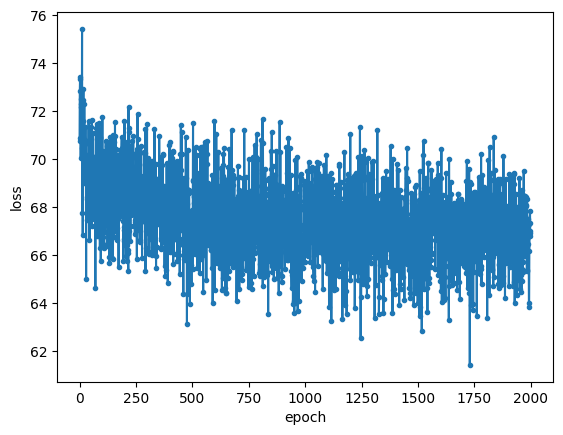

In [13]:
train_no = 2000

Synth = VxmTest()
Synth.CNNvxm(real_gen=None, synth_gen=synth_generator, val_generator=val_generator)
Synth.train(total_epo=train_no)

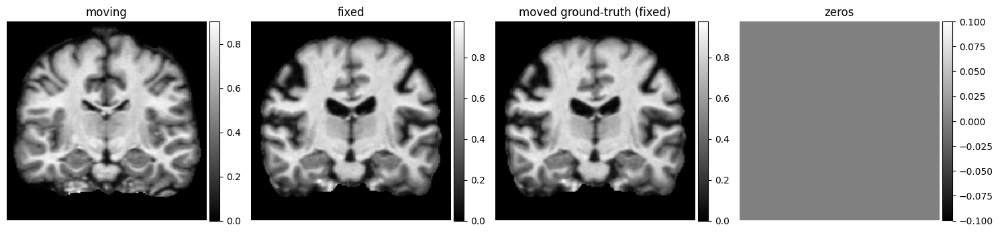

Epoch 1/2000
10/10 - 5s - loss: 0.0298 - vxm_dense_transformer_loss: 0.0298 - vxm_dense_flow_loss: 2.7727e-07 - val_loss: 0.0313 - val_vxm_dense_transformer_loss: 0.0313 - val_vxm_dense_flow_loss: 1.3423e-06 - 5s/epoch - 549ms/step
Epoch 2/2000
10/10 - 3s - loss: 0.0285 - vxm_dense_transformer_loss: 0.0285 - vxm_dense_flow_loss: 5.0511e-06 - val_loss: 0.0304 - val_vxm_dense_transformer_loss: 0.0304 - val_vxm_dense_flow_loss: 1.7513e-05 - 3s/epoch - 261ms/step
Epoch 3/2000
10/10 - 3s - loss: 0.0316 - vxm_dense_transformer_loss: 0.0316 - vxm_dense_flow_loss: 4.7759e-05 - val_loss: 0.0312 - val_vxm_dense_transformer_loss: 0.0312 - val_vxm_dense_flow_loss: 1.3125e-04 - 3s/epoch - 256ms/step
Epoch 4/2000
10/10 - 3s - loss: 0.0264 - vxm_dense_transformer_loss: 0.0264 - vxm_dense_flow_loss: 1.4112e-04 - val_loss: 0.0309 - val_vxm_dense_transformer_loss: 0.0309 - val_vxm_dense_flow_loss: 1.7452e-04 - 3s/epoch - 255ms/step
Epoch 5/2000
10/10 - 3s - loss: 0.0283 - vxm_dense_transformer_loss: 0.0

Epoch 38/2000
10/10 - 2s - loss: 0.0183 - vxm_dense_transformer_loss: 0.0170 - vxm_dense_flow_loss: 0.1269 - val_loss: 0.0189 - val_vxm_dense_transformer_loss: 0.0175 - val_vxm_dense_flow_loss: 0.1394 - 2s/epoch - 248ms/step
Epoch 39/2000
10/10 - 3s - loss: 0.0179 - vxm_dense_transformer_loss: 0.0166 - vxm_dense_flow_loss: 0.1327 - val_loss: 0.0189 - val_vxm_dense_transformer_loss: 0.0175 - val_vxm_dense_flow_loss: 0.1472 - 3s/epoch - 254ms/step
Epoch 40/2000
10/10 - 2s - loss: 0.0146 - vxm_dense_transformer_loss: 0.0133 - vxm_dense_flow_loss: 0.1242 - val_loss: 0.0187 - val_vxm_dense_transformer_loss: 0.0173 - val_vxm_dense_flow_loss: 0.1470 - 2s/epoch - 246ms/step
Epoch 41/2000
10/10 - 3s - loss: 0.0199 - vxm_dense_transformer_loss: 0.0186 - vxm_dense_flow_loss: 0.1339 - val_loss: 0.0191 - val_vxm_dense_transformer_loss: 0.0177 - val_vxm_dense_flow_loss: 0.1425 - 3s/epoch - 254ms/step
Epoch 42/2000
10/10 - 3s - loss: 0.0172 - vxm_dense_transformer_loss: 0.0160 - vxm_dense_flow_loss: 

Epoch 75/2000
10/10 - 3s - loss: 0.0136 - vxm_dense_transformer_loss: 0.0120 - vxm_dense_flow_loss: 0.1535 - val_loss: 0.0148 - val_vxm_dense_transformer_loss: 0.0131 - val_vxm_dense_flow_loss: 0.1732 - 3s/epoch - 255ms/step
Epoch 76/2000
10/10 - 3s - loss: 0.0146 - vxm_dense_transformer_loss: 0.0129 - vxm_dense_flow_loss: 0.1683 - val_loss: 0.0157 - val_vxm_dense_transformer_loss: 0.0139 - val_vxm_dense_flow_loss: 0.1725 - 3s/epoch - 255ms/step
Epoch 77/2000
10/10 - 3s - loss: 0.0140 - vxm_dense_transformer_loss: 0.0125 - vxm_dense_flow_loss: 0.1519 - val_loss: 0.0145 - val_vxm_dense_transformer_loss: 0.0128 - val_vxm_dense_flow_loss: 0.1752 - 3s/epoch - 261ms/step
Epoch 78/2000
10/10 - 3s - loss: 0.0145 - vxm_dense_transformer_loss: 0.0129 - vxm_dense_flow_loss: 0.1654 - val_loss: 0.0147 - val_vxm_dense_transformer_loss: 0.0131 - val_vxm_dense_flow_loss: 0.1628 - 3s/epoch - 257ms/step
Epoch 79/2000
10/10 - 3s - loss: 0.0158 - vxm_dense_transformer_loss: 0.0141 - vxm_dense_flow_loss: 

Epoch 112/2000
10/10 - 3s - loss: 0.0153 - vxm_dense_transformer_loss: 0.0134 - vxm_dense_flow_loss: 0.1845 - val_loss: 0.0131 - val_vxm_dense_transformer_loss: 0.0114 - val_vxm_dense_flow_loss: 0.1614 - 3s/epoch - 262ms/step
Epoch 113/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.1607 - val_loss: 0.0136 - val_vxm_dense_transformer_loss: 0.0118 - val_vxm_dense_flow_loss: 0.1797 - 3s/epoch - 259ms/step
Epoch 114/2000
10/10 - 3s - loss: 0.0172 - vxm_dense_transformer_loss: 0.0153 - vxm_dense_flow_loss: 0.1913 - val_loss: 0.0149 - val_vxm_dense_transformer_loss: 0.0130 - val_vxm_dense_flow_loss: 0.1859 - 3s/epoch - 262ms/step
Epoch 115/2000
10/10 - 3s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0108 - vxm_dense_flow_loss: 0.1734 - val_loss: 0.0142 - val_vxm_dense_transformer_loss: 0.0126 - val_vxm_dense_flow_loss: 0.1647 - 3s/epoch - 268ms/step
Epoch 116/2000
10/10 - 3s - loss: 0.0152 - vxm_dense_transformer_loss: 0.0134 - vxm_dense_flow_l

Epoch 149/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.1668 - val_loss: 0.0136 - val_vxm_dense_transformer_loss: 0.0117 - val_vxm_dense_flow_loss: 0.1922 - 3s/epoch - 259ms/step
Epoch 150/2000
10/10 - 3s - loss: 0.0129 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_loss: 0.1845 - val_loss: 0.0136 - val_vxm_dense_transformer_loss: 0.0117 - val_vxm_dense_flow_loss: 0.1942 - 3s/epoch - 253ms/step
Epoch 151/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1681 - val_loss: 0.0135 - val_vxm_dense_transformer_loss: 0.0117 - val_vxm_dense_flow_loss: 0.1871 - 3s/epoch - 258ms/step
Epoch 152/2000
10/10 - 3s - loss: 0.0131 - vxm_dense_transformer_loss: 0.0113 - vxm_dense_flow_loss: 0.1842 - val_loss: 0.0132 - val_vxm_dense_transformer_loss: 0.0116 - val_vxm_dense_flow_loss: 0.1680 - 3s/epoch - 251ms/step
Epoch 153/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_l

Epoch 186/2000
10/10 - 3s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0131 - val_vxm_dense_transformer_loss: 0.0111 - val_vxm_dense_flow_loss: 0.1906 - 3s/epoch - 268ms/step
Epoch 187/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1815 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0110 - val_vxm_dense_flow_loss: 0.1911 - 3s/epoch - 267ms/step
Epoch 188/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.1796 - val_loss: 0.0127 - val_vxm_dense_transformer_loss: 0.0107 - val_vxm_dense_flow_loss: 0.2042 - 3s/epoch - 264ms/step
Epoch 189/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1848 - val_loss: 0.0133 - val_vxm_dense_transformer_loss: 0.0113 - val_vxm_dense_flow_loss: 0.2009 - 3s/epoch - 257ms/step
Epoch 190/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_l

Epoch 223/2000
10/10 - 3s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.2038 - val_loss: 0.0126 - val_vxm_dense_transformer_loss: 0.0107 - val_vxm_dense_flow_loss: 0.1948 - 3s/epoch - 264ms/step
Epoch 224/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.1931 - val_loss: 0.0130 - val_vxm_dense_transformer_loss: 0.0110 - val_vxm_dense_flow_loss: 0.2000 - 3s/epoch - 262ms/step
Epoch 225/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.2074 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.1992 - 3s/epoch - 268ms/step
Epoch 226/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.1885 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2001 - 3s/epoch - 260ms/step
Epoch 227/2000
10/10 - 3s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_l

Epoch 260/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.1961 - val_loss: 0.0133 - val_vxm_dense_transformer_loss: 0.0114 - val_vxm_dense_flow_loss: 0.1964 - 3s/epoch - 265ms/step
Epoch 261/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1839 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0109 - val_vxm_dense_flow_loss: 0.1978 - 3s/epoch - 266ms/step
Epoch 262/2000
10/10 - 3s - loss: 0.0135 - vxm_dense_transformer_loss: 0.0113 - vxm_dense_flow_loss: 0.2153 - val_loss: 0.0128 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.1976 - 3s/epoch - 263ms/step
Epoch 263/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1934 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.1959 - 3s/epoch - 255ms/step
Epoch 264/2000
10/10 - 3s - loss: 0.0132 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_l

Epoch 297/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1968 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2085 - 3s/epoch - 265ms/step
Epoch 298/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1764 - val_loss: 0.0127 - val_vxm_dense_transformer_loss: 0.0105 - val_vxm_dense_flow_loss: 0.2122 - 3s/epoch - 263ms/step
Epoch 299/2000
10/10 - 3s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2032 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2005 - 3s/epoch - 255ms/step
Epoch 300/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1889 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.1853 - 3s/epoch - 264ms/step
Epoch 301/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_l

Epoch 334/2000
10/10 - 3s - loss: 0.0125 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.1968 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.1911 - 3s/epoch - 256ms/step
Epoch 335/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1947 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2018 - 3s/epoch - 253ms/step
Epoch 336/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.1993 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2161 - 3s/epoch - 254ms/step
Epoch 337/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2052 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.2133 - 2s/epoch - 247ms/step
Epoch 338/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_l

Epoch 371/2000
10/10 - 2s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2093 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2014 - 2s/epoch - 247ms/step
Epoch 372/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2050 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2111 - 2s/epoch - 241ms/step
Epoch 373/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.1913 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2117 - 2s/epoch - 246ms/step
Epoch 374/2000
10/10 - 2s - loss: 0.0131 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 0.2052 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2089 - 2s/epoch - 249ms/step
Epoch 375/2000
10/10 - 2s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_l

Epoch 408/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1954 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2196 - 3s/epoch - 257ms/step
Epoch 409/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2119 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.1920 - 3s/epoch - 263ms/step
Epoch 410/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2023 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2009 - 3s/epoch - 252ms/step
Epoch 411/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1922 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2159 - 2s/epoch - 244ms/step
Epoch 412/2000
10/10 - 3s - loss: 0.0124 - vxm_dense_transformer_loss: 0.0104 - vxm_dense_flow_l

Epoch 445/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2218 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2279 - 3s/epoch - 271ms/step
Epoch 446/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.1943 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.2346 - 3s/epoch - 264ms/step
Epoch 447/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.1940 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2291 - 3s/epoch - 268ms/step
Epoch 448/2000
10/10 - 3s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1872 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2121 - 3s/epoch - 263ms/step
Epoch 449/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_l

Epoch 482/2000
10/10 - 3s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.2011 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.1939 - 3s/epoch - 266ms/step
Epoch 483/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2018 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2033 - 3s/epoch - 265ms/step
Epoch 484/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.1975 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.2039 - 3s/epoch - 260ms/step
Epoch 485/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2018 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.1995 - 3s/epoch - 265ms/step
Epoch 486/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_l

Epoch 519/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2046 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2002 - 3s/epoch - 264ms/step
Epoch 520/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.1963 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.1935 - 3s/epoch - 258ms/step
Epoch 521/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2177 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2118 - 3s/epoch - 257ms/step
Epoch 522/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1996 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2117 - 3s/epoch - 263ms/step
Epoch 523/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_l

Epoch 556/2000
10/10 - 3s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2021 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2119 - 3s/epoch - 266ms/step
Epoch 557/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1833 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2203 - 3s/epoch - 264ms/step
Epoch 558/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2160 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2265 - 3s/epoch - 254ms/step
Epoch 559/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2052 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2213 - 3s/epoch - 262ms/step
Epoch 560/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_l

Epoch 593/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1948 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2011 - 3s/epoch - 266ms/step
Epoch 594/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1939 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2094 - 3s/epoch - 263ms/step
Epoch 595/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2000 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2097 - 3s/epoch - 264ms/step
Epoch 596/2000
10/10 - 3s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0107 - vxm_dense_flow_loss: 0.1980 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.1987 - 3s/epoch - 259ms/step
Epoch 597/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_l

Epoch 630/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2040 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2046 - 3s/epoch - 267ms/step
Epoch 631/2000
10/10 - 3s - loss: 0.0125 - vxm_dense_transformer_loss: 0.0104 - vxm_dense_flow_loss: 0.2122 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2122 - 3s/epoch - 269ms/step
Epoch 632/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1964 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2043 - 3s/epoch - 269ms/step
Epoch 633/2000
10/10 - 3s - loss: 0.0137 - vxm_dense_transformer_loss: 0.0114 - vxm_dense_flow_loss: 0.2268 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2130 - 3s/epoch - 262ms/step
Epoch 634/2000
10/10 - 3s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_l

Epoch 667/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2008 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2002 - 3s/epoch - 262ms/step
Epoch 668/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1984 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2116 - 3s/epoch - 260ms/step
Epoch 669/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1948 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2137 - 3s/epoch - 266ms/step
Epoch 670/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.1991 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2166 - 3s/epoch - 263ms/step
Epoch 671/2000
10/10 - 3s - loss: 0.0124 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_l

Epoch 704/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1976 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2114 - 3s/epoch - 268ms/step
Epoch 705/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2244 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2081 - 3s/epoch - 271ms/step
Epoch 706/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2025 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2141 - 3s/epoch - 262ms/step
Epoch 707/2000
10/10 - 3s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.1961 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2076 - 3s/epoch - 259ms/step
Epoch 708/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_l

Epoch 741/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2138 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2176 - 3s/epoch - 266ms/step
Epoch 742/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2224 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2124 - 3s/epoch - 263ms/step
Epoch 743/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2142 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2137 - 3s/epoch - 265ms/step
Epoch 744/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2015 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2126 - 3s/epoch - 267ms/step
Epoch 745/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_l

Epoch 778/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2066 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2219 - 3s/epoch - 262ms/step
Epoch 779/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2049 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2195 - 3s/epoch - 265ms/step
Epoch 780/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2199 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2097 - 3s/epoch - 261ms/step
Epoch 781/2000
10/10 - 3s - loss: 0.0130 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 0.2038 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2266 - 3s/epoch - 264ms/step
Epoch 782/2000
10/10 - 3s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_l

Epoch 815/2000
10/10 - 3s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_loss: 0.1899 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2182 - 3s/epoch - 262ms/step
Epoch 816/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2101 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2192 - 3s/epoch - 263ms/step
Epoch 817/2000
10/10 - 3s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2067 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2209 - 3s/epoch - 269ms/step
Epoch 818/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2043 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2092 - 3s/epoch - 261ms/step
Epoch 819/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_l

Epoch 852/2000
10/10 - 3s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.2025 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2206 - 3s/epoch - 255ms/step
Epoch 853/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2009 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2206 - 3s/epoch - 261ms/step
Epoch 854/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2107 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2111 - 3s/epoch - 263ms/step
Epoch 855/2000
10/10 - 3s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2223 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2131 - 3s/epoch - 258ms/step
Epoch 856/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_l

Epoch 889/2000
10/10 - 3s - loss: 0.0129 - vxm_dense_transformer_loss: 0.0108 - vxm_dense_flow_loss: 0.2146 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2178 - 3s/epoch - 257ms/step
Epoch 890/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1920 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2276 - 3s/epoch - 261ms/step
Epoch 891/2000
10/10 - 3s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2285 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2071 - 3s/epoch - 252ms/step
Epoch 892/2000
10/10 - 3s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2130 - 3s/epoch - 251ms/step
Epoch 893/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_l

Epoch 926/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2003 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2129 - 3s/epoch - 264ms/step
Epoch 927/2000
10/10 - 3s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2328 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2110 - 3s/epoch - 261ms/step
Epoch 928/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2110 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2156 - 3s/epoch - 259ms/step
Epoch 929/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2104 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2146 - 3s/epoch - 265ms/step
Epoch 930/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_l

Epoch 963/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2027 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2251 - 3s/epoch - 269ms/step
Epoch 964/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2176 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2222 - 3s/epoch - 264ms/step
Epoch 965/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1999 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2220 - 3s/epoch - 259ms/step
Epoch 966/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2163 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2053 - 3s/epoch - 266ms/step
Epoch 967/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_l

Epoch 1000/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2034 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2153 - 3s/epoch - 257ms/step
Epoch 1001/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2254 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.1950 - 3s/epoch - 258ms/step
Epoch 1002/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2113 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.1999 - 3s/epoch - 263ms/step
Epoch 1003/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2062 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2184 - 3s/epoch - 257ms/step
Epoch 1004/2000
10/10 - 3s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_f

Epoch 1037/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2075 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2152 - 3s/epoch - 260ms/step
Epoch 1038/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1938 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2153 - 3s/epoch - 262ms/step
Epoch 1039/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2026 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2266 - 3s/epoch - 263ms/step
Epoch 1040/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2056 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2114 - 3s/epoch - 255ms/step
Epoch 1041/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_f

Epoch 1074/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2077 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.1949 - 3s/epoch - 265ms/step
Epoch 1075/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1989 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2161 - 3s/epoch - 263ms/step
Epoch 1076/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1944 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2108 - 3s/epoch - 258ms/step
Epoch 1077/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2150 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2113 - 3s/epoch - 262ms/step
Epoch 1078/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_f

Epoch 1111/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2206 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2188 - 3s/epoch - 254ms/step
Epoch 1112/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2034 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2151 - 3s/epoch - 255ms/step
Epoch 1113/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2040 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2148 - 3s/epoch - 257ms/step
Epoch 1114/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1970 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2086 - 3s/epoch - 258ms/step
Epoch 1115/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_f

Epoch 1148/2000
10/10 - 3s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.2004 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2031 - 3s/epoch - 258ms/step
Epoch 1149/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1837 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2148 - 3s/epoch - 263ms/step
Epoch 1150/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2116 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2170 - 3s/epoch - 268ms/step
Epoch 1151/2000
10/10 - 3s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1884 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2157 - 3s/epoch - 258ms/step
Epoch 1152/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_f

Epoch 1185/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2077 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2118 - 3s/epoch - 261ms/step
Epoch 1186/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2198 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2169 - 3s/epoch - 259ms/step
Epoch 1187/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2161 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2191 - 3s/epoch - 259ms/step
Epoch 1188/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2049 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2212 - 3s/epoch - 259ms/step
Epoch 1189/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_f

Epoch 1222/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2066 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2057 - 3s/epoch - 263ms/step
Epoch 1223/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2323 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2152 - 3s/epoch - 265ms/step
Epoch 1224/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2191 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2167 - 3s/epoch - 258ms/step
Epoch 1225/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2202 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2287 - 3s/epoch - 265ms/step
Epoch 1226/2000
10/10 - 3s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_f

Epoch 1259/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1963 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2171 - 3s/epoch - 267ms/step
Epoch 1260/2000
10/10 - 3s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1914 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2125 - 3s/epoch - 263ms/step
Epoch 1261/2000
10/10 - 3s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1946 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2056 - 3s/epoch - 274ms/step
Epoch 1262/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2166 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2163 - 3s/epoch - 264ms/step
Epoch 1263/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_f

Epoch 1296/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2115 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2231 - 3s/epoch - 265ms/step
Epoch 1297/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2239 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2109 - 3s/epoch - 252ms/step
Epoch 1298/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2106 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2052 - 3s/epoch - 267ms/step
Epoch 1299/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.2007 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2020 - 3s/epoch - 260ms/step
Epoch 1300/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1333/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1984 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2192 - 3s/epoch - 261ms/step
Epoch 1334/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2023 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2106 - 3s/epoch - 267ms/step
Epoch 1335/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2307 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2217 - 3s/epoch - 259ms/step
Epoch 1336/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2161 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2166 - 3s/epoch - 266ms/step
Epoch 1337/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_f

Epoch 1370/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.1993 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2022 - 3s/epoch - 262ms/step
Epoch 1371/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1902 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2050 - 3s/epoch - 258ms/step
Epoch 1372/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1983 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2058 - 3s/epoch - 256ms/step
Epoch 1373/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1956 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2099 - 3s/epoch - 259ms/step
Epoch 1374/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_f

Epoch 1407/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2013 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2099 - 3s/epoch - 260ms/step
Epoch 1408/2000
10/10 - 3s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2304 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2123 - 3s/epoch - 265ms/step
Epoch 1409/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2093 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2043 - 3s/epoch - 260ms/step
Epoch 1410/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2060 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2212 - 3s/epoch - 262ms/step
Epoch 1411/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_f

Epoch 1444/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2182 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2241 - 3s/epoch - 259ms/step
Epoch 1445/2000
10/10 - 3s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1854 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2123 - 3s/epoch - 257ms/step
Epoch 1446/2000
10/10 - 3s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2001 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2142 - 3s/epoch - 260ms/step
Epoch 1447/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2005 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2158 - 3s/epoch - 260ms/step
Epoch 1448/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_f

Epoch 1481/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1988 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2056 - 3s/epoch - 257ms/step
Epoch 1482/2000
10/10 - 3s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1790 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2119 - 3s/epoch - 258ms/step
Epoch 1483/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2014 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2157 - 3s/epoch - 260ms/step
Epoch 1484/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1983 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2091 - 3s/epoch - 262ms/step
Epoch 1485/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_f

Epoch 1518/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2017 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2235 - 3s/epoch - 256ms/step
Epoch 1519/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2168 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2129 - 3s/epoch - 265ms/step
Epoch 1520/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2057 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2067 - 3s/epoch - 258ms/step
Epoch 1521/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1996 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2099 - 3s/epoch - 264ms/step
Epoch 1522/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_f

Epoch 1555/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2011 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2163 - 3s/epoch - 261ms/step
Epoch 1556/2000
10/10 - 3s - loss: 0.0081 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1984 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2197 - 3s/epoch - 262ms/step
Epoch 1557/2000
10/10 - 3s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0058 - vxm_dense_flow_loss: 0.2048 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2144 - 3s/epoch - 253ms/step
Epoch 1558/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1832 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2104 - 3s/epoch - 264ms/step
Epoch 1559/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_f

Epoch 1592/2000
10/10 - 3s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_flow_loss: 0.1858 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2246 - 3s/epoch - 260ms/step
Epoch 1593/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2230 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2113 - 3s/epoch - 264ms/step
Epoch 1594/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2298 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2280 - 3s/epoch - 262ms/step
Epoch 1595/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2003 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2178 - 3s/epoch - 256ms/step
Epoch 1596/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_f

Epoch 1629/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1978 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0075 - val_vxm_dense_flow_loss: 0.2229 - 3s/epoch - 254ms/step
Epoch 1630/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2120 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2087 - 3s/epoch - 255ms/step
Epoch 1631/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1992 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2120 - 3s/epoch - 261ms/step
Epoch 1632/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2086 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2186 - 3s/epoch - 252ms/step
Epoch 1633/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_f

Epoch 1666/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.2012 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2257 - 3s/epoch - 264ms/step
Epoch 1667/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2118 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2095 - 3s/epoch - 264ms/step
Epoch 1668/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1995 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2084 - 3s/epoch - 265ms/step
Epoch 1669/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2015 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2172 - 3s/epoch - 264ms/step
Epoch 1670/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_f

Epoch 1703/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1974 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2046 - 3s/epoch - 257ms/step
Epoch 1704/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2182 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2138 - 3s/epoch - 260ms/step
Epoch 1705/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2040 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2205 - 3s/epoch - 262ms/step
Epoch 1706/2000
10/10 - 3s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2079 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2157 - 3s/epoch - 267ms/step
Epoch 1707/2000
10/10 - 3s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_f

Epoch 1740/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2197 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2184 - 3s/epoch - 258ms/step
Epoch 1741/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1977 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2172 - 3s/epoch - 264ms/step
Epoch 1742/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2085 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2188 - 3s/epoch - 251ms/step
Epoch 1743/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2195 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2124 - 3s/epoch - 257ms/step
Epoch 1744/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_f

Epoch 1777/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2202 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2276 - 3s/epoch - 258ms/step
Epoch 1778/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2092 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2141 - 3s/epoch - 255ms/step
Epoch 1779/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2019 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2074 - 3s/epoch - 267ms/step
Epoch 1780/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2342 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2265 - 3s/epoch - 268ms/step
Epoch 1781/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_f

Epoch 1814/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2197 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2089 - 3s/epoch - 268ms/step
Epoch 1815/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2201 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2156 - 3s/epoch - 265ms/step
Epoch 1816/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2081 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2088 - 3s/epoch - 255ms/step
Epoch 1817/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2051 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2039 - 3s/epoch - 265ms/step
Epoch 1818/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_f

Epoch 1851/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2297 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2210 - 3s/epoch - 259ms/step
Epoch 1852/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2035 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2136 - 3s/epoch - 261ms/step
Epoch 1853/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2023 - val_loss: 0.0096 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2090 - 3s/epoch - 263ms/step
Epoch 1854/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1956 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0075 - val_vxm_dense_flow_loss: 0.2159 - 3s/epoch - 261ms/step
Epoch 1855/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_f

Epoch 1888/2000
10/10 - 3s - loss: 0.0076 - vxm_dense_transformer_loss: 0.0056 - vxm_dense_flow_loss: 0.2034 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2228 - 3s/epoch - 255ms/step
Epoch 1889/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2226 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2202 - 3s/epoch - 258ms/step
Epoch 1890/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2099 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2189 - 3s/epoch - 266ms/step
Epoch 1891/2000
10/10 - 3s - loss: 0.0071 - vxm_dense_transformer_loss: 0.0053 - vxm_dense_flow_loss: 0.1791 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2152 - 3s/epoch - 258ms/step
Epoch 1892/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_f

Epoch 1925/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1961 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.1849 - 3s/epoch - 257ms/step
Epoch 1926/2000
10/10 - 3s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_loss: 0.2232 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2048 - 3s/epoch - 258ms/step
Epoch 1927/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2065 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2060 - 3s/epoch - 261ms/step
Epoch 1928/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2046 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2108 - 3s/epoch - 260ms/step
Epoch 1929/2000
10/10 - 3s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_f

Epoch 1962/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2036 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2139 - 3s/epoch - 255ms/step
Epoch 1963/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1903 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2146 - 3s/epoch - 259ms/step
Epoch 1964/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2235 - val_loss: 0.0096 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2098 - 3s/epoch - 266ms/step
Epoch 1965/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2025 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2179 - 3s/epoch - 259ms/step
Epoch 1966/2000
10/10 - 3s - loss: 0.0076 - vxm_dense_transformer_loss: 0.0057 - vxm_dense_f

Epoch 1999/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2175 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2174 - 3s/epoch - 262ms/step
Epoch 2000/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1872 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2184 - 3s/epoch - 256ms/step


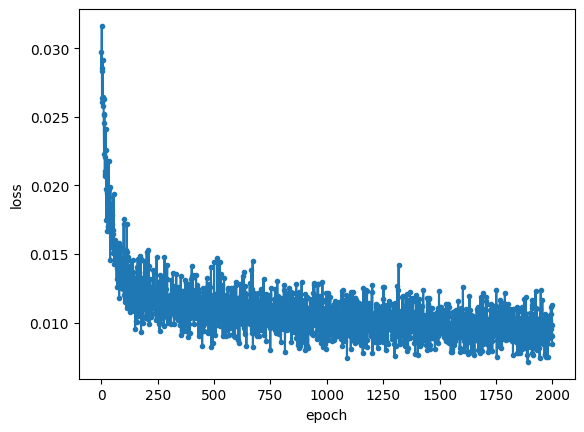

In [14]:
Real = VxmTest()
Real.CNNvxm(real_gen=train_generator, synth_gen=None, val_generator=val_generator)
Real.train(total_epo=train_no)

In [15]:
# for k in range(5, 95, 5):
#     exec(f'Hybr_{k} = VxmTest()')
#     exec(f'Hybr_{k}.CNNvxm(real_gen=train_generator, synth_gen=synth_generator, val_generator=val_generator, alpha_real=k/100)')
#     exec(f'Hybr_{k}.train(total_epo = train_no)')
#     exec(f'hybr_{k} = Hybr_{k}.RegPred(val_input)[1]')

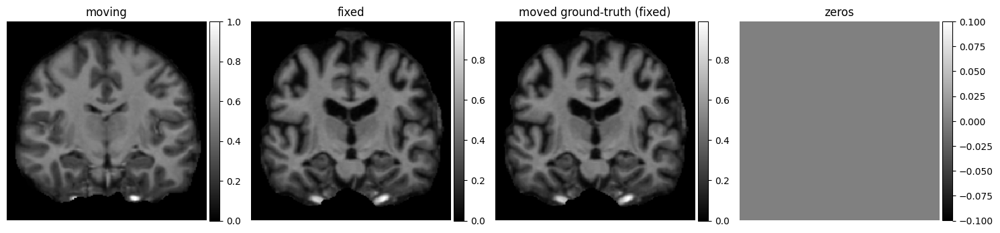

Epoch 1/2000
10/10 - 6s - loss: 0.0250 - vxm_dense_transformer_loss: 0.0250 - vxm_dense_flow_loss: 8.8888e-07 - val_loss: 0.0307 - val_vxm_dense_transformer_loss: 0.0307 - val_vxm_dense_flow_loss: 5.1516e-06 - 6s/epoch - 551ms/step
Epoch 2/2000
10/10 - 3s - loss: 0.0264 - vxm_dense_transformer_loss: 0.0264 - vxm_dense_flow_loss: 2.1109e-05 - val_loss: 0.0306 - val_vxm_dense_transformer_loss: 0.0306 - val_vxm_dense_flow_loss: 7.5962e-05 - 3s/epoch - 252ms/step
Epoch 3/2000
10/10 - 3s - loss: 0.0303 - vxm_dense_transformer_loss: 0.0303 - vxm_dense_flow_loss: 6.8815e-05 - val_loss: 0.0313 - val_vxm_dense_transformer_loss: 0.0313 - val_vxm_dense_flow_loss: 6.5858e-05 - 3s/epoch - 262ms/step
Epoch 4/2000
10/10 - 3s - loss: 0.0275 - vxm_dense_transformer_loss: 0.0275 - vxm_dense_flow_loss: 6.3753e-05 - val_loss: 0.0307 - val_vxm_dense_transformer_loss: 0.0307 - val_vxm_dense_flow_loss: 1.0475e-04 - 3s/epoch - 254ms/step
Epoch 5/2000
10/10 - 3s - loss: 0.0238 - vxm_dense_transformer_loss: 0.0

Epoch 38/2000
10/10 - 3s - loss: 0.0139 - vxm_dense_transformer_loss: 0.0125 - vxm_dense_flow_loss: 0.1378 - val_loss: 0.0157 - val_vxm_dense_transformer_loss: 0.0143 - val_vxm_dense_flow_loss: 0.1455 - 3s/epoch - 257ms/step
Epoch 39/2000
10/10 - 2s - loss: 0.0131 - vxm_dense_transformer_loss: 0.0118 - vxm_dense_flow_loss: 0.1304 - val_loss: 0.0158 - val_vxm_dense_transformer_loss: 0.0144 - val_vxm_dense_flow_loss: 0.1383 - 2s/epoch - 249ms/step
Epoch 40/2000
10/10 - 2s - loss: 0.0150 - vxm_dense_transformer_loss: 0.0136 - vxm_dense_flow_loss: 0.1345 - val_loss: 0.0155 - val_vxm_dense_transformer_loss: 0.0140 - val_vxm_dense_flow_loss: 0.1493 - 2s/epoch - 246ms/step
Epoch 41/2000
10/10 - 2s - loss: 0.0146 - vxm_dense_transformer_loss: 0.0132 - vxm_dense_flow_loss: 0.1446 - val_loss: 0.0155 - val_vxm_dense_transformer_loss: 0.0140 - val_vxm_dense_flow_loss: 0.1496 - 2s/epoch - 240ms/step
Epoch 42/2000
10/10 - 2s - loss: 0.0145 - vxm_dense_transformer_loss: 0.0131 - vxm_dense_flow_loss: 

Epoch 75/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.1473 - val_loss: 0.0140 - val_vxm_dense_transformer_loss: 0.0122 - val_vxm_dense_flow_loss: 0.1862 - 3s/epoch - 258ms/step
Epoch 76/2000
10/10 - 3s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_loss: 0.1485 - val_loss: 0.0137 - val_vxm_dense_transformer_loss: 0.0120 - val_vxm_dense_flow_loss: 0.1754 - 3s/epoch - 259ms/step
Epoch 77/2000
10/10 - 3s - loss: 0.0128 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_loss: 0.1741 - val_loss: 0.0141 - val_vxm_dense_transformer_loss: 0.0123 - val_vxm_dense_flow_loss: 0.1833 - 3s/epoch - 264ms/step
Epoch 78/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0107 - vxm_dense_flow_loss: 0.1479 - val_loss: 0.0149 - val_vxm_dense_transformer_loss: 0.0131 - val_vxm_dense_flow_loss: 0.1884 - 3s/epoch - 251ms/step
Epoch 79/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 

Epoch 112/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.1571 - val_loss: 0.0139 - val_vxm_dense_transformer_loss: 0.0119 - val_vxm_dense_flow_loss: 0.1951 - 3s/epoch - 260ms/step
Epoch 113/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1599 - val_loss: 0.0138 - val_vxm_dense_transformer_loss: 0.0116 - val_vxm_dense_flow_loss: 0.2191 - 3s/epoch - 266ms/step
Epoch 114/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.1666 - val_loss: 0.0135 - val_vxm_dense_transformer_loss: 0.0115 - val_vxm_dense_flow_loss: 0.2003 - 3s/epoch - 260ms/step
Epoch 115/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.1707 - val_loss: 0.0142 - val_vxm_dense_transformer_loss: 0.0123 - val_vxm_dense_flow_loss: 0.1875 - 3s/epoch - 258ms/step
Epoch 116/2000
10/10 - 3s - loss: 0.0134 - vxm_dense_transformer_loss: 0.0116 - vxm_dense_flow_l

Epoch 149/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.1774 - val_loss: 0.0132 - val_vxm_dense_transformer_loss: 0.0111 - val_vxm_dense_flow_loss: 0.2085 - 2s/epoch - 248ms/step
Epoch 150/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.1614 - val_loss: 0.0133 - val_vxm_dense_transformer_loss: 0.0111 - val_vxm_dense_flow_loss: 0.2152 - 3s/epoch - 260ms/step
Epoch 151/2000
10/10 - 3s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.1782 - val_loss: 0.0132 - val_vxm_dense_transformer_loss: 0.0110 - val_vxm_dense_flow_loss: 0.2132 - 3s/epoch - 268ms/step
Epoch 152/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1729 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0106 - val_vxm_dense_flow_loss: 0.1899 - 3s/epoch - 270ms/step
Epoch 153/2000
10/10 - 3s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_l

Epoch 186/2000
10/10 - 3s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0130 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.2244 - 3s/epoch - 255ms/step
Epoch 187/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.1884 - val_loss: 0.0128 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2367 - 3s/epoch - 253ms/step
Epoch 188/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1820 - val_loss: 0.0130 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.2199 - 3s/epoch - 251ms/step
Epoch 189/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.1897 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2178 - 3s/epoch - 254ms/step
Epoch 190/2000
10/10 - 3s - loss: 0.0130 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_l

Epoch 223/2000
10/10 - 3s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.1869 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2088 - 3s/epoch - 266ms/step
Epoch 224/2000
10/10 - 3s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.2016 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0107 - val_vxm_dense_flow_loss: 0.2261 - 3s/epoch - 272ms/step
Epoch 225/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.1862 - val_loss: 0.0131 - val_vxm_dense_transformer_loss: 0.0107 - val_vxm_dense_flow_loss: 0.2371 - 3s/epoch - 265ms/step
Epoch 226/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.1858 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2196 - 3s/epoch - 256ms/step
Epoch 227/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_l

Epoch 260/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1895 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2294 - 3s/epoch - 260ms/step
Epoch 261/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1888 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.2226 - 3s/epoch - 257ms/step
Epoch 262/2000
10/10 - 3s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.2036 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2141 - 3s/epoch - 256ms/step
Epoch 263/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1770 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.2133 - 3s/epoch - 264ms/step
Epoch 264/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_l

Epoch 297/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1785 - val_loss: 0.0126 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2194 - 3s/epoch - 268ms/step
Epoch 298/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.1926 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.2126 - 3s/epoch - 256ms/step
Epoch 299/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.1911 - val_loss: 0.0128 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.2075 - 3s/epoch - 261ms/step
Epoch 300/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2088 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2035 - 3s/epoch - 265ms/step
Epoch 301/2000
10/10 - 3s - loss: 0.0131 - vxm_dense_transformer_loss: 0.0112 - vxm_dense_flow_l

Epoch 334/2000
10/10 - 3s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.2115 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.2173 - 3s/epoch - 264ms/step
Epoch 335/2000
10/10 - 3s - loss: 0.0124 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.1917 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2061 - 3s/epoch - 264ms/step
Epoch 336/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.1888 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2069 - 3s/epoch - 252ms/step
Epoch 337/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1860 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2135 - 3s/epoch - 263ms/step
Epoch 338/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_l

Epoch 371/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.1965 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2181 - 3s/epoch - 254ms/step
Epoch 372/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1838 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2157 - 3s/epoch - 252ms/step
Epoch 373/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1885 - val_loss: 0.0126 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2166 - 3s/epoch - 256ms/step
Epoch 374/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1802 - val_loss: 0.0126 - val_vxm_dense_transformer_loss: 0.0105 - val_vxm_dense_flow_loss: 0.2081 - 3s/epoch - 263ms/step
Epoch 375/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_l

Epoch 408/2000
10/10 - 3s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2001 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.1875 - 3s/epoch - 264ms/step
Epoch 409/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1881 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2044 - 3s/epoch - 271ms/step
Epoch 410/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2179 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2183 - 3s/epoch - 264ms/step
Epoch 411/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.2034 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2106 - 3s/epoch - 258ms/step
Epoch 412/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_l

Epoch 445/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1921 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2168 - 3s/epoch - 261ms/step
Epoch 446/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.1957 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2006 - 3s/epoch - 258ms/step
Epoch 447/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.1965 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.1955 - 3s/epoch - 267ms/step
Epoch 448/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1902 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2149 - 3s/epoch - 264ms/step
Epoch 449/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_l

Epoch 482/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1893 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2136 - 3s/epoch - 268ms/step
Epoch 483/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1895 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2126 - 3s/epoch - 266ms/step
Epoch 484/2000
10/10 - 3s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.1998 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2110 - 3s/epoch - 267ms/step
Epoch 485/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1900 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2227 - 3s/epoch - 258ms/step
Epoch 486/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_l

Epoch 519/2000
10/10 - 3s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2207 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2271 - 3s/epoch - 254ms/step
Epoch 520/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1781 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2081 - 3s/epoch - 256ms/step
Epoch 521/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.1807 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2055 - 3s/epoch - 256ms/step
Epoch 522/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2407 - 3s/epoch - 262ms/step
Epoch 523/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_l

Epoch 556/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2071 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2324 - 2s/epoch - 247ms/step
Epoch 557/2000
10/10 - 3s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.1986 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2124 - 3s/epoch - 252ms/step
Epoch 558/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.1849 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2134 - 2s/epoch - 243ms/step
Epoch 559/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1748 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2330 - 2s/epoch - 249ms/step
Epoch 560/2000
10/10 - 2s - loss: 0.0129 - vxm_dense_transformer_loss: 0.0108 - vxm_dense_flow_l

Epoch 593/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2016 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2189 - 3s/epoch - 256ms/step
Epoch 594/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2024 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2137 - 3s/epoch - 256ms/step
Epoch 595/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2160 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2184 - 3s/epoch - 250ms/step
Epoch 596/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1941 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2131 - 3s/epoch - 251ms/step
Epoch 597/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_l

Epoch 630/2000
10/10 - 2s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.1893 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2092 - 2s/epoch - 248ms/step
Epoch 631/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2026 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2106 - 2s/epoch - 246ms/step
Epoch 632/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1858 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.1980 - 3s/epoch - 261ms/step
Epoch 633/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1808 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2074 - 3s/epoch - 255ms/step
Epoch 634/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_l

Epoch 667/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2029 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2205 - 3s/epoch - 259ms/step
Epoch 668/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2083 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2128 - 2s/epoch - 248ms/step
Epoch 669/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1884 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2103 - 3s/epoch - 257ms/step
Epoch 670/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2017 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2128 - 3s/epoch - 261ms/step
Epoch 671/2000
10/10 - 3s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_l

Epoch 704/2000
10/10 - 3s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.1914 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2093 - 3s/epoch - 259ms/step
Epoch 705/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1844 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2053 - 3s/epoch - 261ms/step
Epoch 706/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2039 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2157 - 3s/epoch - 256ms/step
Epoch 707/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1954 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2148 - 3s/epoch - 260ms/step
Epoch 708/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_l

Epoch 741/2000
10/10 - 3s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1908 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2146 - 3s/epoch - 253ms/step
Epoch 742/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1983 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2057 - 3s/epoch - 257ms/step
Epoch 743/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.2130 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2129 - 2s/epoch - 247ms/step
Epoch 744/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1896 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2047 - 3s/epoch - 256ms/step
Epoch 745/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_l

Epoch 778/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1810 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2049 - 3s/epoch - 257ms/step
Epoch 779/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1952 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2025 - 3s/epoch - 262ms/step
Epoch 780/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2063 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2213 - 3s/epoch - 265ms/step
Epoch 781/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.1937 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2209 - 3s/epoch - 263ms/step
Epoch 782/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_l

Epoch 815/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1746 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2132 - 3s/epoch - 261ms/step
Epoch 816/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1990 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2149 - 3s/epoch - 258ms/step
Epoch 817/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2160 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2190 - 3s/epoch - 262ms/step
Epoch 818/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2142 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2021 - 3s/epoch - 265ms/step
Epoch 819/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_l

Epoch 852/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2128 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2078 - 3s/epoch - 266ms/step
Epoch 853/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1919 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2159 - 3s/epoch - 264ms/step
Epoch 854/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2101 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2151 - 3s/epoch - 257ms/step
Epoch 855/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2023 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2133 - 3s/epoch - 267ms/step
Epoch 856/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_l

Epoch 889/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2117 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2085 - 3s/epoch - 256ms/step
Epoch 890/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2166 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2145 - 2s/epoch - 247ms/step
Epoch 891/2000
10/10 - 2s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2103 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2176 - 2s/epoch - 247ms/step
Epoch 892/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2043 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2187 - 2s/epoch - 245ms/step
Epoch 893/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_l

Epoch 926/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2044 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2062 - 3s/epoch - 258ms/step
Epoch 927/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1793 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2116 - 3s/epoch - 261ms/step
Epoch 928/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2208 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2173 - 3s/epoch - 261ms/step
Epoch 929/2000
10/10 - 3s - loss: 0.0124 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.2090 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2131 - 3s/epoch - 265ms/step
Epoch 930/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_l

Epoch 963/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2063 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2058 - 3s/epoch - 268ms/step
Epoch 964/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1727 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2027 - 3s/epoch - 264ms/step
Epoch 965/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1934 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.1977 - 3s/epoch - 253ms/step
Epoch 966/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1825 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.1933 - 2s/epoch - 249ms/step
Epoch 967/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_l

Epoch 1000/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2059 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2081 - 3s/epoch - 252ms/step
Epoch 1001/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2249 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2174 - 2s/epoch - 249ms/step
Epoch 1002/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2029 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2033 - 2s/epoch - 248ms/step
Epoch 1003/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1919 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2138 - 3s/epoch - 267ms/step
Epoch 1004/2000
10/10 - 3s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_f

Epoch 1037/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1820 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2244 - 3s/epoch - 258ms/step
Epoch 1038/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2071 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2208 - 3s/epoch - 260ms/step
Epoch 1039/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1990 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2218 - 3s/epoch - 257ms/step
Epoch 1040/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2059 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2289 - 3s/epoch - 251ms/step
Epoch 1041/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_f

Epoch 1074/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2059 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2025 - 3s/epoch - 255ms/step
Epoch 1075/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2055 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2191 - 3s/epoch - 262ms/step
Epoch 1076/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1842 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2192 - 3s/epoch - 257ms/step
Epoch 1077/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1992 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2138 - 3s/epoch - 268ms/step
Epoch 1078/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_f

Epoch 1111/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.1781 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2104 - 3s/epoch - 260ms/step
Epoch 1112/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1955 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2130 - 3s/epoch - 266ms/step
Epoch 1113/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2010 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2089 - 3s/epoch - 266ms/step
Epoch 1114/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1875 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2046 - 3s/epoch - 267ms/step
Epoch 1115/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_f

Epoch 1148/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2087 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2110 - 3s/epoch - 276ms/step
Epoch 1149/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1961 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2224 - 3s/epoch - 261ms/step
Epoch 1150/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1780 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2153 - 3s/epoch - 262ms/step
Epoch 1151/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2298 - 3s/epoch - 260ms/step
Epoch 1152/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_f

Epoch 1185/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2103 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2178 - 3s/epoch - 267ms/step
Epoch 1186/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1914 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2171 - 3s/epoch - 261ms/step
Epoch 1187/2000
10/10 - 3s - loss: 0.0077 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_loss: 0.1859 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2148 - 3s/epoch - 260ms/step
Epoch 1188/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2085 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2181 - 3s/epoch - 258ms/step
Epoch 1189/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_f

Epoch 1222/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1992 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2156 - 3s/epoch - 262ms/step
Epoch 1223/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1931 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2125 - 3s/epoch - 270ms/step
Epoch 1224/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2093 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2241 - 3s/epoch - 258ms/step
Epoch 1225/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2018 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2326 - 3s/epoch - 260ms/step
Epoch 1226/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_f

Epoch 1259/2000
10/10 - 3s - loss: 0.0075 - vxm_dense_transformer_loss: 0.0056 - vxm_dense_flow_loss: 0.1944 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2223 - 3s/epoch - 251ms/step
Epoch 1260/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2016 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2163 - 3s/epoch - 252ms/step
Epoch 1261/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1893 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2227 - 3s/epoch - 260ms/step
Epoch 1262/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2177 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2115 - 3s/epoch - 266ms/step
Epoch 1263/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_f

Epoch 1296/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1931 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2132 - 3s/epoch - 269ms/step
Epoch 1297/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1903 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2111 - 3s/epoch - 270ms/step
Epoch 1298/2000
10/10 - 2s - loss: 0.0077 - vxm_dense_transformer_loss: 0.0058 - vxm_dense_flow_loss: 0.1830 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2213 - 2s/epoch - 249ms/step
Epoch 1299/2000
10/10 - 3s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1783 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2078 - 3s/epoch - 258ms/step
Epoch 1300/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_f

Epoch 1333/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1868 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2184 - 3s/epoch - 259ms/step
Epoch 1334/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2044 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2168 - 3s/epoch - 260ms/step
Epoch 1335/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1887 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2129 - 3s/epoch - 263ms/step
Epoch 1336/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2002 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2137 - 3s/epoch - 266ms/step
Epoch 1337/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_f

Epoch 1370/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2082 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2144 - 2s/epoch - 236ms/step
Epoch 1371/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.2032 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2082 - 2s/epoch - 250ms/step
Epoch 1372/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2073 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2108 - 2s/epoch - 249ms/step
Epoch 1373/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.2201 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2183 - 3s/epoch - 254ms/step
Epoch 1374/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_f

Epoch 1407/2000
10/10 - 3s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_flow_loss: 0.1823 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2126 - 3s/epoch - 266ms/step
Epoch 1408/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1947 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2235 - 3s/epoch - 262ms/step
Epoch 1409/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1896 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2210 - 3s/epoch - 265ms/step
Epoch 1410/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1938 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2170 - 3s/epoch - 254ms/step
Epoch 1411/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_f

Epoch 1444/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2074 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2084 - 3s/epoch - 260ms/step
Epoch 1445/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2184 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2327 - 3s/epoch - 252ms/step
Epoch 1446/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1823 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2255 - 2s/epoch - 246ms/step
Epoch 1447/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1903 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2314 - 3s/epoch - 253ms/step
Epoch 1448/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_f

Epoch 1481/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2245 - 3s/epoch - 263ms/step
Epoch 1482/2000
10/10 - 3s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.1877 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2172 - 3s/epoch - 257ms/step
Epoch 1483/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2271 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2079 - 3s/epoch - 259ms/step
Epoch 1484/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1953 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2147 - 3s/epoch - 254ms/step
Epoch 1485/2000
10/10 - 3s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_f

Epoch 1518/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1932 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2167 - 3s/epoch - 256ms/step
Epoch 1519/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2388 - 3s/epoch - 253ms/step
Epoch 1520/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1815 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2139 - 3s/epoch - 261ms/step
Epoch 1521/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1897 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2233 - 3s/epoch - 261ms/step
Epoch 1522/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_f

Epoch 1555/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2017 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2216 - 3s/epoch - 262ms/step
Epoch 1556/2000
10/10 - 3s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2361 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2146 - 3s/epoch - 264ms/step
Epoch 1557/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1993 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2098 - 3s/epoch - 270ms/step
Epoch 1558/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2107 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2154 - 3s/epoch - 260ms/step
Epoch 1559/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_f

Epoch 1592/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2156 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2214 - 3s/epoch - 257ms/step
Epoch 1593/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.2037 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2180 - 3s/epoch - 259ms/step
Epoch 1594/2000
10/10 - 3s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_loss: 0.2113 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2036 - 3s/epoch - 254ms/step
Epoch 1595/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2029 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2041 - 3s/epoch - 261ms/step
Epoch 1596/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_f

Epoch 1629/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1936 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2169 - 2s/epoch - 249ms/step
Epoch 1630/2000
10/10 - 2s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1837 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2190 - 2s/epoch - 249ms/step
Epoch 1631/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2003 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2046 - 3s/epoch - 250ms/step
Epoch 1632/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1912 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2006 - 2s/epoch - 246ms/step
Epoch 1633/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_f

Epoch 1666/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1936 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2135 - 3s/epoch - 262ms/step
Epoch 1667/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1988 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2127 - 3s/epoch - 261ms/step
Epoch 1668/2000
10/10 - 3s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0058 - vxm_dense_flow_loss: 0.2152 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2204 - 3s/epoch - 265ms/step
Epoch 1669/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1892 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2220 - 3s/epoch - 271ms/step
Epoch 1670/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_f

Epoch 1703/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1994 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2181 - 3s/epoch - 256ms/step
Epoch 1704/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2258 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2162 - 3s/epoch - 265ms/step
Epoch 1705/2000
10/10 - 3s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_flow_loss: 0.1858 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2118 - 3s/epoch - 260ms/step
Epoch 1706/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2259 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2198 - 3s/epoch - 257ms/step
Epoch 1707/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_f

Epoch 1740/2000
10/10 - 3s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_loss: 0.1989 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2161 - 3s/epoch - 252ms/step
Epoch 1741/2000
10/10 - 3s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1910 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2175 - 3s/epoch - 253ms/step
Epoch 1742/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.1855 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2170 - 3s/epoch - 258ms/step
Epoch 1743/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1927 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2087 - 3s/epoch - 256ms/step
Epoch 1744/2000
10/10 - 3s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_f

Epoch 1777/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1962 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2129 - 3s/epoch - 263ms/step
Epoch 1778/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.2039 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2172 - 3s/epoch - 267ms/step
Epoch 1779/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1902 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2163 - 3s/epoch - 269ms/step
Epoch 1780/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1928 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2298 - 3s/epoch - 263ms/step
Epoch 1781/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_f

Epoch 1814/2000
10/10 - 3s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1891 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2126 - 3s/epoch - 258ms/step
Epoch 1815/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1937 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2144 - 3s/epoch - 263ms/step
Epoch 1816/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2051 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2189 - 2s/epoch - 249ms/step
Epoch 1817/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1993 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2082 - 3s/epoch - 255ms/step
Epoch 1818/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1851/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1917 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2053 - 3s/epoch - 266ms/step
Epoch 1852/2000
10/10 - 3s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_flow_loss: 0.1980 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2075 - 3s/epoch - 261ms/step
Epoch 1853/2000
10/10 - 3s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1683 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2111 - 3s/epoch - 264ms/step
Epoch 1854/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2111 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.1992 - 3s/epoch - 268ms/step
Epoch 1855/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_f

Epoch 1888/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1980 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2225 - 3s/epoch - 265ms/step
Epoch 1889/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2026 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2091 - 3s/epoch - 264ms/step
Epoch 1890/2000
10/10 - 3s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_loss: 0.2121 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2110 - 3s/epoch - 253ms/step
Epoch 1891/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1787 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2042 - 3s/epoch - 254ms/step
Epoch 1892/2000
10/10 - 3s - loss: 0.0081 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_f

Epoch 1925/2000
10/10 - 2s - loss: 0.0071 - vxm_dense_transformer_loss: 0.0052 - vxm_dense_flow_loss: 0.1885 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2179 - 2s/epoch - 241ms/step
Epoch 1926/2000
10/10 - 2s - loss: 0.0076 - vxm_dense_transformer_loss: 0.0058 - vxm_dense_flow_loss: 0.1837 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2147 - 2s/epoch - 244ms/step
Epoch 1927/2000
10/10 - 3s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1710 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2137 - 3s/epoch - 256ms/step
Epoch 1928/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2022 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2123 - 3s/epoch - 252ms/step
Epoch 1929/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_f

Epoch 1962/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1884 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2155 - 2s/epoch - 243ms/step
Epoch 1963/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1980 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2141 - 3s/epoch - 251ms/step
Epoch 1964/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2095 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2196 - 2s/epoch - 248ms/step
Epoch 1965/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2129 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2151 - 2s/epoch - 246ms/step
Epoch 1966/2000
10/10 - 2s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_f

Epoch 1999/2000
10/10 - 3s - loss: 0.0081 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.2058 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2172 - 3s/epoch - 262ms/step
Epoch 2000/2000
10/10 - 2s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_flow_loss: 0.1818 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2146 - 2s/epoch - 246ms/step


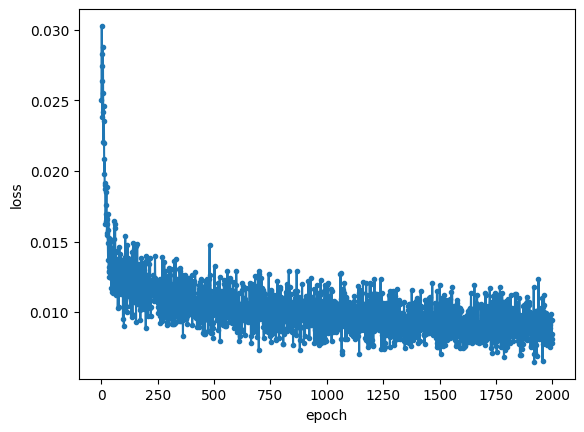

1/1 [==============================] - 0s 429ms/step


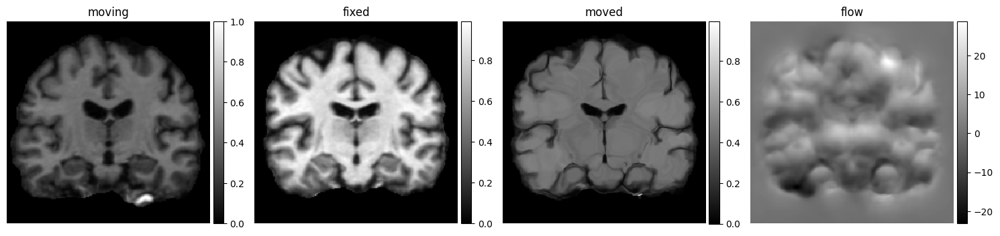

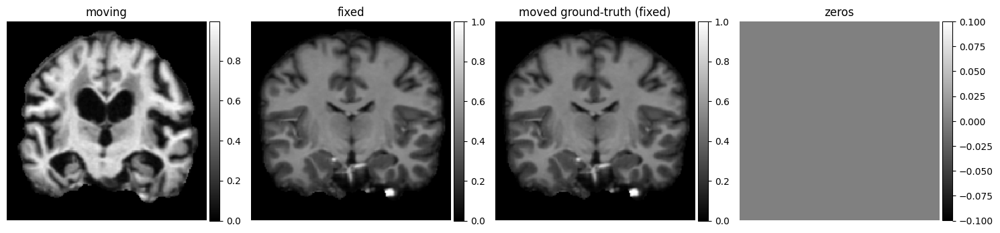

Epoch 1/2000
10/10 - 5s - loss: 0.0256 - vxm_dense_transformer_loss: 0.0256 - vxm_dense_flow_loss: 1.2287e-06 - val_loss: 0.0300 - val_vxm_dense_transformer_loss: 0.0300 - val_vxm_dense_flow_loss: 6.6795e-06 - 5s/epoch - 525ms/step
Epoch 2/2000
10/10 - 2s - loss: 0.0266 - vxm_dense_transformer_loss: 0.0266 - vxm_dense_flow_loss: 2.2604e-05 - val_loss: 0.0304 - val_vxm_dense_transformer_loss: 0.0304 - val_vxm_dense_flow_loss: 4.7916e-05 - 2s/epoch - 247ms/step
Epoch 3/2000
10/10 - 2s - loss: 0.0300 - vxm_dense_transformer_loss: 0.0300 - vxm_dense_flow_loss: 4.8048e-05 - val_loss: 0.0306 - val_vxm_dense_transformer_loss: 0.0306 - val_vxm_dense_flow_loss: 5.4065e-05 - 2s/epoch - 246ms/step
Epoch 4/2000
10/10 - 2s - loss: 0.0282 - vxm_dense_transformer_loss: 0.0282 - vxm_dense_flow_loss: 4.8454e-05 - val_loss: 0.0312 - val_vxm_dense_transformer_loss: 0.0312 - val_vxm_dense_flow_loss: 7.9108e-05 - 2s/epoch - 250ms/step
Epoch 5/2000
10/10 - 2s - loss: 0.0295 - vxm_dense_transformer_loss: 0.0

Epoch 38/2000
10/10 - 2s - loss: 0.0160 - vxm_dense_transformer_loss: 0.0147 - vxm_dense_flow_loss: 0.1289 - val_loss: 0.0159 - val_vxm_dense_transformer_loss: 0.0143 - val_vxm_dense_flow_loss: 0.1645 - 2s/epoch - 242ms/step
Epoch 39/2000
10/10 - 2s - loss: 0.0164 - vxm_dense_transformer_loss: 0.0150 - vxm_dense_flow_loss: 0.1424 - val_loss: 0.0166 - val_vxm_dense_transformer_loss: 0.0150 - val_vxm_dense_flow_loss: 0.1598 - 2s/epoch - 246ms/step
Epoch 40/2000
10/10 - 2s - loss: 0.0156 - vxm_dense_transformer_loss: 0.0142 - vxm_dense_flow_loss: 0.1417 - val_loss: 0.0161 - val_vxm_dense_transformer_loss: 0.0147 - val_vxm_dense_flow_loss: 0.1471 - 2s/epoch - 240ms/step
Epoch 41/2000
10/10 - 2s - loss: 0.0140 - vxm_dense_transformer_loss: 0.0127 - vxm_dense_flow_loss: 0.1266 - val_loss: 0.0155 - val_vxm_dense_transformer_loss: 0.0140 - val_vxm_dense_flow_loss: 0.1533 - 2s/epoch - 238ms/step
Epoch 42/2000
10/10 - 2s - loss: 0.0167 - vxm_dense_transformer_loss: 0.0152 - vxm_dense_flow_loss: 

Epoch 75/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.1431 - val_loss: 0.0153 - val_vxm_dense_transformer_loss: 0.0135 - val_vxm_dense_flow_loss: 0.1788 - 2s/epoch - 237ms/step
Epoch 76/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0112 - vxm_dense_flow_loss: 0.1513 - val_loss: 0.0158 - val_vxm_dense_transformer_loss: 0.0137 - val_vxm_dense_flow_loss: 0.2022 - 2s/epoch - 234ms/step
Epoch 77/2000
10/10 - 2s - loss: 0.0125 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 0.1477 - val_loss: 0.0149 - val_vxm_dense_transformer_loss: 0.0134 - val_vxm_dense_flow_loss: 0.1567 - 2s/epoch - 239ms/step
Epoch 78/2000
10/10 - 2s - loss: 0.0129 - vxm_dense_transformer_loss: 0.0113 - vxm_dense_flow_loss: 0.1575 - val_loss: 0.0147 - val_vxm_dense_transformer_loss: 0.0130 - val_vxm_dense_flow_loss: 0.1748 - 2s/epoch - 238ms/step
Epoch 79/2000
10/10 - 2s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 

Epoch 112/2000
10/10 - 2s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.1646 - val_loss: 0.0139 - val_vxm_dense_transformer_loss: 0.0119 - val_vxm_dense_flow_loss: 0.2036 - 2s/epoch - 237ms/step
Epoch 113/2000
10/10 - 2s - loss: 0.0129 - vxm_dense_transformer_loss: 0.0112 - vxm_dense_flow_loss: 0.1615 - val_loss: 0.0136 - val_vxm_dense_transformer_loss: 0.0116 - val_vxm_dense_flow_loss: 0.2010 - 2s/epoch - 240ms/step
Epoch 114/2000
10/10 - 3s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 0.1710 - val_loss: 0.0137 - val_vxm_dense_transformer_loss: 0.0119 - val_vxm_dense_flow_loss: 0.1814 - 3s/epoch - 252ms/step
Epoch 115/2000
10/10 - 2s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.1706 - val_loss: 0.0145 - val_vxm_dense_transformer_loss: 0.0125 - val_vxm_dense_flow_loss: 0.1980 - 2s/epoch - 239ms/step
Epoch 116/2000
10/10 - 2s - loss: 0.0141 - vxm_dense_transformer_loss: 0.0124 - vxm_dense_flow_l

Epoch 149/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1673 - val_loss: 0.0132 - val_vxm_dense_transformer_loss: 0.0111 - val_vxm_dense_flow_loss: 0.2095 - 2s/epoch - 241ms/step
Epoch 150/2000
10/10 - 2s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.1854 - val_loss: 0.0138 - val_vxm_dense_transformer_loss: 0.0118 - val_vxm_dense_flow_loss: 0.2020 - 2s/epoch - 240ms/step
Epoch 151/2000
10/10 - 2s - loss: 0.0148 - vxm_dense_transformer_loss: 0.0128 - vxm_dense_flow_loss: 0.1970 - val_loss: 0.0144 - val_vxm_dense_transformer_loss: 0.0123 - val_vxm_dense_flow_loss: 0.2092 - 2s/epoch - 241ms/step
Epoch 152/2000
10/10 - 2s - loss: 0.0131 - vxm_dense_transformer_loss: 0.0113 - vxm_dense_flow_loss: 0.1810 - val_loss: 0.0139 - val_vxm_dense_transformer_loss: 0.0119 - val_vxm_dense_flow_loss: 0.1982 - 2s/epoch - 239ms/step
Epoch 153/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_l

Epoch 186/2000
10/10 - 2s - loss: 0.0151 - vxm_dense_transformer_loss: 0.0130 - vxm_dense_flow_loss: 0.2125 - val_loss: 0.0134 - val_vxm_dense_transformer_loss: 0.0115 - val_vxm_dense_flow_loss: 0.1972 - 2s/epoch - 241ms/step
Epoch 187/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.1808 - val_loss: 0.0132 - val_vxm_dense_transformer_loss: 0.0114 - val_vxm_dense_flow_loss: 0.1790 - 2s/epoch - 238ms/step
Epoch 188/2000
10/10 - 2s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.1781 - val_loss: 0.0131 - val_vxm_dense_transformer_loss: 0.0111 - val_vxm_dense_flow_loss: 0.2030 - 2s/epoch - 243ms/step
Epoch 189/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.1738 - val_loss: 0.0136 - val_vxm_dense_transformer_loss: 0.0114 - val_vxm_dense_flow_loss: 0.2234 - 2s/epoch - 243ms/step
Epoch 190/2000
10/10 - 2s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_l

Epoch 223/2000
10/10 - 2s - loss: 0.0146 - vxm_dense_transformer_loss: 0.0127 - vxm_dense_flow_loss: 0.1913 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2070 - 2s/epoch - 244ms/step
Epoch 224/2000
10/10 - 2s - loss: 0.0138 - vxm_dense_transformer_loss: 0.0118 - vxm_dense_flow_loss: 0.2021 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0107 - val_vxm_dense_flow_loss: 0.2159 - 2s/epoch - 236ms/step
Epoch 225/2000
10/10 - 2s - loss: 0.0166 - vxm_dense_transformer_loss: 0.0144 - vxm_dense_flow_loss: 0.2236 - val_loss: 0.0134 - val_vxm_dense_transformer_loss: 0.0110 - val_vxm_dense_flow_loss: 0.2393 - 2s/epoch - 241ms/step
Epoch 226/2000
10/10 - 2s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0104 - vxm_dense_flow_loss: 0.1963 - val_loss: 0.0128 - val_vxm_dense_transformer_loss: 0.0107 - val_vxm_dense_flow_loss: 0.2098 - 2s/epoch - 238ms/step
Epoch 227/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_l

Epoch 260/2000
10/10 - 2s - loss: 0.0125 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.1923 - val_loss: 0.0136 - val_vxm_dense_transformer_loss: 0.0113 - val_vxm_dense_flow_loss: 0.2263 - 2s/epoch - 244ms/step
Epoch 261/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.1728 - val_loss: 0.0133 - val_vxm_dense_transformer_loss: 0.0112 - val_vxm_dense_flow_loss: 0.2064 - 2s/epoch - 243ms/step
Epoch 262/2000
10/10 - 2s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.1944 - val_loss: 0.0131 - val_vxm_dense_transformer_loss: 0.0111 - val_vxm_dense_flow_loss: 0.2023 - 2s/epoch - 240ms/step
Epoch 263/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0107 - val_vxm_dense_flow_loss: 0.2175 - 2s/epoch - 231ms/step
Epoch 264/2000
10/10 - 3s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_l

Epoch 297/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1721 - val_loss: 0.0131 - val_vxm_dense_transformer_loss: 0.0111 - val_vxm_dense_flow_loss: 0.1995 - 2s/epoch - 240ms/step
Epoch 298/2000
10/10 - 2s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_loss: 0.1946 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.2212 - 2s/epoch - 246ms/step
Epoch 299/2000
10/10 - 2s - loss: 0.0147 - vxm_dense_transformer_loss: 0.0124 - vxm_dense_flow_loss: 0.2236 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0105 - val_vxm_dense_flow_loss: 0.1977 - 2s/epoch - 245ms/step
Epoch 300/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.2105 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.1905 - 2s/epoch - 239ms/step
Epoch 301/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_l

Epoch 334/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.1955 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.2111 - 2s/epoch - 245ms/step
Epoch 335/2000
10/10 - 2s - loss: 0.0131 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_loss: 0.2063 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.2207 - 2s/epoch - 246ms/step
Epoch 336/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.1895 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0106 - val_vxm_dense_flow_loss: 0.2331 - 2s/epoch - 246ms/step
Epoch 337/2000
10/10 - 2s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2021 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2030 - 2s/epoch - 235ms/step
Epoch 338/2000
10/10 - 2s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_l

Epoch 371/2000
10/10 - 2s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2066 - val_loss: 0.0130 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.2166 - 2s/epoch - 233ms/step
Epoch 372/2000
10/10 - 3s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0107 - vxm_dense_flow_loss: 0.1889 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.2064 - 3s/epoch - 253ms/step
Epoch 373/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.1882 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2051 - 3s/epoch - 251ms/step
Epoch 374/2000
10/10 - 3s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2002 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2328 - 3s/epoch - 253ms/step
Epoch 375/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_l

Epoch 408/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.2095 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2209 - 2s/epoch - 241ms/step
Epoch 409/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.1895 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2043 - 2s/epoch - 242ms/step
Epoch 410/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1949 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.2056 - 2s/epoch - 237ms/step
Epoch 411/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2023 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2237 - 2s/epoch - 237ms/step
Epoch 412/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_l

Epoch 445/2000
10/10 - 2s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.1854 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2080 - 2s/epoch - 243ms/step
Epoch 446/2000
10/10 - 2s - loss: 0.0143 - vxm_dense_transformer_loss: 0.0122 - vxm_dense_flow_loss: 0.2148 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2217 - 2s/epoch - 240ms/step
Epoch 447/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.2021 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2263 - 2s/epoch - 244ms/step
Epoch 448/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1971 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2602 - 2s/epoch - 237ms/step
Epoch 449/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_l

Epoch 482/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1867 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2187 - 2s/epoch - 239ms/step
Epoch 483/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2099 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2037 - 2s/epoch - 244ms/step
Epoch 484/2000
10/10 - 2s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2038 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2103 - 2s/epoch - 242ms/step
Epoch 485/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0104 - vxm_dense_flow_loss: 0.2283 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2293 - 2s/epoch - 243ms/step
Epoch 486/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_l

Epoch 519/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1931 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2184 - 2s/epoch - 230ms/step
Epoch 520/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2181 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2149 - 2s/epoch - 233ms/step
Epoch 521/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1994 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2180 - 2s/epoch - 241ms/step
Epoch 522/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2081 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2202 - 2s/epoch - 245ms/step
Epoch 523/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_l

Epoch 556/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1935 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2221 - 2s/epoch - 245ms/step
Epoch 557/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2096 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2069 - 3s/epoch - 257ms/step
Epoch 558/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1901 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2218 - 3s/epoch - 253ms/step
Epoch 559/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2110 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2305 - 2s/epoch - 249ms/step
Epoch 560/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_l

Epoch 593/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1992 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2218 - 2s/epoch - 237ms/step
Epoch 594/2000
10/10 - 2s - loss: 0.0132 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_loss: 0.2126 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2162 - 2s/epoch - 239ms/step
Epoch 595/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2023 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2085 - 2s/epoch - 240ms/step
Epoch 596/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2201 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2177 - 2s/epoch - 250ms/step
Epoch 597/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_l

Epoch 630/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1923 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2133 - 2s/epoch - 240ms/step
Epoch 631/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2118 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2288 - 2s/epoch - 240ms/step
Epoch 632/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.1959 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2158 - 2s/epoch - 238ms/step
Epoch 633/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2068 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2137 - 2s/epoch - 238ms/step
Epoch 634/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_l

Epoch 667/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2187 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2281 - 2s/epoch - 240ms/step
Epoch 668/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2066 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2166 - 2s/epoch - 235ms/step
Epoch 669/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2179 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2135 - 2s/epoch - 248ms/step
Epoch 670/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.1981 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2078 - 2s/epoch - 241ms/step
Epoch 671/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_l

Epoch 704/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.2077 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2287 - 2s/epoch - 245ms/step
Epoch 705/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2154 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2110 - 2s/epoch - 244ms/step
Epoch 706/2000
10/10 - 2s - loss: 0.0128 - vxm_dense_transformer_loss: 0.0108 - vxm_dense_flow_loss: 0.2023 - val_loss: 0.0126 - val_vxm_dense_transformer_loss: 0.0109 - val_vxm_dense_flow_loss: 0.1759 - 2s/epoch - 236ms/step
Epoch 707/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1980 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.1827 - 2s/epoch - 237ms/step
Epoch 708/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_l

Epoch 741/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1988 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2051 - 2s/epoch - 248ms/step
Epoch 742/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2002 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2252 - 2s/epoch - 247ms/step
Epoch 743/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2042 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2195 - 2s/epoch - 250ms/step
Epoch 744/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1919 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2225 - 2s/epoch - 247ms/step
Epoch 745/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_l

Epoch 778/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2198 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2176 - 2s/epoch - 247ms/step
Epoch 779/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1937 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2182 - 2s/epoch - 248ms/step
Epoch 780/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1909 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2151 - 2s/epoch - 248ms/step
Epoch 781/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2079 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2141 - 2s/epoch - 240ms/step
Epoch 782/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_l

Epoch 815/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.1993 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2236 - 2s/epoch - 248ms/step
Epoch 816/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1846 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2253 - 2s/epoch - 249ms/step
Epoch 817/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1926 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2277 - 2s/epoch - 245ms/step
Epoch 818/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1955 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2094 - 2s/epoch - 239ms/step
Epoch 819/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_l

Epoch 852/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2041 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2166 - 2s/epoch - 243ms/step
Epoch 853/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1794 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2254 - 2s/epoch - 235ms/step
Epoch 854/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2098 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2163 - 2s/epoch - 249ms/step
Epoch 855/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2196 - 2s/epoch - 237ms/step
Epoch 856/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_l

Epoch 889/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1953 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2235 - 2s/epoch - 242ms/step
Epoch 890/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2056 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2209 - 2s/epoch - 237ms/step
Epoch 891/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2305 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2164 - 2s/epoch - 249ms/step
Epoch 892/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2059 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2208 - 2s/epoch - 241ms/step
Epoch 893/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_l

Epoch 926/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2112 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2199 - 2s/epoch - 246ms/step
Epoch 927/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2187 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2168 - 2s/epoch - 234ms/step
Epoch 928/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1929 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2305 - 2s/epoch - 243ms/step
Epoch 929/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2127 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2174 - 2s/epoch - 235ms/step
Epoch 930/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_l

Epoch 963/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2040 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2256 - 2s/epoch - 237ms/step
Epoch 964/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.2099 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2201 - 2s/epoch - 242ms/step
Epoch 965/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2215 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2198 - 2s/epoch - 238ms/step
Epoch 966/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2240 - 2s/epoch - 239ms/step
Epoch 967/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_l

Epoch 1000/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2074 - 2s/epoch - 247ms/step
Epoch 1001/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1961 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2196 - 2s/epoch - 244ms/step
Epoch 1002/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1911 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2134 - 2s/epoch - 239ms/step
Epoch 1003/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2072 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2200 - 2s/epoch - 232ms/step
Epoch 1004/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_f

Epoch 1037/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2029 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2267 - 2s/epoch - 235ms/step
Epoch 1038/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2139 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2115 - 2s/epoch - 246ms/step
Epoch 1039/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1928 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2155 - 2s/epoch - 244ms/step
Epoch 1040/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2232 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2146 - 2s/epoch - 243ms/step
Epoch 1041/2000
10/10 - 2s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_f

Epoch 1074/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2038 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2150 - 2s/epoch - 239ms/step
Epoch 1075/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1857 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2160 - 2s/epoch - 241ms/step
Epoch 1076/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2194 - 2s/epoch - 241ms/step
Epoch 1077/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2268 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2147 - 2s/epoch - 233ms/step
Epoch 1078/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_f

Epoch 1111/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2004 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2190 - 2s/epoch - 238ms/step
Epoch 1112/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2009 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2111 - 2s/epoch - 239ms/step
Epoch 1113/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2151 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2175 - 2s/epoch - 240ms/step
Epoch 1114/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1947 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2126 - 2s/epoch - 239ms/step
Epoch 1115/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_f

Epoch 1148/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1959 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2062 - 2s/epoch - 242ms/step
Epoch 1149/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.1911 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2197 - 2s/epoch - 245ms/step
Epoch 1150/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1984 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2201 - 2s/epoch - 239ms/step
Epoch 1151/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2166 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2180 - 2s/epoch - 238ms/step
Epoch 1152/2000
10/10 - 2s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_f

Epoch 1185/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1936 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2251 - 2s/epoch - 237ms/step
Epoch 1186/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1877 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2367 - 2s/epoch - 250ms/step
Epoch 1187/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2177 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2202 - 2s/epoch - 240ms/step
Epoch 1188/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2093 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2162 - 2s/epoch - 247ms/step
Epoch 1189/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_f

Epoch 1222/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.2062 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2364 - 2s/epoch - 247ms/step
Epoch 1223/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2243 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.1961 - 2s/epoch - 240ms/step
Epoch 1224/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1981 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.1999 - 2s/epoch - 236ms/step
Epoch 1225/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1936 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2085 - 2s/epoch - 241ms/step
Epoch 1226/2000
10/10 - 2s - loss: 0.0081 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_f

Epoch 1259/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2252 - 2s/epoch - 242ms/step
Epoch 1260/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1989 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2144 - 2s/epoch - 249ms/step
Epoch 1261/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2074 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2230 - 2s/epoch - 242ms/step
Epoch 1262/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1959 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2120 - 2s/epoch - 247ms/step
Epoch 1263/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_f

Epoch 1296/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.1980 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2072 - 2s/epoch - 248ms/step
Epoch 1297/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1872 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2124 - 2s/epoch - 242ms/step
Epoch 1298/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2242 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2202 - 2s/epoch - 238ms/step
Epoch 1299/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1964 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2208 - 2s/epoch - 244ms/step
Epoch 1300/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1333/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1930 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2077 - 2s/epoch - 242ms/step
Epoch 1334/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2070 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2155 - 2s/epoch - 244ms/step
Epoch 1335/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1950 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2144 - 2s/epoch - 246ms/step
Epoch 1336/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1900 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2238 - 2s/epoch - 240ms/step
Epoch 1337/2000
10/10 - 2s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_f

Epoch 1370/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2028 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2195 - 2s/epoch - 245ms/step
Epoch 1371/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1997 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2136 - 2s/epoch - 236ms/step
Epoch 1372/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2103 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2188 - 2s/epoch - 236ms/step
Epoch 1373/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2088 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2189 - 2s/epoch - 244ms/step
Epoch 1374/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_f

Epoch 1407/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2106 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2180 - 3s/epoch - 252ms/step
Epoch 1408/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2011 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2150 - 3s/epoch - 251ms/step
Epoch 1409/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2032 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2284 - 2s/epoch - 245ms/step
Epoch 1410/2000
10/10 - 2s - loss: 0.0081 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_flow_loss: 0.2044 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2127 - 2s/epoch - 244ms/step
Epoch 1411/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_f

Epoch 1444/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1984 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2148 - 2s/epoch - 240ms/step
Epoch 1445/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2195 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2148 - 2s/epoch - 244ms/step
Epoch 1446/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2078 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2158 - 2s/epoch - 234ms/step
Epoch 1447/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2113 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2220 - 2s/epoch - 241ms/step
Epoch 1448/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1481/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1791 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2115 - 2s/epoch - 241ms/step
Epoch 1482/2000
10/10 - 2s - loss: 0.0131 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 0.2121 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2186 - 2s/epoch - 244ms/step
Epoch 1483/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.2100 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2212 - 2s/epoch - 245ms/step
Epoch 1484/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2125 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2170 - 2s/epoch - 246ms/step
Epoch 1485/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_f

Epoch 1518/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2188 - val_loss: 0.0095 - val_vxm_dense_transformer_loss: 0.0074 - val_vxm_dense_flow_loss: 0.2153 - 2s/epoch - 240ms/step
Epoch 1519/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2094 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2172 - 2s/epoch - 237ms/step
Epoch 1520/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2006 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2196 - 2s/epoch - 248ms/step
Epoch 1521/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1979 - val_loss: 0.0095 - val_vxm_dense_transformer_loss: 0.0074 - val_vxm_dense_flow_loss: 0.2117 - 2s/epoch - 241ms/step
Epoch 1522/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_f

Epoch 1555/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1915 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2254 - 2s/epoch - 242ms/step
Epoch 1556/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2048 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2208 - 2s/epoch - 247ms/step
Epoch 1557/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2031 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2195 - 2s/epoch - 242ms/step
Epoch 1558/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_flow_loss: 0.1992 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2181 - 2s/epoch - 246ms/step
Epoch 1559/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_f

Epoch 1592/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1869 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2141 - 2s/epoch - 246ms/step
Epoch 1593/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1990 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2142 - 3s/epoch - 255ms/step
Epoch 1594/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2105 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2357 - 2s/epoch - 242ms/step
Epoch 1595/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.2165 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2069 - 2s/epoch - 246ms/step
Epoch 1596/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_f

Epoch 1629/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2099 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2223 - 3s/epoch - 252ms/step
Epoch 1630/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2006 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2291 - 2s/epoch - 242ms/step
Epoch 1631/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1903 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.1992 - 2s/epoch - 236ms/step
Epoch 1632/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1911 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2040 - 2s/epoch - 238ms/step
Epoch 1633/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_f

Epoch 1666/2000
10/10 - 2s - loss: 0.0072 - vxm_dense_transformer_loss: 0.0053 - vxm_dense_flow_loss: 0.1870 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2273 - 2s/epoch - 237ms/step
Epoch 1667/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1791 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2145 - 2s/epoch - 242ms/step
Epoch 1668/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2127 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2125 - 2s/epoch - 241ms/step
Epoch 1669/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2302 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2265 - 2s/epoch - 239ms/step
Epoch 1670/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_f

Epoch 1703/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2121 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2232 - 2s/epoch - 246ms/step
Epoch 1704/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1987 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2163 - 2s/epoch - 240ms/step
Epoch 1705/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1943 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2168 - 2s/epoch - 247ms/step
Epoch 1706/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1865 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2119 - 2s/epoch - 246ms/step
Epoch 1707/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_f

Epoch 1740/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2185 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2102 - 2s/epoch - 239ms/step
Epoch 1741/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2075 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2194 - 2s/epoch - 245ms/step
Epoch 1742/2000
10/10 - 2s - loss: 0.0072 - vxm_dense_transformer_loss: 0.0054 - vxm_dense_flow_loss: 0.1855 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2185 - 2s/epoch - 245ms/step
Epoch 1743/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2250 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2252 - 2s/epoch - 241ms/step
Epoch 1744/2000
10/10 - 3s - loss: 0.0076 - vxm_dense_transformer_loss: 0.0058 - vxm_dense_f

Epoch 1777/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2003 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2201 - 2s/epoch - 233ms/step
Epoch 1778/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2145 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2196 - 2s/epoch - 237ms/step
Epoch 1779/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1989 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2210 - 2s/epoch - 243ms/step
Epoch 1780/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1979 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2135 - 2s/epoch - 239ms/step
Epoch 1781/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_f

Epoch 1814/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2000 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2287 - 3s/epoch - 251ms/step
Epoch 1815/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2164 - 2s/epoch - 237ms/step
Epoch 1816/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2231 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2250 - 2s/epoch - 234ms/step
Epoch 1817/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.1934 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2169 - 2s/epoch - 246ms/step
Epoch 1818/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_f

Epoch 1851/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1928 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2114 - 3s/epoch - 252ms/step
Epoch 1852/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1928 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2163 - 2s/epoch - 240ms/step
Epoch 1853/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2055 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2182 - 2s/epoch - 246ms/step
Epoch 1854/2000
10/10 - 2s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1972 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2182 - 2s/epoch - 241ms/step
Epoch 1855/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1888/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1778 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2245 - 2s/epoch - 242ms/step
Epoch 1889/2000
10/10 - 2s - loss: 0.0076 - vxm_dense_transformer_loss: 0.0058 - vxm_dense_flow_loss: 0.1820 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2311 - 2s/epoch - 242ms/step
Epoch 1890/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1941 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2240 - 2s/epoch - 237ms/step
Epoch 1891/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2003 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2213 - 2s/epoch - 239ms/step
Epoch 1892/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_f

Epoch 1925/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2207 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2193 - 2s/epoch - 246ms/step
Epoch 1926/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2189 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2091 - 2s/epoch - 235ms/step
Epoch 1927/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_flow_loss: 0.2061 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2173 - 2s/epoch - 238ms/step
Epoch 1928/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2094 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2160 - 2s/epoch - 235ms/step
Epoch 1929/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_f

Epoch 1962/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2009 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2221 - 2s/epoch - 234ms/step
Epoch 1963/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1832 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2169 - 2s/epoch - 236ms/step
Epoch 1964/2000
10/10 - 2s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2358 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2120 - 2s/epoch - 245ms/step
Epoch 1965/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2046 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2099 - 2s/epoch - 241ms/step
Epoch 1966/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_f

Epoch 1999/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2180 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2175 - 3s/epoch - 251ms/step
Epoch 2000/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1967 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2229 - 2s/epoch - 247ms/step


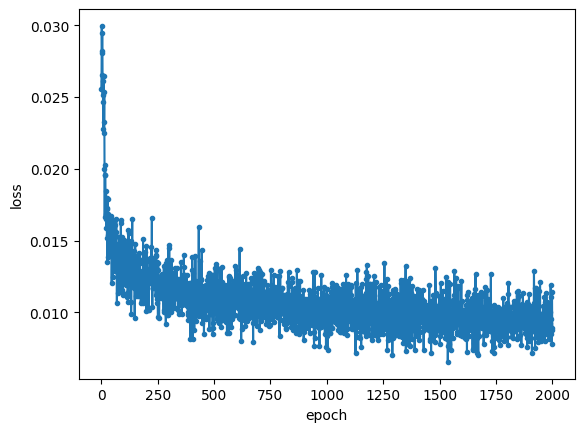

1/1 [==============================] - 0s 436ms/step


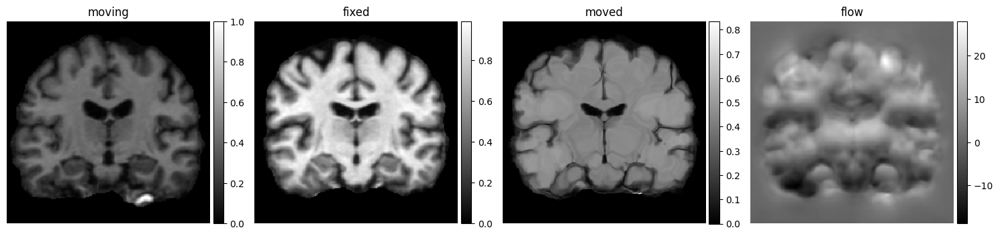

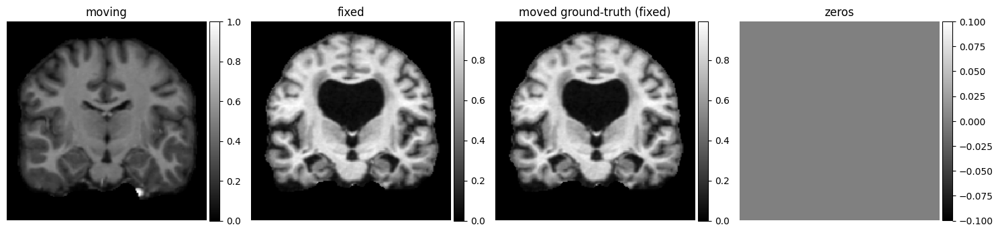

Epoch 1/2000
10/10 - 6s - loss: 0.0302 - vxm_dense_transformer_loss: 0.0302 - vxm_dense_flow_loss: 8.3170e-07 - val_loss: 0.0308 - val_vxm_dense_transformer_loss: 0.0308 - val_vxm_dense_flow_loss: 4.5308e-06 - 6s/epoch - 589ms/step
Epoch 2/2000
10/10 - 3s - loss: 0.0256 - vxm_dense_transformer_loss: 0.0256 - vxm_dense_flow_loss: 1.5041e-05 - val_loss: 0.0305 - val_vxm_dense_transformer_loss: 0.0305 - val_vxm_dense_flow_loss: 5.4067e-05 - 3s/epoch - 250ms/step
Epoch 3/2000
10/10 - 2s - loss: 0.0268 - vxm_dense_transformer_loss: 0.0268 - vxm_dense_flow_loss: 8.3119e-05 - val_loss: 0.0313 - val_vxm_dense_transformer_loss: 0.0313 - val_vxm_dense_flow_loss: 1.0813e-04 - 2s/epoch - 250ms/step
Epoch 4/2000
10/10 - 2s - loss: 0.0286 - vxm_dense_transformer_loss: 0.0286 - vxm_dense_flow_loss: 7.3960e-05 - val_loss: 0.0318 - val_vxm_dense_transformer_loss: 0.0318 - val_vxm_dense_flow_loss: 7.5478e-05 - 2s/epoch - 243ms/step
Epoch 5/2000
10/10 - 2s - loss: 0.0278 - vxm_dense_transformer_loss: 0.0

Epoch 38/2000
10/10 - 3s - loss: 0.0132 - vxm_dense_transformer_loss: 0.0119 - vxm_dense_flow_loss: 0.1230 - val_loss: 0.0157 - val_vxm_dense_transformer_loss: 0.0142 - val_vxm_dense_flow_loss: 0.1508 - 3s/epoch - 253ms/step
Epoch 39/2000
10/10 - 2s - loss: 0.0145 - vxm_dense_transformer_loss: 0.0131 - vxm_dense_flow_loss: 0.1386 - val_loss: 0.0158 - val_vxm_dense_transformer_loss: 0.0144 - val_vxm_dense_flow_loss: 0.1475 - 2s/epoch - 250ms/step
Epoch 40/2000
10/10 - 2s - loss: 0.0144 - vxm_dense_transformer_loss: 0.0130 - vxm_dense_flow_loss: 0.1334 - val_loss: 0.0161 - val_vxm_dense_transformer_loss: 0.0146 - val_vxm_dense_flow_loss: 0.1482 - 2s/epoch - 243ms/step
Epoch 41/2000
10/10 - 2s - loss: 0.0135 - vxm_dense_transformer_loss: 0.0122 - vxm_dense_flow_loss: 0.1325 - val_loss: 0.0157 - val_vxm_dense_transformer_loss: 0.0141 - val_vxm_dense_flow_loss: 0.1579 - 2s/epoch - 246ms/step
Epoch 42/2000
10/10 - 2s - loss: 0.0157 - vxm_dense_transformer_loss: 0.0143 - vxm_dense_flow_loss: 

Epoch 75/2000
10/10 - 2s - loss: 0.0147 - vxm_dense_transformer_loss: 0.0131 - vxm_dense_flow_loss: 0.1646 - val_loss: 0.0143 - val_vxm_dense_transformer_loss: 0.0126 - val_vxm_dense_flow_loss: 0.1730 - 2s/epoch - 244ms/step
Epoch 76/2000
10/10 - 2s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 0.1576 - val_loss: 0.0144 - val_vxm_dense_transformer_loss: 0.0127 - val_vxm_dense_flow_loss: 0.1653 - 2s/epoch - 246ms/step
Epoch 77/2000
10/10 - 2s - loss: 0.0133 - vxm_dense_transformer_loss: 0.0117 - vxm_dense_flow_loss: 0.1609 - val_loss: 0.0144 - val_vxm_dense_transformer_loss: 0.0126 - val_vxm_dense_flow_loss: 0.1790 - 2s/epoch - 242ms/step
Epoch 78/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0112 - vxm_dense_flow_loss: 0.1486 - val_loss: 0.0144 - val_vxm_dense_transformer_loss: 0.0126 - val_vxm_dense_flow_loss: 0.1772 - 2s/epoch - 249ms/step
Epoch 79/2000
10/10 - 2s - loss: 0.0142 - vxm_dense_transformer_loss: 0.0126 - vxm_dense_flow_loss: 

Epoch 112/2000
10/10 - 2s - loss: 0.0130 - vxm_dense_transformer_loss: 0.0112 - vxm_dense_flow_loss: 0.1775 - val_loss: 0.0137 - val_vxm_dense_transformer_loss: 0.0117 - val_vxm_dense_flow_loss: 0.1937 - 2s/epoch - 245ms/step
Epoch 113/2000
10/10 - 2s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.1701 - val_loss: 0.0141 - val_vxm_dense_transformer_loss: 0.0123 - val_vxm_dense_flow_loss: 0.1842 - 2s/epoch - 242ms/step
Epoch 114/2000
10/10 - 2s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.1811 - val_loss: 0.0135 - val_vxm_dense_transformer_loss: 0.0117 - val_vxm_dense_flow_loss: 0.1836 - 2s/epoch - 241ms/step
Epoch 115/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.1711 - val_loss: 0.0131 - val_vxm_dense_transformer_loss: 0.0112 - val_vxm_dense_flow_loss: 0.1848 - 2s/epoch - 245ms/step
Epoch 116/2000
10/10 - 2s - loss: 0.0132 - vxm_dense_transformer_loss: 0.0112 - vxm_dense_flow_l

Epoch 149/2000
10/10 - 2s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.1810 - val_loss: 0.0137 - val_vxm_dense_transformer_loss: 0.0117 - val_vxm_dense_flow_loss: 0.2003 - 2s/epoch - 243ms/step
Epoch 150/2000
10/10 - 2s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0104 - vxm_dense_flow_loss: 0.1908 - val_loss: 0.0134 - val_vxm_dense_transformer_loss: 0.0114 - val_vxm_dense_flow_loss: 0.1987 - 2s/epoch - 248ms/step
Epoch 151/2000
10/10 - 2s - loss: 0.0124 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.1951 - val_loss: 0.0134 - val_vxm_dense_transformer_loss: 0.0113 - val_vxm_dense_flow_loss: 0.2109 - 2s/epoch - 248ms/step
Epoch 152/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.1800 - val_loss: 0.0134 - val_vxm_dense_transformer_loss: 0.0113 - val_vxm_dense_flow_loss: 0.2174 - 2s/epoch - 249ms/step
Epoch 153/2000
10/10 - 3s - loss: 0.0134 - vxm_dense_transformer_loss: 0.0115 - vxm_dense_flow_l

Epoch 186/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1801 - val_loss: 0.0134 - val_vxm_dense_transformer_loss: 0.0115 - val_vxm_dense_flow_loss: 0.1953 - 3s/epoch - 252ms/step
Epoch 187/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1783 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.1905 - 2s/epoch - 248ms/step
Epoch 188/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_loss: 0.1904 - val_loss: 0.0128 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.2001 - 3s/epoch - 251ms/step
Epoch 189/2000
10/10 - 2s - loss: 0.0136 - vxm_dense_transformer_loss: 0.0115 - vxm_dense_flow_loss: 0.2126 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2181 - 2s/epoch - 245ms/step
Epoch 190/2000
10/10 - 2s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_l

Epoch 223/2000
10/10 - 2s - loss: 0.0130 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_loss: 0.1915 - val_loss: 0.0127 - val_vxm_dense_transformer_loss: 0.0106 - val_vxm_dense_flow_loss: 0.2115 - 2s/epoch - 249ms/step
Epoch 224/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.1879 - val_loss: 0.0128 - val_vxm_dense_transformer_loss: 0.0105 - val_vxm_dense_flow_loss: 0.2233 - 2s/epoch - 241ms/step
Epoch 225/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.1906 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.2033 - 2s/epoch - 249ms/step
Epoch 226/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.1878 - val_loss: 0.0133 - val_vxm_dense_transformer_loss: 0.0112 - val_vxm_dense_flow_loss: 0.2071 - 2s/epoch - 246ms/step
Epoch 227/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_l

Epoch 260/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1957 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2138 - 2s/epoch - 247ms/step
Epoch 261/2000
10/10 - 2s - loss: 0.0135 - vxm_dense_transformer_loss: 0.0115 - vxm_dense_flow_loss: 0.1967 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2229 - 2s/epoch - 245ms/step
Epoch 262/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1911 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2019 - 2s/epoch - 248ms/step
Epoch 263/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1966 - val_loss: 0.0126 - val_vxm_dense_transformer_loss: 0.0106 - val_vxm_dense_flow_loss: 0.1994 - 2s/epoch - 247ms/step
Epoch 264/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_l

Epoch 297/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2089 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2128 - 2s/epoch - 240ms/step
Epoch 298/2000
10/10 - 2s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.1905 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2295 - 2s/epoch - 241ms/step
Epoch 299/2000
10/10 - 2s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_loss: 0.2087 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2199 - 2s/epoch - 243ms/step
Epoch 300/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.1987 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2107 - 2s/epoch - 242ms/step
Epoch 301/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_l

Epoch 334/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1771 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2202 - 2s/epoch - 245ms/step
Epoch 335/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2134 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2147 - 3s/epoch - 252ms/step
Epoch 336/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2058 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2134 - 2s/epoch - 245ms/step
Epoch 337/2000
10/10 - 2s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_loss: 0.2018 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2134 - 2s/epoch - 241ms/step
Epoch 338/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_l

Epoch 371/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1924 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2096 - 2s/epoch - 244ms/step
Epoch 372/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1963 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2006 - 2s/epoch - 245ms/step
Epoch 373/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1897 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2124 - 2s/epoch - 244ms/step
Epoch 374/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1965 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2106 - 3s/epoch - 252ms/step
Epoch 375/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_l

Epoch 408/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.2080 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2017 - 2s/epoch - 242ms/step
Epoch 409/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0099 - vxm_dense_flow_loss: 0.2127 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2184 - 3s/epoch - 256ms/step
Epoch 410/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2072 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2120 - 3s/epoch - 251ms/step
Epoch 411/2000
10/10 - 3s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.2032 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2126 - 3s/epoch - 260ms/step
Epoch 412/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_l

Epoch 445/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1854 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2102 - 3s/epoch - 254ms/step
Epoch 446/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.1891 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2105 - 3s/epoch - 260ms/step
Epoch 447/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.1853 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2035 - 2s/epoch - 246ms/step
Epoch 448/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1820 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.1916 - 2s/epoch - 249ms/step
Epoch 449/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_l

Epoch 482/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2120 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.1989 - 3s/epoch - 256ms/step
Epoch 483/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1866 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.1980 - 3s/epoch - 252ms/step
Epoch 484/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1894 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2152 - 2s/epoch - 250ms/step
Epoch 485/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1996 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2087 - 3s/epoch - 253ms/step
Epoch 486/2000
10/10 - 3s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_l

Epoch 519/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1878 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2180 - 2s/epoch - 248ms/step
Epoch 520/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.1871 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2185 - 3s/epoch - 252ms/step
Epoch 521/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1830 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2161 - 2s/epoch - 240ms/step
Epoch 522/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.2013 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2156 - 2s/epoch - 249ms/step
Epoch 523/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_l

Epoch 556/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1977 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2191 - 3s/epoch - 297ms/step
Epoch 557/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.1867 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2178 - 2s/epoch - 250ms/step
Epoch 558/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2297 - 2s/epoch - 241ms/step
Epoch 559/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2247 - 2s/epoch - 248ms/step
Epoch 560/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_l

Epoch 593/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1992 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2094 - 2s/epoch - 232ms/step
Epoch 594/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1930 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2107 - 2s/epoch - 248ms/step
Epoch 595/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1902 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2199 - 2s/epoch - 247ms/step
Epoch 596/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2005 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2169 - 2s/epoch - 247ms/step
Epoch 597/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_l

Epoch 630/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2071 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2090 - 2s/epoch - 248ms/step
Epoch 631/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1883 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2158 - 3s/epoch - 251ms/step
Epoch 632/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1910 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2150 - 2s/epoch - 247ms/step
Epoch 633/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.1983 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2096 - 3s/epoch - 252ms/step
Epoch 634/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_l

Epoch 667/2000
10/10 - 3s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2039 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2153 - 3s/epoch - 253ms/step
Epoch 668/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.2202 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2081 - 3s/epoch - 254ms/step
Epoch 669/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1878 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2261 - 2s/epoch - 248ms/step
Epoch 670/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2075 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2119 - 3s/epoch - 253ms/step
Epoch 671/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_l

Epoch 704/2000
10/10 - 2s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1974 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2169 - 2s/epoch - 243ms/step
Epoch 705/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1818 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2081 - 2s/epoch - 246ms/step
Epoch 706/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2051 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2046 - 2s/epoch - 243ms/step
Epoch 707/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1975 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2347 - 2s/epoch - 245ms/step
Epoch 708/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_l

Epoch 741/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.2045 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2027 - 2s/epoch - 245ms/step
Epoch 742/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2064 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.1972 - 2s/epoch - 241ms/step
Epoch 743/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1873 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2172 - 3s/epoch - 251ms/step
Epoch 744/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1925 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2139 - 2s/epoch - 245ms/step
Epoch 745/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_l

Epoch 778/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2040 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2150 - 2s/epoch - 249ms/step
Epoch 779/2000
10/10 - 3s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2191 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2102 - 3s/epoch - 251ms/step
Epoch 780/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.1970 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2147 - 3s/epoch - 254ms/step
Epoch 781/2000
10/10 - 3s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.1979 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2172 - 3s/epoch - 251ms/step
Epoch 782/2000
10/10 - 3s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_l

Epoch 815/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2051 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2168 - 2s/epoch - 241ms/step
Epoch 816/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2012 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2080 - 2s/epoch - 244ms/step
Epoch 817/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2027 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2051 - 2s/epoch - 230ms/step
Epoch 818/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2107 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2272 - 2s/epoch - 243ms/step
Epoch 819/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_l

Epoch 852/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1868 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2236 - 2s/epoch - 247ms/step
Epoch 853/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1880 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2103 - 2s/epoch - 244ms/step
Epoch 854/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1928 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2152 - 2s/epoch - 245ms/step
Epoch 855/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1967 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2124 - 2s/epoch - 247ms/step
Epoch 856/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_l

Epoch 889/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1931 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2103 - 2s/epoch - 238ms/step
Epoch 890/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1961 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2175 - 2s/epoch - 243ms/step
Epoch 891/2000
10/10 - 2s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1825 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2114 - 2s/epoch - 243ms/step
Epoch 892/2000
10/10 - 3s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1940 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2120 - 3s/epoch - 251ms/step
Epoch 893/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_l

Epoch 926/2000
10/10 - 2s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0058 - vxm_dense_flow_loss: 0.1989 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2124 - 2s/epoch - 247ms/step
Epoch 927/2000
10/10 - 2s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2189 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2297 - 2s/epoch - 247ms/step
Epoch 928/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2087 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2101 - 2s/epoch - 240ms/step
Epoch 929/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1912 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2158 - 2s/epoch - 242ms/step
Epoch 930/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_l

Epoch 963/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2126 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2091 - 2s/epoch - 245ms/step
Epoch 964/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1914 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2053 - 2s/epoch - 247ms/step
Epoch 965/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1887 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2134 - 2s/epoch - 242ms/step
Epoch 966/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1995 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2220 - 2s/epoch - 250ms/step
Epoch 967/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_l

Epoch 1000/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2098 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2309 - 2s/epoch - 245ms/step
Epoch 1001/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2081 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2165 - 2s/epoch - 242ms/step
Epoch 1002/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2170 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2120 - 2s/epoch - 243ms/step
Epoch 1003/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1990 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2268 - 2s/epoch - 245ms/step
Epoch 1004/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_f

Epoch 1037/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.1944 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2253 - 3s/epoch - 252ms/step
Epoch 1038/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1911 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2164 - 2s/epoch - 242ms/step
Epoch 1039/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2094 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2348 - 2s/epoch - 245ms/step
Epoch 1040/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2146 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2086 - 2s/epoch - 247ms/step
Epoch 1041/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_f

Epoch 1074/2000
10/10 - 3s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2029 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2184 - 3s/epoch - 258ms/step
Epoch 1075/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1936 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2218 - 3s/epoch - 258ms/step
Epoch 1076/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2029 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2277 - 3s/epoch - 262ms/step
Epoch 1077/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1992 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2298 - 2s/epoch - 249ms/step
Epoch 1078/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1111/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2172 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2118 - 2s/epoch - 243ms/step
Epoch 1112/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1920 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2106 - 2s/epoch - 237ms/step
Epoch 1113/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.1952 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2138 - 2s/epoch - 241ms/step
Epoch 1114/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1955 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2103 - 2s/epoch - 248ms/step
Epoch 1115/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_f

Epoch 1148/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.1929 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2181 - 3s/epoch - 251ms/step
Epoch 1149/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2032 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2125 - 2s/epoch - 248ms/step
Epoch 1150/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2006 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2110 - 2s/epoch - 244ms/step
Epoch 1151/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1922 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2125 - 2s/epoch - 246ms/step
Epoch 1152/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_f

Epoch 1185/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1867 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2167 - 2s/epoch - 248ms/step
Epoch 1186/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1940 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2180 - 2s/epoch - 244ms/step
Epoch 1187/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.2087 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2252 - 2s/epoch - 242ms/step
Epoch 1188/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.2206 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2091 - 2s/epoch - 246ms/step
Epoch 1189/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_f

Epoch 1222/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1969 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2202 - 2s/epoch - 250ms/step
Epoch 1223/2000
10/10 - 3s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2057 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2232 - 3s/epoch - 252ms/step
Epoch 1224/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1872 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2191 - 2s/epoch - 250ms/step
Epoch 1225/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2096 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2087 - 3s/epoch - 252ms/step
Epoch 1226/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_f

Epoch 1259/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1883 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2235 - 3s/epoch - 254ms/step
Epoch 1260/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1994 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2191 - 3s/epoch - 251ms/step
Epoch 1261/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2046 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2117 - 2s/epoch - 246ms/step
Epoch 1262/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2048 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2169 - 2s/epoch - 247ms/step
Epoch 1263/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_f

Epoch 1296/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1877 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2136 - 2s/epoch - 247ms/step
Epoch 1297/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2039 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2158 - 2s/epoch - 241ms/step
Epoch 1298/2000
10/10 - 2s - loss: 0.0075 - vxm_dense_transformer_loss: 0.0056 - vxm_dense_flow_loss: 0.1864 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2136 - 2s/epoch - 244ms/step
Epoch 1299/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1979 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2179 - 2s/epoch - 242ms/step
Epoch 1300/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_f

Epoch 1333/2000
10/10 - 2s - loss: 0.0075 - vxm_dense_transformer_loss: 0.0057 - vxm_dense_flow_loss: 0.1769 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2007 - 2s/epoch - 241ms/step
Epoch 1334/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1886 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2167 - 2s/epoch - 240ms/step
Epoch 1335/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.1992 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2094 - 2s/epoch - 248ms/step
Epoch 1336/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1898 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2188 - 2s/epoch - 247ms/step
Epoch 1337/2000
10/10 - 3s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_f

Epoch 1370/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1942 - val_loss: 0.0095 - val_vxm_dense_transformer_loss: 0.0074 - val_vxm_dense_flow_loss: 0.2105 - 3s/epoch - 256ms/step
Epoch 1371/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1792 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2121 - 2s/epoch - 248ms/step
Epoch 1372/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2005 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2061 - 3s/epoch - 252ms/step
Epoch 1373/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1846 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2067 - 2s/epoch - 249ms/step
Epoch 1374/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_f

Epoch 1407/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1831 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2185 - 2s/epoch - 250ms/step
Epoch 1408/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.2040 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2236 - 3s/epoch - 252ms/step
Epoch 1409/2000
10/10 - 3s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_flow_loss: 0.1870 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0074 - val_vxm_dense_flow_loss: 0.2226 - 3s/epoch - 251ms/step
Epoch 1410/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2150 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2110 - 2s/epoch - 250ms/step
Epoch 1411/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1444/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2152 - 2s/epoch - 249ms/step
Epoch 1445/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2228 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2116 - 2s/epoch - 245ms/step
Epoch 1446/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2045 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2112 - 2s/epoch - 248ms/step
Epoch 1447/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1919 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2053 - 2s/epoch - 249ms/step
Epoch 1448/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_f

Epoch 1481/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2241 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2205 - 3s/epoch - 251ms/step
Epoch 1482/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2154 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2013 - 2s/epoch - 243ms/step
Epoch 1483/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1979 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2121 - 2s/epoch - 249ms/step
Epoch 1484/2000
10/10 - 2s - loss: 0.0079 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_flow_loss: 0.1914 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2112 - 2s/epoch - 240ms/step
Epoch 1485/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_f

Epoch 1518/2000
10/10 - 2s - loss: 0.0074 - vxm_dense_transformer_loss: 0.0055 - vxm_dense_flow_loss: 0.1867 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2181 - 2s/epoch - 247ms/step
Epoch 1519/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2062 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2081 - 2s/epoch - 243ms/step
Epoch 1520/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1998 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2165 - 2s/epoch - 244ms/step
Epoch 1521/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.2099 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2158 - 2s/epoch - 240ms/step
Epoch 1522/2000
10/10 - 2s - loss: 0.0069 - vxm_dense_transformer_loss: 0.0051 - vxm_dense_f

Epoch 1555/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1988 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2073 - 2s/epoch - 247ms/step
Epoch 1556/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2042 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2238 - 2s/epoch - 247ms/step
Epoch 1557/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1979 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2144 - 2s/epoch - 245ms/step
Epoch 1558/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1965 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2013 - 2s/epoch - 248ms/step
Epoch 1559/2000
10/10 - 3s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_f

Epoch 1592/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1869 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2188 - 2s/epoch - 248ms/step
Epoch 1593/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2019 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2180 - 2s/epoch - 249ms/step
Epoch 1594/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2075 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2133 - 2s/epoch - 248ms/step
Epoch 1595/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1891 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.1973 - 2s/epoch - 245ms/step
Epoch 1596/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_f

Epoch 1629/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1892 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2075 - 3s/epoch - 251ms/step
Epoch 1630/2000
10/10 - 3s - loss: 0.0071 - vxm_dense_transformer_loss: 0.0053 - vxm_dense_flow_loss: 0.1813 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2183 - 3s/epoch - 254ms/step
Epoch 1631/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2091 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2184 - 3s/epoch - 260ms/step
Epoch 1632/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1938 - val_loss: 0.0096 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2029 - 3s/epoch - 256ms/step
Epoch 1633/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_f

Epoch 1666/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2012 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2058 - 2s/epoch - 237ms/step
Epoch 1667/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1876 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2151 - 2s/epoch - 250ms/step
Epoch 1668/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2028 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2254 - 2s/epoch - 249ms/step
Epoch 1669/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.2041 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2129 - 2s/epoch - 244ms/step
Epoch 1670/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_f

Epoch 1703/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.2118 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.1980 - 2s/epoch - 249ms/step
Epoch 1704/2000
10/10 - 3s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1968 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2030 - 3s/epoch - 253ms/step
Epoch 1705/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2051 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0075 - val_vxm_dense_flow_loss: 0.2165 - 2s/epoch - 243ms/step
Epoch 1706/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_flow_loss: 0.2031 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2209 - 2s/epoch - 249ms/step
Epoch 1707/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_f

Epoch 1740/2000
10/10 - 2s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_flow_loss: 0.2057 - val_loss: 0.0096 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2065 - 2s/epoch - 244ms/step
Epoch 1741/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1925 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2136 - 3s/epoch - 254ms/step
Epoch 1742/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1923 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2049 - 2s/epoch - 240ms/step
Epoch 1743/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1851 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2055 - 2s/epoch - 243ms/step
Epoch 1744/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_f

Epoch 1777/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.2232 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2070 - 2s/epoch - 249ms/step
Epoch 1778/2000
10/10 - 2s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_loss: 0.1846 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2174 - 2s/epoch - 248ms/step
Epoch 1779/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.2038 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2284 - 2s/epoch - 245ms/step
Epoch 1780/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.2168 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2032 - 2s/epoch - 245ms/step
Epoch 1781/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1814/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.2027 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2176 - 2s/epoch - 241ms/step
Epoch 1815/2000
10/10 - 2s - loss: 0.0074 - vxm_dense_transformer_loss: 0.0055 - vxm_dense_flow_loss: 0.1851 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2228 - 2s/epoch - 245ms/step
Epoch 1816/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1996 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0075 - val_vxm_dense_flow_loss: 0.2141 - 2s/epoch - 244ms/step
Epoch 1817/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.2147 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2145 - 2s/epoch - 240ms/step
Epoch 1818/2000
10/10 - 3s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_f

Epoch 1851/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2194 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2176 - 2s/epoch - 250ms/step
Epoch 1852/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1984 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2173 - 2s/epoch - 245ms/step
Epoch 1853/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2252 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0075 - val_vxm_dense_flow_loss: 0.2200 - 2s/epoch - 245ms/step
Epoch 1854/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1903 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2163 - 2s/epoch - 250ms/step
Epoch 1855/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_f

Epoch 1888/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1945 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2150 - 2s/epoch - 246ms/step
Epoch 1889/2000
10/10 - 2s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_loss: 0.1845 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2186 - 2s/epoch - 248ms/step
Epoch 1890/2000
10/10 - 3s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2053 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2179 - 3s/epoch - 250ms/step
Epoch 1891/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1949 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2091 - 2s/epoch - 248ms/step
Epoch 1892/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_f

Epoch 1925/2000
10/10 - 2s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0060 - vxm_dense_flow_loss: 0.2017 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2170 - 2s/epoch - 248ms/step
Epoch 1926/2000
10/10 - 2s - loss: 0.0086 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.2126 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2110 - 2s/epoch - 246ms/step
Epoch 1927/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1918 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2104 - 2s/epoch - 246ms/step
Epoch 1928/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2056 - val_loss: 0.0095 - val_vxm_dense_transformer_loss: 0.0074 - val_vxm_dense_flow_loss: 0.2080 - 2s/epoch - 241ms/step
Epoch 1929/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_f

Epoch 1962/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1852 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2086 - 2s/epoch - 246ms/step
Epoch 1963/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_flow_loss: 0.2017 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2182 - 2s/epoch - 246ms/step
Epoch 1964/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1931 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2208 - 2s/epoch - 244ms/step
Epoch 1965/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1956 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2124 - 2s/epoch - 246ms/step
Epoch 1966/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_f

Epoch 1999/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2007 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2060 - 3s/epoch - 256ms/step
Epoch 2000/2000
10/10 - 2s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_loss: 0.1900 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2134 - 2s/epoch - 248ms/step


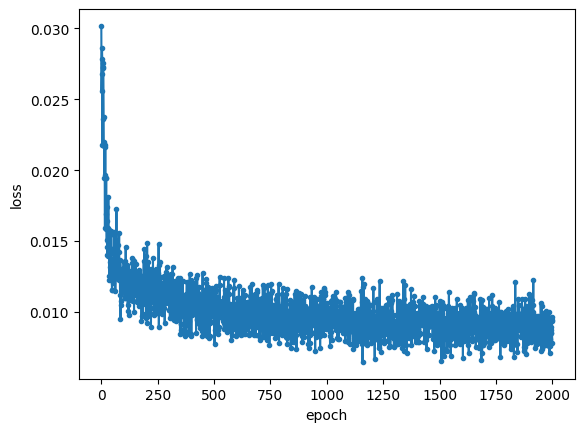

1/1 [==============================] - 0s 393ms/step


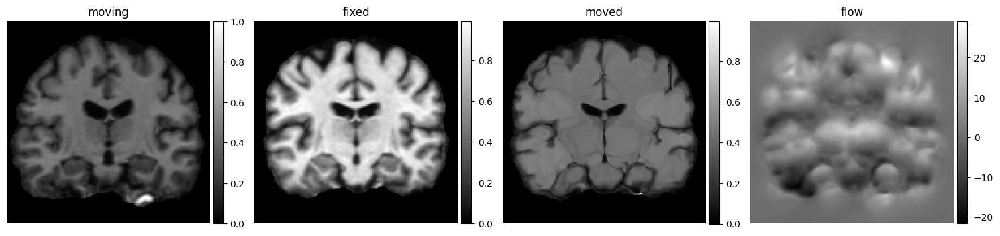

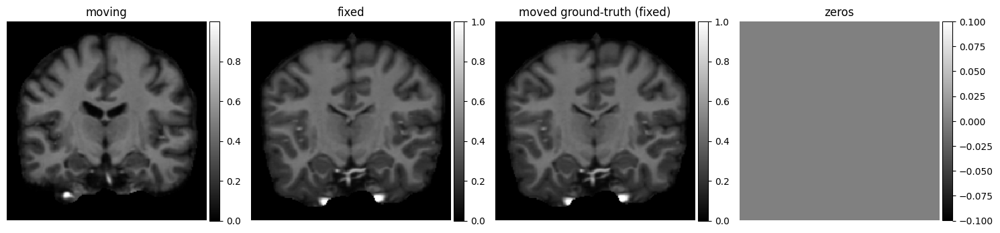

Epoch 1/2000
10/10 - 5s - loss: 0.0287 - vxm_dense_transformer_loss: 0.0287 - vxm_dense_flow_loss: 3.4622e-07 - val_loss: 0.0306 - val_vxm_dense_transformer_loss: 0.0306 - val_vxm_dense_flow_loss: 1.8327e-06 - 5s/epoch - 523ms/step
Epoch 2/2000
10/10 - 2s - loss: 0.0275 - vxm_dense_transformer_loss: 0.0275 - vxm_dense_flow_loss: 6.4345e-06 - val_loss: 0.0309 - val_vxm_dense_transformer_loss: 0.0309 - val_vxm_dense_flow_loss: 2.2078e-05 - 2s/epoch - 244ms/step
Epoch 3/2000
10/10 - 2s - loss: 0.0296 - vxm_dense_transformer_loss: 0.0296 - vxm_dense_flow_loss: 5.2069e-05 - val_loss: 0.0314 - val_vxm_dense_transformer_loss: 0.0314 - val_vxm_dense_flow_loss: 1.1218e-04 - 2s/epoch - 243ms/step
Epoch 4/2000
10/10 - 2s - loss: 0.0289 - vxm_dense_transformer_loss: 0.0289 - vxm_dense_flow_loss: 8.6248e-05 - val_loss: 0.0302 - val_vxm_dense_transformer_loss: 0.0302 - val_vxm_dense_flow_loss: 9.3430e-05 - 2s/epoch - 243ms/step
Epoch 5/2000
10/10 - 2s - loss: 0.0246 - vxm_dense_transformer_loss: 0.0

Epoch 38/2000
10/10 - 2s - loss: 0.0161 - vxm_dense_transformer_loss: 0.0147 - vxm_dense_flow_loss: 0.1441 - val_loss: 0.0168 - val_vxm_dense_transformer_loss: 0.0154 - val_vxm_dense_flow_loss: 0.1435 - 2s/epoch - 244ms/step
Epoch 39/2000
10/10 - 2s - loss: 0.0156 - vxm_dense_transformer_loss: 0.0143 - vxm_dense_flow_loss: 0.1242 - val_loss: 0.0183 - val_vxm_dense_transformer_loss: 0.0168 - val_vxm_dense_flow_loss: 0.1514 - 2s/epoch - 242ms/step
Epoch 40/2000
10/10 - 3s - loss: 0.0160 - vxm_dense_transformer_loss: 0.0145 - vxm_dense_flow_loss: 0.1477 - val_loss: 0.0180 - val_vxm_dense_transformer_loss: 0.0165 - val_vxm_dense_flow_loss: 0.1563 - 3s/epoch - 253ms/step
Epoch 41/2000
10/10 - 2s - loss: 0.0134 - vxm_dense_transformer_loss: 0.0122 - vxm_dense_flow_loss: 0.1204 - val_loss: 0.0175 - val_vxm_dense_transformer_loss: 0.0158 - val_vxm_dense_flow_loss: 0.1695 - 2s/epoch - 248ms/step
Epoch 42/2000
10/10 - 2s - loss: 0.0153 - vxm_dense_transformer_loss: 0.0140 - vxm_dense_flow_loss: 

Epoch 75/2000
10/10 - 3s - loss: 0.0137 - vxm_dense_transformer_loss: 0.0121 - vxm_dense_flow_loss: 0.1569 - val_loss: 0.0141 - val_vxm_dense_transformer_loss: 0.0125 - val_vxm_dense_flow_loss: 0.1659 - 3s/epoch - 256ms/step
Epoch 76/2000
10/10 - 3s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_loss: 0.1588 - val_loss: 0.0143 - val_vxm_dense_transformer_loss: 0.0125 - val_vxm_dense_flow_loss: 0.1786 - 3s/epoch - 256ms/step
Epoch 77/2000
10/10 - 3s - loss: 0.0139 - vxm_dense_transformer_loss: 0.0123 - vxm_dense_flow_loss: 0.1597 - val_loss: 0.0140 - val_vxm_dense_transformer_loss: 0.0122 - val_vxm_dense_flow_loss: 0.1729 - 3s/epoch - 261ms/step
Epoch 78/2000
10/10 - 3s - loss: 0.0141 - vxm_dense_transformer_loss: 0.0124 - vxm_dense_flow_loss: 0.1692 - val_loss: 0.0141 - val_vxm_dense_transformer_loss: 0.0123 - val_vxm_dense_flow_loss: 0.1743 - 3s/epoch - 264ms/step
Epoch 79/2000
10/10 - 2s - loss: 0.0128 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 

Epoch 112/2000
10/10 - 3s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0104 - vxm_dense_flow_loss: 0.1679 - val_loss: 0.0137 - val_vxm_dense_transformer_loss: 0.0118 - val_vxm_dense_flow_loss: 0.1898 - 3s/epoch - 253ms/step
Epoch 113/2000
10/10 - 3s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.1771 - val_loss: 0.0136 - val_vxm_dense_transformer_loss: 0.0116 - val_vxm_dense_flow_loss: 0.2036 - 3s/epoch - 259ms/step
Epoch 114/2000
10/10 - 3s - loss: 0.0149 - vxm_dense_transformer_loss: 0.0129 - vxm_dense_flow_loss: 0.1959 - val_loss: 0.0139 - val_vxm_dense_transformer_loss: 0.0119 - val_vxm_dense_flow_loss: 0.1956 - 3s/epoch - 257ms/step
Epoch 115/2000
10/10 - 3s - loss: 0.0133 - vxm_dense_transformer_loss: 0.0115 - vxm_dense_flow_loss: 0.1827 - val_loss: 0.0131 - val_vxm_dense_transformer_loss: 0.0110 - val_vxm_dense_flow_loss: 0.2096 - 3s/epoch - 254ms/step
Epoch 116/2000
10/10 - 3s - loss: 0.0140 - vxm_dense_transformer_loss: 0.0122 - vxm_dense_flow_l

Epoch 149/2000
10/10 - 2s - loss: 0.0143 - vxm_dense_transformer_loss: 0.0124 - vxm_dense_flow_loss: 0.1982 - val_loss: 0.0132 - val_vxm_dense_transformer_loss: 0.0113 - val_vxm_dense_flow_loss: 0.1942 - 2s/epoch - 244ms/step
Epoch 150/2000
10/10 - 3s - loss: 0.0138 - vxm_dense_transformer_loss: 0.0120 - vxm_dense_flow_loss: 0.1819 - val_loss: 0.0124 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.1967 - 3s/epoch - 253ms/step
Epoch 151/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.1865 - val_loss: 0.0137 - val_vxm_dense_transformer_loss: 0.0116 - val_vxm_dense_flow_loss: 0.2087 - 3s/epoch - 250ms/step
Epoch 152/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.1691 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2050 - 2s/epoch - 249ms/step
Epoch 153/2000
10/10 - 2s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_l

Epoch 186/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0107 - vxm_dense_flow_loss: 0.2032 - val_loss: 0.0128 - val_vxm_dense_transformer_loss: 0.0109 - val_vxm_dense_flow_loss: 0.1913 - 2s/epoch - 249ms/step
Epoch 187/2000
10/10 - 2s - loss: 0.0142 - vxm_dense_transformer_loss: 0.0123 - vxm_dense_flow_loss: 0.1927 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0108 - val_vxm_dense_flow_loss: 0.2085 - 2s/epoch - 246ms/step
Epoch 188/2000
10/10 - 2s - loss: 0.0135 - vxm_dense_transformer_loss: 0.0116 - vxm_dense_flow_loss: 0.1865 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.2087 - 2s/epoch - 242ms/step
Epoch 189/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0107 - vxm_dense_flow_loss: 0.1927 - val_loss: 0.0132 - val_vxm_dense_transformer_loss: 0.0111 - val_vxm_dense_flow_loss: 0.2101 - 2s/epoch - 249ms/step
Epoch 190/2000
10/10 - 2s - loss: 0.0138 - vxm_dense_transformer_loss: 0.0118 - vxm_dense_flow_l

Epoch 223/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1771 - val_loss: 0.0126 - val_vxm_dense_transformer_loss: 0.0106 - val_vxm_dense_flow_loss: 0.2029 - 3s/epoch - 254ms/step
Epoch 224/2000
10/10 - 2s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.1995 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.2110 - 2s/epoch - 244ms/step
Epoch 225/2000
10/10 - 3s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0104 - vxm_dense_flow_loss: 0.1966 - val_loss: 0.0135 - val_vxm_dense_transformer_loss: 0.0113 - val_vxm_dense_flow_loss: 0.2151 - 3s/epoch - 252ms/step
Epoch 226/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.1946 - val_loss: 0.0130 - val_vxm_dense_transformer_loss: 0.0109 - val_vxm_dense_flow_loss: 0.2100 - 2s/epoch - 243ms/step
Epoch 227/2000
10/10 - 2s - loss: 0.0131 - vxm_dense_transformer_loss: 0.0111 - vxm_dense_flow_l

Epoch 260/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.1972 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2088 - 3s/epoch - 252ms/step
Epoch 261/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1939 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2240 - 2s/epoch - 247ms/step
Epoch 262/2000
10/10 - 2s - loss: 0.0129 - vxm_dense_transformer_loss: 0.0109 - vxm_dense_flow_loss: 0.2051 - val_loss: 0.0129 - val_vxm_dense_transformer_loss: 0.0107 - val_vxm_dense_flow_loss: 0.2184 - 2s/epoch - 241ms/step
Epoch 263/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.2008 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2189 - 2s/epoch - 245ms/step
Epoch 264/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_l

Epoch 297/2000
10/10 - 2s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.2050 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.1976 - 2s/epoch - 249ms/step
Epoch 298/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0107 - vxm_dense_flow_loss: 0.2062 - val_loss: 0.0125 - val_vxm_dense_transformer_loss: 0.0102 - val_vxm_dense_flow_loss: 0.2217 - 2s/epoch - 250ms/step
Epoch 299/2000
10/10 - 2s - loss: 0.0139 - vxm_dense_transformer_loss: 0.0117 - vxm_dense_flow_loss: 0.2182 - val_loss: 0.0119 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2029 - 2s/epoch - 247ms/step
Epoch 300/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2011 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0103 - val_vxm_dense_flow_loss: 0.1965 - 2s/epoch - 245ms/step
Epoch 301/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_l

Epoch 334/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.2173 - val_loss: 0.0126 - val_vxm_dense_transformer_loss: 0.0104 - val_vxm_dense_flow_loss: 0.2190 - 2s/epoch - 239ms/step
Epoch 335/2000
10/10 - 2s - loss: 0.0128 - vxm_dense_transformer_loss: 0.0109 - vxm_dense_flow_loss: 0.1946 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2193 - 2s/epoch - 247ms/step
Epoch 336/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.2180 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0098 - val_vxm_dense_flow_loss: 0.2073 - 3s/epoch - 251ms/step
Epoch 337/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1812 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2130 - 2s/epoch - 245ms/step
Epoch 338/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_l

Epoch 371/2000
10/10 - 3s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.1886 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2213 - 3s/epoch - 257ms/step
Epoch 372/2000
10/10 - 2s - loss: 0.0132 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 0.2240 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2196 - 2s/epoch - 243ms/step
Epoch 373/2000
10/10 - 2s - loss: 0.0125 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.2319 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2212 - 2s/epoch - 242ms/step
Epoch 374/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.1979 - val_loss: 0.0122 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2149 - 2s/epoch - 243ms/step
Epoch 375/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_l

Epoch 408/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2044 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.1959 - 2s/epoch - 245ms/step
Epoch 409/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2013 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.1984 - 2s/epoch - 249ms/step
Epoch 410/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1912 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.1979 - 2s/epoch - 244ms/step
Epoch 411/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.1746 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2147 - 2s/epoch - 244ms/step
Epoch 412/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_l

Epoch 445/2000
10/10 - 2s - loss: 0.0127 - vxm_dense_transformer_loss: 0.0106 - vxm_dense_flow_loss: 0.2085 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2120 - 2s/epoch - 244ms/step
Epoch 446/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1954 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2087 - 2s/epoch - 238ms/step
Epoch 447/2000
10/10 - 2s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.2279 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2225 - 2s/epoch - 239ms/step
Epoch 448/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2007 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2272 - 2s/epoch - 232ms/step
Epoch 449/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_l

Epoch 482/2000
10/10 - 2s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_flow_loss: 0.2099 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2199 - 2s/epoch - 242ms/step
Epoch 483/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2071 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2146 - 2s/epoch - 241ms/step
Epoch 484/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.1888 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2146 - 2s/epoch - 250ms/step
Epoch 485/2000
10/10 - 2s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.2258 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2122 - 2s/epoch - 249ms/step
Epoch 486/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_l

Epoch 519/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1963 - val_loss: 0.0120 - val_vxm_dense_transformer_loss: 0.0099 - val_vxm_dense_flow_loss: 0.2111 - 2s/epoch - 249ms/step
Epoch 520/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2043 - val_loss: 0.0121 - val_vxm_dense_transformer_loss: 0.0100 - val_vxm_dense_flow_loss: 0.2189 - 2s/epoch - 246ms/step
Epoch 521/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2138 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.1998 - 2s/epoch - 250ms/step
Epoch 522/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.1957 - val_loss: 0.0123 - val_vxm_dense_transformer_loss: 0.0101 - val_vxm_dense_flow_loss: 0.2163 - 2s/epoch - 247ms/step
Epoch 523/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_l

Epoch 556/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1935 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2033 - 2s/epoch - 249ms/step
Epoch 557/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2082 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2099 - 2s/epoch - 244ms/step
Epoch 558/2000
10/10 - 3s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2154 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2153 - 3s/epoch - 258ms/step
Epoch 559/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2143 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2139 - 2s/epoch - 239ms/step
Epoch 560/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_l

Epoch 593/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2037 - val_loss: 0.0118 - val_vxm_dense_transformer_loss: 0.0097 - val_vxm_dense_flow_loss: 0.2045 - 2s/epoch - 234ms/step
Epoch 594/2000
10/10 - 3s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.2099 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.1995 - 3s/epoch - 257ms/step
Epoch 595/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2208 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2118 - 2s/epoch - 240ms/step
Epoch 596/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_loss: 0.2129 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2134 - 3s/epoch - 250ms/step
Epoch 597/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_l

Epoch 630/2000
10/10 - 2s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2081 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2207 - 2s/epoch - 239ms/step
Epoch 631/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2019 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0096 - val_vxm_dense_flow_loss: 0.2112 - 2s/epoch - 236ms/step
Epoch 632/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1904 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2106 - 2s/epoch - 248ms/step
Epoch 633/2000
10/10 - 2s - loss: 0.0130 - vxm_dense_transformer_loss: 0.0110 - vxm_dense_flow_loss: 0.2035 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2229 - 2s/epoch - 242ms/step
Epoch 634/2000
10/10 - 2s - loss: 0.0119 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_l

Epoch 667/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2315 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2094 - 2s/epoch - 246ms/step
Epoch 668/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2051 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2151 - 2s/epoch - 242ms/step
Epoch 669/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2155 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.1911 - 2s/epoch - 232ms/step
Epoch 670/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.1980 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2114 - 2s/epoch - 244ms/step
Epoch 671/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_l

Epoch 704/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2017 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2224 - 2s/epoch - 245ms/step
Epoch 705/2000
10/10 - 2s - loss: 0.0125 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_loss: 0.2369 - val_loss: 0.0115 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.2138 - 2s/epoch - 239ms/step
Epoch 706/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.1932 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2228 - 2s/epoch - 248ms/step
Epoch 707/2000
10/10 - 3s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0101 - vxm_dense_flow_loss: 0.2107 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2127 - 3s/epoch - 250ms/step
Epoch 708/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_l

Epoch 741/2000
10/10 - 2s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2028 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2100 - 2s/epoch - 249ms/step
Epoch 742/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2019 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2200 - 2s/epoch - 248ms/step
Epoch 743/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1985 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2138 - 2s/epoch - 245ms/step
Epoch 744/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2033 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2061 - 2s/epoch - 248ms/step
Epoch 745/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_l

Epoch 778/2000
10/10 - 2s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2344 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2194 - 2s/epoch - 241ms/step
Epoch 779/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2172 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2167 - 2s/epoch - 243ms/step
Epoch 780/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.1901 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2180 - 2s/epoch - 245ms/step
Epoch 781/2000
10/10 - 3s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2194 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2072 - 3s/epoch - 254ms/step
Epoch 782/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_l

Epoch 815/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2216 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0095 - val_vxm_dense_flow_loss: 0.2113 - 2s/epoch - 244ms/step
Epoch 816/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2079 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2181 - 2s/epoch - 243ms/step
Epoch 817/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2159 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2199 - 2s/epoch - 248ms/step
Epoch 818/2000
10/10 - 2s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.2160 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2113 - 2s/epoch - 246ms/step
Epoch 819/2000
10/10 - 2s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_l

Epoch 852/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2389 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2087 - 2s/epoch - 244ms/step
Epoch 853/2000
10/10 - 2s - loss: 0.0123 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_flow_loss: 0.2101 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2104 - 2s/epoch - 248ms/step
Epoch 854/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2061 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2123 - 2s/epoch - 241ms/step
Epoch 855/2000
10/10 - 2s - loss: 0.0110 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2189 - val_loss: 0.0114 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2173 - 2s/epoch - 238ms/step
Epoch 856/2000
10/10 - 3s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0059 - vxm_dense_flow_l

Epoch 889/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2051 - val_loss: 0.0116 - val_vxm_dense_transformer_loss: 0.0092 - val_vxm_dense_flow_loss: 0.2371 - 2s/epoch - 245ms/step
Epoch 890/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2204 - val_loss: 0.0112 - val_vxm_dense_transformer_loss: 0.0093 - val_vxm_dense_flow_loss: 0.1936 - 2s/epoch - 245ms/step
Epoch 891/2000
10/10 - 2s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2257 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2176 - 2s/epoch - 248ms/step
Epoch 892/2000
10/10 - 3s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2042 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2105 - 3s/epoch - 250ms/step
Epoch 893/2000
10/10 - 2s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_l

Epoch 926/2000
10/10 - 2s - loss: 0.0125 - vxm_dense_transformer_loss: 0.0103 - vxm_dense_flow_loss: 0.2148 - val_loss: 0.0117 - val_vxm_dense_transformer_loss: 0.0094 - val_vxm_dense_flow_loss: 0.2315 - 2s/epoch - 240ms/step
Epoch 927/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2063 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2199 - 2s/epoch - 247ms/step
Epoch 928/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1978 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2254 - 2s/epoch - 241ms/step
Epoch 929/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2087 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2192 - 2s/epoch - 243ms/step
Epoch 930/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_l

Epoch 963/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2035 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2161 - 2s/epoch - 245ms/step
Epoch 964/2000
10/10 - 2s - loss: 0.0116 - vxm_dense_transformer_loss: 0.0096 - vxm_dense_flow_loss: 0.2055 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2171 - 2s/epoch - 235ms/step
Epoch 965/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2157 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2171 - 2s/epoch - 237ms/step
Epoch 966/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1967 - val_loss: 0.0113 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.2242 - 2s/epoch - 244ms/step
Epoch 967/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_l

Epoch 1000/2000
10/10 - 2s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2153 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2152 - 2s/epoch - 241ms/step
Epoch 1001/2000
10/10 - 2s - loss: 0.0126 - vxm_dense_transformer_loss: 0.0105 - vxm_dense_flow_loss: 0.2105 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.1971 - 2s/epoch - 245ms/step
Epoch 1002/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2079 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0091 - val_vxm_dense_flow_loss: 0.1955 - 2s/epoch - 243ms/step
Epoch 1003/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1975 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.1953 - 2s/epoch - 242ms/step
Epoch 1004/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_f

Epoch 1037/2000
10/10 - 3s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2005 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2069 - 3s/epoch - 253ms/step
Epoch 1038/2000
10/10 - 3s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1936 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0089 - val_vxm_dense_flow_loss: 0.2225 - 3s/epoch - 251ms/step
Epoch 1039/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.1956 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2177 - 2s/epoch - 247ms/step
Epoch 1040/2000
10/10 - 3s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2124 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2085 - 3s/epoch - 251ms/step
Epoch 1041/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_f

Epoch 1074/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1982 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2243 - 2s/epoch - 238ms/step
Epoch 1075/2000
10/10 - 2s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2159 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2227 - 2s/epoch - 248ms/step
Epoch 1076/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2205 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2024 - 3s/epoch - 253ms/step
Epoch 1077/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2155 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2219 - 2s/epoch - 245ms/step
Epoch 1078/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_f

Epoch 1111/2000
10/10 - 3s - loss: 0.0120 - vxm_dense_transformer_loss: 0.0097 - vxm_dense_flow_loss: 0.2226 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2229 - 3s/epoch - 252ms/step
Epoch 1112/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2045 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2150 - 2s/epoch - 247ms/step
Epoch 1113/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2020 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2198 - 2s/epoch - 246ms/step
Epoch 1114/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2127 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2139 - 3s/epoch - 253ms/step
Epoch 1115/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_f

Epoch 1148/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.2080 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2077 - 2s/epoch - 238ms/step
Epoch 1149/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.1945 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2031 - 2s/epoch - 250ms/step
Epoch 1150/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.1879 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2050 - 2s/epoch - 245ms/step
Epoch 1151/2000
10/10 - 3s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1970 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2024 - 3s/epoch - 258ms/step
Epoch 1152/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_f

Epoch 1185/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2194 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2169 - 2s/epoch - 240ms/step
Epoch 1186/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2158 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2174 - 2s/epoch - 248ms/step
Epoch 1187/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.1978 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2116 - 2s/epoch - 242ms/step
Epoch 1188/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_flow_loss: 0.2053 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2159 - 2s/epoch - 247ms/step
Epoch 1189/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1222/2000
10/10 - 2s - loss: 0.0117 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2229 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2256 - 2s/epoch - 242ms/step
Epoch 1223/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2040 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2099 - 2s/epoch - 237ms/step
Epoch 1224/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.2085 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2048 - 2s/epoch - 237ms/step
Epoch 1225/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2200 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2289 - 2s/epoch - 235ms/step
Epoch 1226/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_f

Epoch 1259/2000
10/10 - 2s - loss: 0.0106 - vxm_dense_transformer_loss: 0.0088 - vxm_dense_flow_loss: 0.1847 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2220 - 2s/epoch - 244ms/step
Epoch 1260/2000
10/10 - 3s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1820 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2205 - 3s/epoch - 255ms/step
Epoch 1261/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.1923 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2155 - 2s/epoch - 249ms/step
Epoch 1262/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1901 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2161 - 2s/epoch - 241ms/step
Epoch 1263/2000
10/10 - 3s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_f

Epoch 1296/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2027 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2157 - 2s/epoch - 241ms/step
Epoch 1297/2000
10/10 - 3s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2011 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2098 - 3s/epoch - 253ms/step
Epoch 1298/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1948 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2094 - 2s/epoch - 248ms/step
Epoch 1299/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2033 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2140 - 2s/epoch - 245ms/step
Epoch 1300/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_f

Epoch 1333/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2146 - val_loss: 0.0111 - val_vxm_dense_transformer_loss: 0.0090 - val_vxm_dense_flow_loss: 0.2193 - 2s/epoch - 244ms/step
Epoch 1334/2000
10/10 - 2s - loss: 0.0081 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1730 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2045 - 2s/epoch - 242ms/step
Epoch 1335/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2037 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2177 - 2s/epoch - 239ms/step
Epoch 1336/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.2048 - val_loss: 0.0109 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2178 - 2s/epoch - 245ms/step
Epoch 1337/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_f

Epoch 1370/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2132 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2085 - 2s/epoch - 246ms/step
Epoch 1371/2000
10/10 - 2s - loss: 0.0068 - vxm_dense_transformer_loss: 0.0050 - vxm_dense_flow_loss: 0.1814 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2094 - 2s/epoch - 233ms/step
Epoch 1372/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_flow_loss: 0.2077 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2195 - 2s/epoch - 244ms/step
Epoch 1373/2000
10/10 - 2s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0089 - vxm_dense_flow_loss: 0.2001 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2073 - 2s/epoch - 237ms/step
Epoch 1374/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_f

Epoch 1407/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1939 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2174 - 2s/epoch - 248ms/step
Epoch 1408/2000
10/10 - 2s - loss: 0.0080 - vxm_dense_transformer_loss: 0.0061 - vxm_dense_flow_loss: 0.1905 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2165 - 2s/epoch - 249ms/step
Epoch 1409/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1981 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2227 - 2s/epoch - 240ms/step
Epoch 1410/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2010 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2163 - 2s/epoch - 249ms/step
Epoch 1411/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_f

Epoch 1444/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.1899 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.1974 - 2s/epoch - 246ms/step
Epoch 1445/2000
10/10 - 3s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2196 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2080 - 3s/epoch - 253ms/step
Epoch 1446/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.1910 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2107 - 2s/epoch - 249ms/step
Epoch 1447/2000
10/10 - 2s - loss: 0.0103 - vxm_dense_transformer_loss: 0.0082 - vxm_dense_flow_loss: 0.2097 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2156 - 2s/epoch - 247ms/step
Epoch 1448/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_f

Epoch 1481/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0079 - vxm_dense_flow_loss: 0.2202 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2173 - 2s/epoch - 248ms/step
Epoch 1482/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2056 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2021 - 2s/epoch - 241ms/step
Epoch 1483/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2132 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2151 - 2s/epoch - 250ms/step
Epoch 1484/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1904 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2160 - 2s/epoch - 248ms/step
Epoch 1485/2000
10/10 - 2s - loss: 0.0082 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_f

Epoch 1518/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2088 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2094 - 2s/epoch - 245ms/step
Epoch 1519/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2182 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2182 - 2s/epoch - 245ms/step
Epoch 1520/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_flow_loss: 0.2000 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2168 - 2s/epoch - 245ms/step
Epoch 1521/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1968 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2161 - 2s/epoch - 244ms/step
Epoch 1522/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1555/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2182 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2011 - 2s/epoch - 249ms/step
Epoch 1556/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0084 - vxm_dense_flow_loss: 0.2030 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2129 - 2s/epoch - 245ms/step
Epoch 1557/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2007 - val_loss: 0.0110 - val_vxm_dense_transformer_loss: 0.0088 - val_vxm_dense_flow_loss: 0.2109 - 2s/epoch - 245ms/step
Epoch 1558/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.1955 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2138 - 2s/epoch - 247ms/step
Epoch 1559/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0072 - vxm_dense_f

Epoch 1592/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0093 - vxm_dense_flow_loss: 0.2145 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0087 - val_vxm_dense_flow_loss: 0.2160 - 2s/epoch - 234ms/step
Epoch 1593/2000
10/10 - 2s - loss: 0.0090 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.1998 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2044 - 2s/epoch - 250ms/step
Epoch 1594/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2014 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2127 - 2s/epoch - 244ms/step
Epoch 1595/2000
10/10 - 2s - loss: 0.0089 - vxm_dense_transformer_loss: 0.0069 - vxm_dense_flow_loss: 0.2012 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2176 - 2s/epoch - 241ms/step
Epoch 1596/2000
10/10 - 2s - loss: 0.0122 - vxm_dense_transformer_loss: 0.0102 - vxm_dense_f

Epoch 1629/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2192 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2146 - 2s/epoch - 241ms/step
Epoch 1630/2000
10/10 - 3s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2110 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2153 - 3s/epoch - 252ms/step
Epoch 1631/2000
10/10 - 2s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0098 - vxm_dense_flow_loss: 0.2053 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2123 - 2s/epoch - 240ms/step
Epoch 1632/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2158 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2024 - 2s/epoch - 250ms/step
Epoch 1633/2000
10/10 - 2s - loss: 0.0113 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_f

Epoch 1666/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2253 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2139 - 2s/epoch - 242ms/step
Epoch 1667/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2096 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2185 - 2s/epoch - 248ms/step
Epoch 1668/2000
10/10 - 2s - loss: 0.0093 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.1823 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2183 - 2s/epoch - 239ms/step
Epoch 1669/2000
10/10 - 2s - loss: 0.0084 - vxm_dense_transformer_loss: 0.0063 - vxm_dense_flow_loss: 0.2122 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2039 - 2s/epoch - 248ms/step
Epoch 1670/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_f

Epoch 1703/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2060 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2127 - 2s/epoch - 234ms/step
Epoch 1704/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0070 - vxm_dense_flow_loss: 0.2195 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2151 - 2s/epoch - 243ms/step
Epoch 1705/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2093 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2231 - 2s/epoch - 237ms/step
Epoch 1706/2000
10/10 - 2s - loss: 0.0121 - vxm_dense_transformer_loss: 0.0100 - vxm_dense_flow_loss: 0.2094 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.2128 - 2s/epoch - 245ms/step
Epoch 1707/2000
10/10 - 3s - loss: 0.0115 - vxm_dense_transformer_loss: 0.0094 - vxm_dense_f

Epoch 1740/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0078 - vxm_dense_flow_loss: 0.2067 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2147 - 2s/epoch - 246ms/step
Epoch 1741/2000
10/10 - 3s - loss: 0.0104 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2105 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2074 - 3s/epoch - 251ms/step
Epoch 1742/2000
10/10 - 2s - loss: 0.0118 - vxm_dense_transformer_loss: 0.0095 - vxm_dense_flow_loss: 0.2267 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2064 - 2s/epoch - 245ms/step
Epoch 1743/2000
10/10 - 2s - loss: 0.0091 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.1986 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0085 - val_vxm_dense_flow_loss: 0.2103 - 2s/epoch - 245ms/step
Epoch 1744/2000
10/10 - 3s - loss: 0.0109 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_f

Epoch 1777/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2041 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2109 - 3s/epoch - 255ms/step
Epoch 1778/2000
10/10 - 3s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_flow_loss: 0.2110 - val_loss: 0.0101 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2171 - 3s/epoch - 252ms/step
Epoch 1779/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2118 - val_loss: 0.0108 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2190 - 2s/epoch - 245ms/step
Epoch 1780/2000
10/10 - 2s - loss: 0.0095 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2025 - val_loss: 0.0106 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2235 - 2s/epoch - 246ms/step
Epoch 1781/2000
10/10 - 2s - loss: 0.0092 - vxm_dense_transformer_loss: 0.0071 - vxm_dense_f

Epoch 1814/2000
10/10 - 2s - loss: 0.0114 - vxm_dense_transformer_loss: 0.0092 - vxm_dense_flow_loss: 0.2190 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2125 - 2s/epoch - 238ms/step
Epoch 1815/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.1950 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0086 - val_vxm_dense_flow_loss: 0.2099 - 2s/epoch - 242ms/step
Epoch 1816/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0075 - vxm_dense_flow_loss: 0.2098 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2215 - 2s/epoch - 238ms/step
Epoch 1817/2000
10/10 - 2s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0090 - vxm_dense_flow_loss: 0.2141 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0077 - val_vxm_dense_flow_loss: 0.2244 - 2s/epoch - 244ms/step
Epoch 1818/2000
10/10 - 2s - loss: 0.0099 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_f

Epoch 1851/2000
10/10 - 2s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0065 - vxm_dense_flow_loss: 0.1928 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2041 - 2s/epoch - 246ms/step
Epoch 1852/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0067 - vxm_dense_flow_loss: 0.2154 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2117 - 2s/epoch - 239ms/step
Epoch 1853/2000
10/10 - 2s - loss: 0.0112 - vxm_dense_transformer_loss: 0.0091 - vxm_dense_flow_loss: 0.2093 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2095 - 2s/epoch - 240ms/step
Epoch 1854/2000
10/10 - 2s - loss: 0.0083 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.1894 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2111 - 2s/epoch - 245ms/step
Epoch 1855/2000
10/10 - 2s - loss: 0.0096 - vxm_dense_transformer_loss: 0.0073 - vxm_dense_f

Epoch 1888/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.2031 - val_loss: 0.0098 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2192 - 2s/epoch - 247ms/step
Epoch 1889/2000
10/10 - 2s - loss: 0.0111 - vxm_dense_transformer_loss: 0.0087 - vxm_dense_flow_loss: 0.2353 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0080 - val_vxm_dense_flow_loss: 0.1958 - 2s/epoch - 244ms/step
Epoch 1890/2000
10/10 - 2s - loss: 0.0087 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.2095 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0076 - val_vxm_dense_flow_loss: 0.2083 - 2s/epoch - 239ms/step
Epoch 1891/2000
10/10 - 2s - loss: 0.0107 - vxm_dense_transformer_loss: 0.0086 - vxm_dense_flow_loss: 0.2152 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0081 - val_vxm_dense_flow_loss: 0.2101 - 2s/epoch - 249ms/step
Epoch 1892/2000
10/10 - 2s - loss: 0.0097 - vxm_dense_transformer_loss: 0.0077 - vxm_dense_f

Epoch 1925/2000
10/10 - 2s - loss: 0.0098 - vxm_dense_transformer_loss: 0.0076 - vxm_dense_flow_loss: 0.2203 - val_loss: 0.0104 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2183 - 2s/epoch - 248ms/step
Epoch 1926/2000
10/10 - 2s - loss: 0.0102 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.2013 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2112 - 2s/epoch - 248ms/step
Epoch 1927/2000
10/10 - 3s - loss: 0.0085 - vxm_dense_transformer_loss: 0.0064 - vxm_dense_flow_loss: 0.2099 - val_loss: 0.0103 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2123 - 3s/epoch - 250ms/step
Epoch 1928/2000
10/10 - 2s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0068 - vxm_dense_flow_loss: 0.2061 - val_loss: 0.0097 - val_vxm_dense_transformer_loss: 0.0075 - val_vxm_dense_flow_loss: 0.2152 - 2s/epoch - 244ms/step
Epoch 1929/2000
10/10 - 2s - loss: 0.0078 - vxm_dense_transformer_loss: 0.0058 - vxm_dense_f

Epoch 1962/2000
10/10 - 2s - loss: 0.0105 - vxm_dense_transformer_loss: 0.0083 - vxm_dense_flow_loss: 0.2121 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0078 - val_vxm_dense_flow_loss: 0.2191 - 2s/epoch - 243ms/step
Epoch 1963/2000
10/10 - 3s - loss: 0.0088 - vxm_dense_transformer_loss: 0.0066 - vxm_dense_flow_loss: 0.2153 - val_loss: 0.0107 - val_vxm_dense_transformer_loss: 0.0084 - val_vxm_dense_flow_loss: 0.2289 - 3s/epoch - 252ms/step
Epoch 1964/2000
10/10 - 2s - loss: 0.0094 - vxm_dense_transformer_loss: 0.0074 - vxm_dense_flow_loss: 0.2089 - val_loss: 0.0100 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.2138 - 2s/epoch - 244ms/step
Epoch 1965/2000
10/10 - 2s - loss: 0.0108 - vxm_dense_transformer_loss: 0.0085 - vxm_dense_flow_loss: 0.2216 - val_loss: 0.0105 - val_vxm_dense_transformer_loss: 0.0083 - val_vxm_dense_flow_loss: 0.2177 - 2s/epoch - 243ms/step
Epoch 1966/2000
10/10 - 2s - loss: 0.0081 - vxm_dense_transformer_loss: 0.0062 - vxm_dense_f

Epoch 1999/2000
10/10 - 2s - loss: 0.0101 - vxm_dense_transformer_loss: 0.0080 - vxm_dense_flow_loss: 0.2113 - val_loss: 0.0099 - val_vxm_dense_transformer_loss: 0.0079 - val_vxm_dense_flow_loss: 0.1964 - 2s/epoch - 247ms/step
Epoch 2000/2000
10/10 - 2s - loss: 0.0100 - vxm_dense_transformer_loss: 0.0081 - vxm_dense_flow_loss: 0.1874 - val_loss: 0.0102 - val_vxm_dense_transformer_loss: 0.0082 - val_vxm_dense_flow_loss: 0.2019 - 2s/epoch - 245ms/step


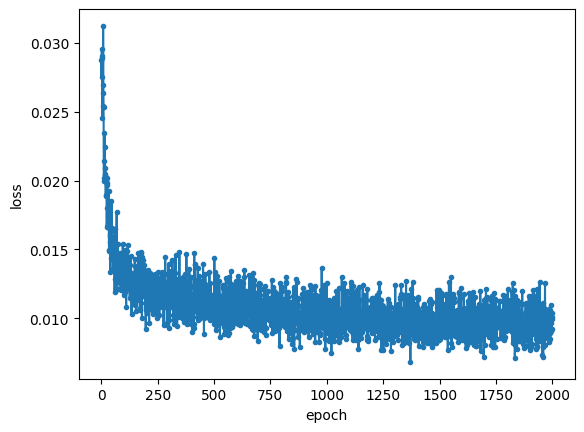

1/1 [==============================] - 0s 420ms/step


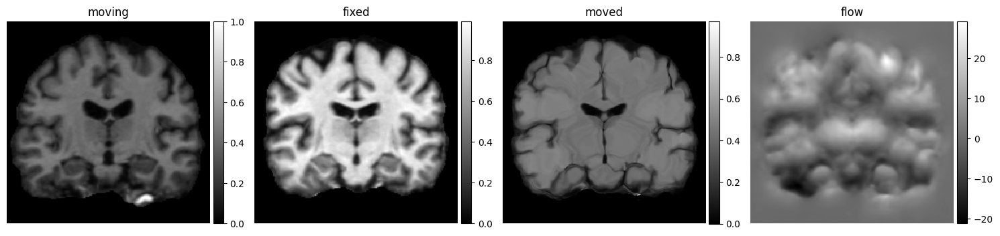

In [16]:
#Few shots training
for k in range(50, 250, 50):
    exec(f'Fshot_{k} = VxmTest()')
    exec(f'Fshot_{k}.CNNvxm(real_gen=few_generator_{k}, synth_gen=None, val_generator=val_generator)')
    exec(f'Fshot_{k}.train(total_epo = train_no)')
    exec(f'fshot_{k} = Fshot_{k}.RegPred(val_input)[1]')

1/1 [==============================] - 0s 389ms/step


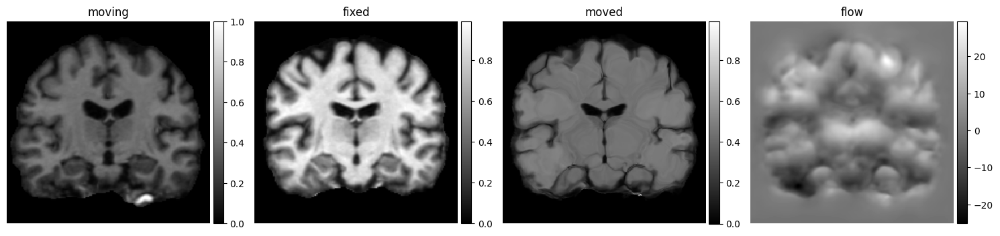

1/1 [==============================] - 0s 401ms/step


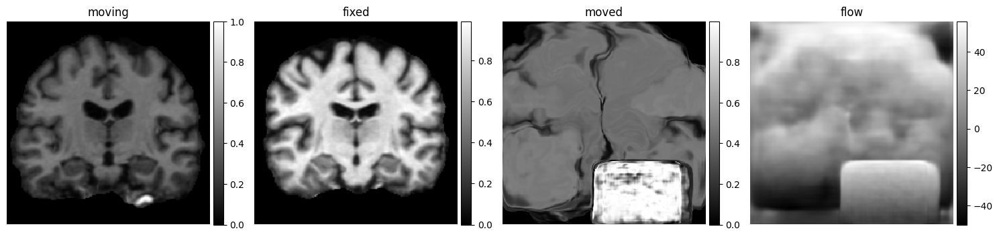

In [17]:
real = Real.RegPred(val_input)[1]
synth = Synth.RegPred(val_input)[1]

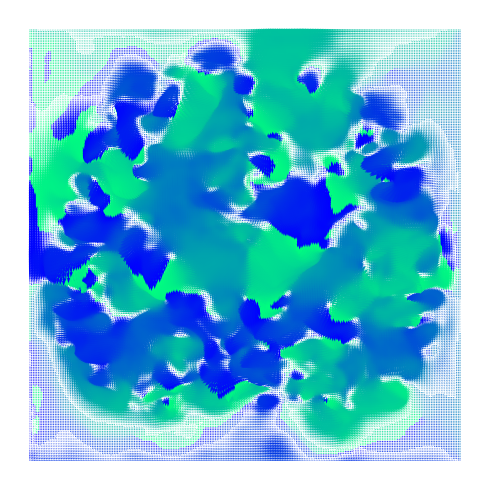

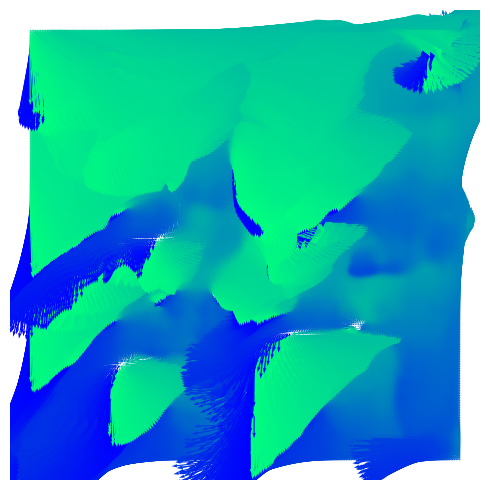

In [18]:
ne.plot.flow([real[1].squeeze()], width=5);
ne.plot.flow([synth[1].squeeze()], width=5);

In [19]:
# for k in range(5, 95, 5):
#     exec(f'ne.plot.flow([hybr_{k}[1].squeeze()],titles=k, width=5);')

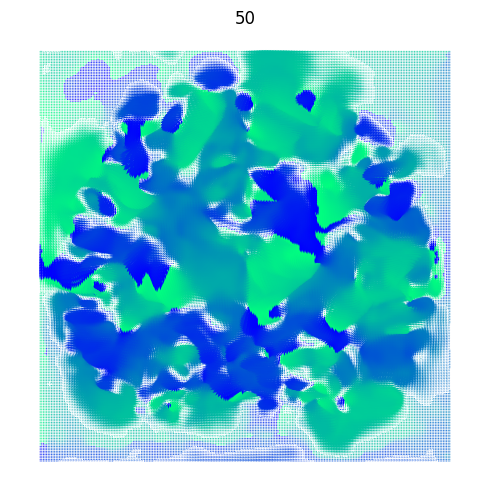

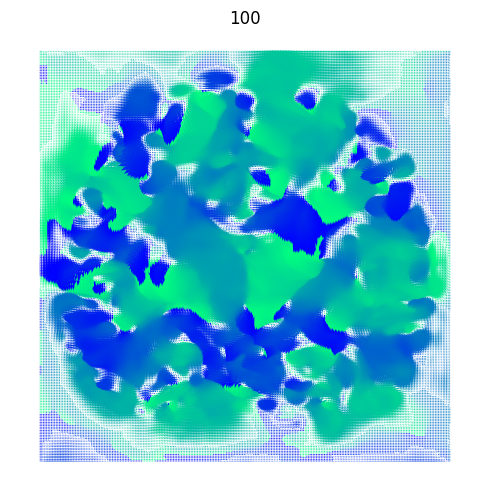

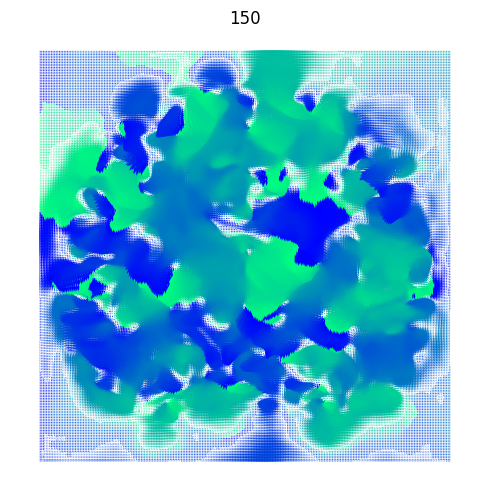

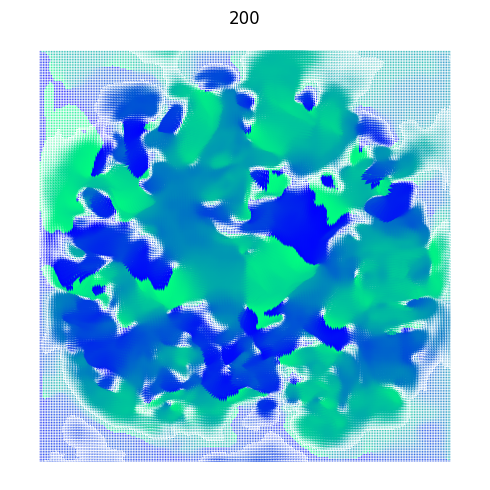

In [20]:
for k in range(50, 250, 50):
    exec(f'ne.plot.flow([fshot_{k}[1].squeeze()],titles=k, width=5);')